## Dataset Download

In [6]:
!gdown 1LQoyq_ZjHJih7hxJ2yJ_OrZhOIE_BZwB

Downloading...
From (original): https://drive.google.com/uc?id=1LQoyq_ZjHJih7hxJ2yJ_OrZhOIE_BZwB
From (redirected): https://drive.google.com/uc?id=1LQoyq_ZjHJih7hxJ2yJ_OrZhOIE_BZwB&confirm=t&uuid=472cd460-a091-4e7b-adfd-7a25c135ac90
To: /kaggle/working/depression_dataset_complete.zip
100%|████████████████████████████████████████| 652M/652M [00:11<00:00, 56.8MB/s]


In [7]:
!unzip depression_dataset_complete.zip > /dev/null

In [ ]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from transformers import AutoTokenizer, AutoModel, CLIPImageProcessor, CLIPVisionModel
from sklearn.metrics import precision_recall_fscore_support
from collections import Counter
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from tqdm import tqdm
from PIL import Image
import json
import math

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
BATCH_SIZE = 16
LR = 2e-5
MAX_LEN = 512
FUSION_DIM = 768
LABELS = ["Lack of Interest", "Feeling Down", "Eating Disorder",
          "Sleeping Disorder", "Low Self-Esteem", "Concentration Problem", "Self-Harm"]
LABEL_MAP = {label: i for i, label in enumerate(LABELS)}
NUM_CLASSES = len(LABELS)

## Custom Dataset

In [9]:
class MultimodalDepressionDataset(Dataset):
    def __init__(self, data, image_path, tokenizer, image_processor, max_len=512):
        self.data = data
        self.tokenizer = tokenizer
        self.image_processor = image_processor
        self.max_len = max_len
        self.img_path = image_path
        self.transform = transforms.Compose([
            transforms.Resize((224, 224)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        sample = self.data[idx]

        ocr_text = sample["ocr_text"]
        figurative_reasoning = sample["figurative_reasoning"]
        combined_text = ocr_text + " [SEP] " + figurative_reasoning

        encoding = self.tokenizer(
            combined_text,
            padding="max_length",
            truncation=True,
            max_length=self.max_len,
            return_tensors="pt",
        )

        image_path = os.path.join(self.img_path, sample["sample_id"] + ".jpeg")
        image = Image.open(image_path).convert("RGB")
        image_tensor = self.image_processor(image, return_tensors="pt")

        labels = torch.zeros(NUM_CLASSES)
        for category in sample["meme_depressive_categories"]:
            labels[LABEL_MAP[category]] = 1.0

        return {
            "input_ids": encoding["input_ids"].squeeze(0),
            "attention_mask": encoding["attention_mask"].squeeze(0),
            "image": image_tensor,
            "label": labels
        }

def custom_collate_fn(batch):
    input_ids = torch.stack([item['input_ids'] for item in batch])
    attention_mask = torch.stack([item['attention_mask'] for item in batch])
    labels = torch.stack([item['label'] for item in batch])

    images = {}
    for key in batch[0]['image'].keys():
        if isinstance(batch[0]['image'][key], torch.Tensor):
            images[key] = torch.stack([item['image'][key].squeeze(0) for item in batch])

    return {
        'input_ids': input_ids,
        'attention_mask': attention_mask,
        'image': images,
        'label': labels,
    }

## Model Definition

In [10]:
class CrossAttentionLayer(nn.Module):
    def __init__(self, hidden_size, num_attention_heads=8, dropout=0.1):
        super().__init__()
        self.num_attention_heads = num_attention_heads
        self.attention_head_size = hidden_size // num_attention_heads
        self.all_head_size = self.num_attention_heads * self.attention_head_size

        self.query = nn.Linear(hidden_size, self.all_head_size)
        self.key = nn.Linear(hidden_size, self.all_head_size)
        self.value = nn.Linear(hidden_size, self.all_head_size)

        self.output = nn.Linear(hidden_size, hidden_size)

        self.dropout = nn.Dropout(dropout)
        self.layer_norm = nn.LayerNorm(hidden_size)

        self.ffn = nn.Sequential(
            nn.Linear(hidden_size, hidden_size * 4),
            nn.GELU(),
            nn.Dropout(dropout),
            nn.Linear(hidden_size * 4, hidden_size),
            nn.Dropout(dropout)
        )
        self.ffn_layer_norm = nn.LayerNorm(hidden_size)

    def transpose_for_scores(self, x):
        new_x_shape = x.size()[:-1] + (self.num_attention_heads, self.attention_head_size)
        x = x.view(*new_x_shape)
        return x.permute(0, 2, 1, 3)

    def forward(self, x, context):
        mixed_query_layer = self.query(x)
        mixed_key_layer = self.key(context)
        mixed_value_layer = self.value(context)

        query_layer = self.transpose_for_scores(mixed_query_layer)
        key_layer = self.transpose_for_scores(mixed_key_layer)
        value_layer = self.transpose_for_scores(mixed_value_layer)

        attention_scores = torch.matmul(query_layer, key_layer.transpose(-1, -2))
        attention_scores = attention_scores / math.sqrt(self.attention_head_size)

        attention_probs = nn.Softmax(dim=-1)(attention_scores)
        attention_probs = self.dropout(attention_probs)

        context_layer = torch.matmul(attention_probs, value_layer)
        context_layer = context_layer.permute(0, 2, 1, 3).contiguous()
        new_context_layer_shape = context_layer.size()[:-2] + (self.all_head_size,)
        context_layer = context_layer.view(*new_context_layer_shape)

        attention_output = self.output(context_layer)
        attention_output = self.dropout(attention_output)
        attention_output = self.layer_norm(attention_output + x)

        ffn_output = self.ffn(attention_output)

        output = self.ffn_layer_norm(ffn_output + attention_output)

        return output

class MultimodalAttentionModel(nn.Module):
    def __init__(self, text_model_name="bert-base-uncased", num_classes=7, fusion_dim=768):
        super(MultimodalAttentionModel, self).__init__()

        self.text_encoder = AutoModel.from_pretrained(text_model_name)
        self.text_dim = self.text_encoder.config.hidden_size

        self.vision_encoder = CLIPVisionModel.from_pretrained("openai/clip-vit-base-patch32")
        self.vision_dim = self.vision_encoder.config.hidden_size

        self.text_dim = self.text_encoder.config.hidden_size
        self.vision_dim = self.vision_encoder.config.hidden_size
        fusion_dim = 1024
        contrastive_dim = 256

        self.text_projections = nn.ModuleList([
            nn.Linear(self.text_dim, fusion_dim) for _ in range(3)
        ])

        self.vision_projections = nn.ModuleList([
            nn.Linear(self.vision_dim, fusion_dim) for _ in range(3)
        ])

        self.co_attention_layers = nn.ModuleList([
            CrossAttentionLayer(fusion_dim) for _ in range(3)
        ])

        self.expert_nets = nn.ModuleList([
            nn.Sequential(
                nn.Linear(fusion_dim, fusion_dim),
                nn.LayerNorm(fusion_dim),
                nn.GELU(),
                nn.Dropout(0.2)
            ) for _ in range(4)
        ])

        self.moe_gate = nn.Linear(fusion_dim, 4)

        self.classifier = nn.Sequential(
            nn.Linear(fusion_dim, fusion_dim),
            nn.LayerNorm(fusion_dim),
            nn.GELU(),
            nn.Dropout(0.1),
            nn.Linear(fusion_dim, num_classes)
        )

        self.contrastive_projection = nn.Sequential(
            nn.Linear(fusion_dim, fusion_dim // 2),
            nn.LayerNorm(fusion_dim // 2),
            nn.GELU(),
            nn.Linear(fusion_dim // 2, contrastive_dim)
        )

        self.text_contrastive_proj = nn.Sequential(
            nn.Linear(self.text_dim, contrastive_dim),
            nn.LayerNorm(contrastive_dim),
            nn.GELU()
        )

        self.image_contrastive_proj = nn.Sequential(
            nn.Linear(self.vision_dim, contrastive_dim),
            nn.LayerNorm(contrastive_dim),
            nn.GELU()
        )

    def forward(self, input_ids, attention_mask, image_features, get_embeddings=False):
        text_outputs = self.text_encoder(input_ids=input_ids, attention_mask=attention_mask, output_hidden_states=True)
        text_features = [
            text_outputs.hidden_states[-i][:, 0] for i in range(1, 4)
        ]
        text_features = [
            proj(feat) for proj, feat in zip(self.text_projections, text_features)
        ]

        text_cls = text_outputs.last_hidden_state[:, 0]

        vision_outputs = self.vision_encoder(**image_features, output_hidden_states=True)
        vision_features = [
            vision_outputs.hidden_states[-i][:, 0] for i in range(1, 4)
        ]
        vision_features = [
            proj(feat) for proj, feat in zip(self.vision_projections, vision_features)
        ]

        image_cls = vision_outputs.pooler_output

        fused_features = []
        for text_feat, vision_feat, co_attn in zip(text_features, vision_features, self.co_attention_layers):
            fused_feat = co_attn(text_feat.unsqueeze(1), vision_feat.unsqueeze(1))
            fused_features.append(fused_feat.squeeze(1))

        combined_feature = sum(fused_features) / len(fused_features)

        expert_outputs = [expert(combined_feature) for expert in self.expert_nets]
        expert_gates = F.softmax(self.moe_gate(combined_feature), dim=1)

        moe_output = torch.zeros_like(expert_outputs[0])
        for i, expert_out in enumerate(expert_outputs):
            moe_output += expert_out * expert_gates[:, i].unsqueeze(1)

        logits = self.classifier(moe_output)

        multimodal_contrastive = self.contrastive_projection(moe_output)
        text_contrastive = self.text_contrastive_proj(text_cls)
        image_contrastive = self.image_contrastive_proj(image_cls)

        multimodal_contrastive = F.normalize(multimodal_contrastive, p=2, dim=1)
        text_contrastive = F.normalize(text_contrastive, p=2, dim=1)
        image_contrastive = F.normalize(image_contrastive, p=2, dim=1)

        if get_embeddings:
            return {
                "logits": logits,
                "multimodal_embedding": multimodal_contrastive,
                "text_embedding": text_contrastive,
                "image_embedding": image_contrastive
            }

        return logits

class ContrastiveLoss(nn.Module):
    def __init__(self, temperature=0.5):
        super().__init__()
        self.temperature = temperature
        self.criterion = nn.CrossEntropyLoss(reduction="sum")

    def forward(self, modal1, modal2):
        batch_size = modal1.shape[0]

        features = torch.cat([modal1, modal2], dim=0)
        similarity_matrix = torch.matmul(features, features.T)

        mask = (~torch.eye(2 * batch_size, dtype=bool, device=features.device)).float()

        similarity_matrix = similarity_matrix * mask
        similarity_matrix = similarity_matrix / self.temperature

        labels = torch.arange(batch_size, device=features.device, dtype=torch.long)
        labels = torch.cat([labels + batch_size, labels], dim=0)

        loss = self.criterion(similarity_matrix, labels)
        loss = loss / (2 * batch_size)

        return loss

## Training Functions

In [11]:
def train_multimodal_model(model, train_data, val_data, img_path, epochs, model_save_name):
    tokenizer = AutoTokenizer.from_pretrained("mental/mental-roberta-base")
    image_processor = CLIPImageProcessor.from_pretrained("openai/clip-vit-base-patch32")

    train_dataset = MultimodalDepressionDataset(train_data, os.path.join(img_path, "train"), tokenizer, image_processor, max_len=MAX_LEN)
    val_dataset = MultimodalDepressionDataset(val_data, os.path.join(img_path, "val"), tokenizer, image_processor, max_len=MAX_LEN)

    print("Train Set Size:", len(train_dataset))
    print("Validation Set Size:", len(val_dataset))

    train_loader = DataLoader(
        train_dataset,
        batch_size=BATCH_SIZE,
        shuffle=True,
        collate_fn=custom_collate_fn
    )

    val_loader = DataLoader(
        val_dataset,
        batch_size=BATCH_SIZE,
        shuffle=False,
        collate_fn=custom_collate_fn
    )

    optimizer = optim.AdamW(model.parameters(), lr=LR)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode='max', factor=0.5, patience=2, verbose=True
    )
    criterion = nn.BCEWithLogitsLoss()
    contrastive_criterion = ContrastiveLoss(temperature=0.07)
    contrastive_weight = 0.3
    
    model = model.to(DEVICE)
    model = nn.DataParallel(model)

    best_f1 = 0
    for epoch in range(epochs):
        print(f"\nEpoch {epoch+1}/{epochs}")
        
        model.train()
        train_loss = 0
        all_train_preds, all_train_labels = [], []
        
        for batch in tqdm(train_loader, desc="Training"):
            input_ids = batch["input_ids"].to(DEVICE)
            attention_mask = batch["attention_mask"].to(DEVICE)
            labels = batch["label"].to(DEVICE)
            image_features = {k: v.to(DEVICE) for k, v in batch["image"].items()}
            
            optimizer.zero_grad()
            outputs = model(input_ids, attention_mask, image_features, get_embeddings=True)
            logits = outputs["logits"]
            classification_loss = criterion(logits, labels)
            
            multimodal_text_loss = contrastive_criterion(
                outputs["multimodal_embedding"], 
                outputs["text_embedding"]
            )
            
            multimodal_image_loss = contrastive_criterion(
                outputs["multimodal_embedding"], 
                outputs["image_embedding"]
            )
            
            text_image_loss = contrastive_criterion(
                outputs["text_embedding"], 
                outputs["image_embedding"]
            )
            
            contrastive_loss = (multimodal_text_loss + multimodal_image_loss + text_image_loss) / 3
            loss = (1 - contrastive_weight) * classification_loss + contrastive_weight * contrastive_loss
            
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizer.step()
            
            train_loss += loss.item()
            with torch.no_grad():
                predictions = (torch.sigmoid(logits) > 0.5).float().cpu().numpy()
                all_train_preds.extend(predictions)
                all_train_labels.extend(labels.cpu().numpy())
        
        train_loss = train_loss / len(train_loader)
        train_metrics = compute_multilabel_metrics(np.array(all_train_labels), np.array(all_train_preds))
        
        print(f"Train Loss: {train_loss:.4f}")
        print(f"Train Macro-F1: {train_metrics['macro_f1']:.4f}, Weighted-F1: {train_metrics['weighted_f1']:.4f}")
        
        val_loss, val_metrics = evaluate_multimodal_model(
            model, val_loader, criterion
        )
        
        print(f"Validation Loss: {val_loss:.4f}")
        print(f"Validation Macro-F1: {val_metrics['macro_f1']:.4f}, Weighted-F1: {val_metrics['weighted_f1']:.4f}")
        
        scheduler.step(val_metrics['macro_f1'])
        
        f1_hm = 2 * val_metrics["macro_f1"] * val_metrics["weighted_f1"] / (val_metrics["macro_f1"] + val_metrics["weighted_f1"])
        if f1_hm > best_f1:
            best_f1 = f1_hm
            torch.save(model.state_dict(), f"{model_save_name}_depression.pth")
            print("Best model saved!")
        
    return model

def compute_multilabel_metrics(y_true, y_pred):
    macro_precision, macro_recall, macro_f1, _ = precision_recall_fscore_support(y_true, y_pred, average='macro')
    weighted_precision, weighted_recall, weighted_f1, _ = precision_recall_fscore_support(y_true, y_pred, average='weighted')
    
    per_class_precision, per_class_recall, per_class_f1, _ = precision_recall_fscore_support(y_true, y_pred, average=None)
    metrics = {
        'macro_precision': macro_precision,
        'macro_recall': macro_recall,
        'macro_f1': macro_f1,
        'weighted_precision': weighted_precision,
        'weighted_recall': weighted_recall,
        'weighted_f1': weighted_f1,
        'per_class_precision': per_class_precision,
        'per_class_recall': per_class_recall,
        'per_class_f1': per_class_f1
    }
    
    return metrics

def evaluate_multimodal_model(model, loader, criterion):
    model.eval()
    val_loss = 0
    all_val_preds, all_val_labels = [], []
    
    with torch.no_grad():
        for batch in tqdm(loader, desc="Evaluating"):
            input_ids = batch["input_ids"].to(DEVICE)
            attention_mask = batch["attention_mask"].to(DEVICE)
            labels = batch["label"].to(DEVICE)
            image_features = {k: v.to(DEVICE) for k, v in batch["image"].items()}
            
            logits = model(input_ids, attention_mask, image_features)
            loss = criterion(logits, labels)
            
            val_loss += loss.item()
            predictions = (torch.sigmoid(logits) > 0.5).float().cpu().numpy()
            all_val_preds.extend(predictions)
            all_val_labels.extend(labels.cpu().numpy())
    
    val_loss = val_loss / len(loader)
    val_metrics = compute_multilabel_metrics(np.array(all_val_labels), np.array(all_val_preds))
    
    print("\nPer-class metrics:")
    for i, label in enumerate(LABELS):
        print(f"{label}: F1={val_metrics['per_class_f1'][i]:.4f}, "
              f"Precision={val_metrics['per_class_precision'][i]:.4f}, "
              f"Recall={val_metrics['per_class_recall'][i]:.4f}")
    
    return val_loss, val_metrics

## Model Training

In [ ]:
train_data = json.load(open("depression_train_llava_dataset.json", "r"))
val_data = json.load(open("depression_val_llava_dataset.json", "r"))
test_data = json.load(open("depression_test_llava_dataset.json", "r"))

def print_class_distribution(dataset, dataset_name):
    label_counts = Counter([LABEL_MAP[i] for item in dataset for i in item["meme_depressive_categories"]])
    print(f"Class distribution in {dataset_name} dataset:")
    for label, count in sorted(label_counts.items()):
        print(f"  {LABELS[label]}: {count}")
    print("-----------------------------------")

print_class_distribution(train_data, "Train")
print_class_distribution(val_data, "Validation")
print_class_distribution(test_data, "Test")

img_path = "depressive_image"

tokenizer = AutoTokenizer.from_pretrained("mental/mental-roberta-base")
image_processor = CLIPImageProcessor.from_pretrained("openai/clip-vit-base-patch32")

test_dataset = MultimodalDepressionDataset(test_data, os.path.join(img_path, "test"), tokenizer, image_processor, max_len=MAX_LEN)
test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    collate_fn=custom_collate_fn
)

Class distribution in Train dataset:
  Lack of Interest: 471
  Feeling Down: 2085
  Eating Disorder: 1939
  Sleeping Disorder: 1562
  Low Self-Esteem: 855
  Concentration Problem: 595
  Self-Harm: 1516
-----------------------------------
Class distribution in Validation dataset:
  Lack of Interest: 45
  Feeling Down: 195
  Eating Disorder: 49
  Sleeping Disorder: 45
  Low Self-Esteem: 85
  Concentration Problem: 42
  Self-Harm: 61
-----------------------------------
Class distribution in Test dataset:
  Lack of Interest: 71
  Feeling Down: 218
  Eating Disorder: 92
  Sleeping Disorder: 79
  Low Self-Esteem: 114
  Concentration Problem: 66
  Self-Harm: 81
-----------------------------------


In [ ]:
model = MultimodalAttentionModel(
    text_model_name="mental/mental-roberta-base",
    num_classes=NUM_CLASSES,
    fusion_dim=FUSION_DIM
)

trained_model = train_multimodal_model(
    model,
    train_data,
    val_data,
    img_path,
    epochs=30,
    model_save_name="multimodal"
)

Train Set Size: 8722
Validation Set Size: 359


Some weights of RobertaModel were not initialized from the model checkpoint at mental/mental-roberta-base and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.



Epoch 1/30


Training: 100%|██████████| 546/546 [13:15<00:00,  1.46s/it]


Train Loss: 0.8296
Train Macro-F1: 0.2426, Weighted-F1: 0.3288


Evaluating: 100%|██████████| 23/23 [00:13<00:00,  1.67it/s]
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))



Per-class metrics:
Lack of Interest: F1=0.0000, Precision=0.0000, Recall=0.0000
Feeling Down: F1=0.4803, Precision=0.7976, Recall=0.3436
Eating Disorder: F1=0.7912, Precision=0.8571, Recall=0.7347
Sleeping Disorder: F1=0.7857, Precision=0.8462, Recall=0.7333
Low Self-Esteem: F1=0.0000, Precision=0.0000, Recall=0.0000
Concentration Problem: F1=0.1739, Precision=1.0000, Recall=0.0952
Self-Harm: F1=0.4773, Precision=0.7778, Recall=0.3443
Validation Loss: 0.3893
Validation Macro-F1: 0.3869, Weighted-F1: 0.3912
Best model saved!



Epoch 2/30


Training: 100%|██████████| 546/546 [13:21<00:00,  1.47s/it]


Train Loss: 0.3581
Train Macro-F1: 0.5736, Weighted-F1: 0.6458


Evaluating: 100%|██████████| 23/23 [00:14<00:00,  1.64it/s]



Per-class metrics:
Lack of Interest: F1=0.3509, Precision=0.8333, Recall=0.2222
Feeling Down: F1=0.4752, Precision=0.7701, Recall=0.3436
Eating Disorder: F1=0.7755, Precision=0.7755, Recall=0.7755
Sleeping Disorder: F1=0.6176, Precision=0.9130, Recall=0.4667
Low Self-Esteem: F1=0.0667, Precision=0.6000, Recall=0.0353
Concentration Problem: F1=0.6349, Precision=0.9524, Recall=0.4762
Self-Harm: F1=0.4737, Precision=0.5094, Recall=0.4426
Validation Loss: 0.3985
Validation Macro-F1: 0.4849, Weighted-F1: 0.4511
Best model saved!



Epoch 3/30


Training: 100%|██████████| 546/546 [13:17<00:00,  1.46s/it]


Train Loss: 0.2392
Train Macro-F1: 0.7258, Weighted-F1: 0.7500


Evaluating: 100%|██████████| 23/23 [00:13<00:00,  1.68it/s]



Per-class metrics:
Lack of Interest: F1=0.3636, Precision=1.0000, Recall=0.2222
Feeling Down: F1=0.6019, Precision=0.7742, Recall=0.4923
Eating Disorder: F1=0.8000, Precision=0.8261, Recall=0.7755
Sleeping Disorder: F1=0.7674, Precision=0.8049, Recall=0.7333
Low Self-Esteem: F1=0.1474, Precision=0.7000, Recall=0.0824
Concentration Problem: F1=0.6567, Precision=0.8800, Recall=0.5238
Self-Harm: F1=0.5636, Precision=0.6327, Recall=0.5082
Validation Loss: 0.3878
Validation Macro-F1: 0.5572, Weighted-F1: 0.5401
Best model saved!



Epoch 4/30


Training: 100%|██████████| 546/546 [13:16<00:00,  1.46s/it]


Train Loss: 0.1798
Train Macro-F1: 0.7850, Weighted-F1: 0.8070


Evaluating: 100%|██████████| 23/23 [00:14<00:00,  1.64it/s]



Per-class metrics:
Lack of Interest: F1=0.4000, Precision=0.8000, Recall=0.2667
Feeling Down: F1=0.6528, Precision=0.7746, Recall=0.5641
Eating Disorder: F1=0.8261, Precision=0.8837, Recall=0.7755
Sleeping Disorder: F1=0.7529, Precision=0.8000, Recall=0.7111
Low Self-Esteem: F1=0.2883, Precision=0.6154, Recall=0.1882
Concentration Problem: F1=0.7222, Precision=0.8667, Recall=0.6190
Self-Harm: F1=0.4946, Precision=0.7188, Recall=0.3770
Validation Loss: 0.4060
Validation Macro-F1: 0.5910, Weighted-F1: 0.5837
Best model saved!



Epoch 5/30


Training: 100%|██████████| 546/546 [13:17<00:00,  1.46s/it]


Train Loss: 0.1358
Train Macro-F1: 0.8509, Weighted-F1: 0.8681


Evaluating: 100%|██████████| 23/23 [00:13<00:00,  1.68it/s]



Per-class metrics:
Lack of Interest: F1=0.3509, Precision=0.8333, Recall=0.2222
Feeling Down: F1=0.6944, Precision=0.7576, Recall=0.6410
Eating Disorder: F1=0.7586, Precision=0.8684, Recall=0.6735
Sleeping Disorder: F1=0.6429, Precision=0.6923, Recall=0.6000
Low Self-Esteem: F1=0.1250, Precision=0.5455, Recall=0.0706
Concentration Problem: F1=0.7246, Precision=0.9259, Recall=0.5952
Self-Harm: F1=0.5926, Precision=0.6809, Recall=0.5246
Validation Loss: 0.4125
Validation Macro-F1: 0.5556, Weighted-F1: 0.5642



Epoch 6/30


Training: 100%|██████████| 546/546 [13:18<00:00,  1.46s/it]


Train Loss: 0.1060
Train Macro-F1: 0.8961, Weighted-F1: 0.9077


Evaluating: 100%|██████████| 23/23 [00:14<00:00,  1.64it/s]



Per-class metrics:
Lack of Interest: F1=0.3667, Precision=0.7333, Recall=0.2444
Feeling Down: F1=0.6287, Precision=0.7554, Recall=0.5385
Eating Disorder: F1=0.7800, Precision=0.7647, Recall=0.7959
Sleeping Disorder: F1=0.6977, Precision=0.7317, Recall=0.6667
Low Self-Esteem: F1=0.2655, Precision=0.5357, Recall=0.1765
Concentration Problem: F1=0.7143, Precision=0.8929, Recall=0.5952
Self-Harm: F1=0.5000, Precision=0.5490, Recall=0.4590
Validation Loss: 0.4684
Validation Macro-F1: 0.5647, Weighted-F1: 0.5590



Epoch 7/30


Training: 100%|██████████| 546/546 [13:18<00:00,  1.46s/it]


Train Loss: 0.0833
Train Macro-F1: 0.9280, Weighted-F1: 0.9339


Evaluating: 100%|██████████| 23/23 [00:13<00:00,  1.67it/s]



Per-class metrics:
Lack of Interest: F1=0.3448, Precision=0.7692, Recall=0.2222
Feeling Down: F1=0.5603, Precision=0.7679, Recall=0.4410
Eating Disorder: F1=0.8163, Precision=0.8163, Recall=0.8163
Sleeping Disorder: F1=0.6667, Precision=0.5119, Recall=0.9556
Low Self-Esteem: F1=0.3333, Precision=0.5122, Recall=0.2471
Concentration Problem: F1=0.7042, Precision=0.8621, Recall=0.5952
Self-Harm: F1=0.5155, Precision=0.6944, Recall=0.4098
Validation Loss: 0.5905
Validation Macro-F1: 0.5630, Weighted-F1: 0.5443



Epoch 8/30


Training: 100%|██████████| 546/546 [13:18<00:00,  1.46s/it]


Train Loss: 0.0556
Train Macro-F1: 0.9573, Weighted-F1: 0.9610


Evaluating: 100%|██████████| 23/23 [00:13<00:00,  1.66it/s]



Per-class metrics:
Lack of Interest: F1=0.3333, Precision=0.6667, Recall=0.2222
Feeling Down: F1=0.5882, Precision=0.7422, Recall=0.4872
Eating Disorder: F1=0.8172, Precision=0.8636, Recall=0.7755
Sleeping Disorder: F1=0.6582, Precision=0.7647, Recall=0.5778
Low Self-Esteem: F1=0.3206, Precision=0.4565, Recall=0.2471
Concentration Problem: F1=0.7042, Precision=0.8621, Recall=0.5952
Self-Harm: F1=0.5043, Precision=0.5370, Recall=0.4754
Validation Loss: 0.5508
Validation Macro-F1: 0.5609, Weighted-F1: 0.5497



Epoch 9/30


Training: 100%|██████████| 546/546 [13:22<00:00,  1.47s/it]


Train Loss: 0.0405
Train Macro-F1: 0.9735, Weighted-F1: 0.9748


Evaluating: 100%|██████████| 23/23 [00:13<00:00,  1.66it/s]



Per-class metrics:
Lack of Interest: F1=0.3333, Precision=0.6667, Recall=0.2222
Feeling Down: F1=0.6331, Precision=0.7483, Recall=0.5487
Eating Disorder: F1=0.8000, Precision=0.8261, Recall=0.7755
Sleeping Disorder: F1=0.6818, Precision=0.6977, Recall=0.6667
Low Self-Esteem: F1=0.3206, Precision=0.4565, Recall=0.2471
Concentration Problem: F1=0.7143, Precision=0.8929, Recall=0.5952
Self-Harm: F1=0.5321, Precision=0.6042, Recall=0.4754
Validation Loss: 0.5850
Validation Macro-F1: 0.5736, Weighted-F1: 0.5710



Epoch 10/30


Training: 100%|██████████| 546/546 [13:17<00:00,  1.46s/it]


Train Loss: 0.0343
Train Macro-F1: 0.9800, Weighted-F1: 0.9802


Evaluating: 100%|██████████| 23/23 [00:13<00:00,  1.68it/s]



Per-class metrics:
Lack of Interest: F1=0.3667, Precision=0.7333, Recall=0.2444
Feeling Down: F1=0.6416, Precision=0.7351, Recall=0.5692
Eating Disorder: F1=0.7429, Precision=0.6964, Recall=0.7959
Sleeping Disorder: F1=0.6667, Precision=0.7179, Recall=0.6222
Low Self-Esteem: F1=0.3000, Precision=0.5143, Recall=0.2118
Concentration Problem: F1=0.7222, Precision=0.8667, Recall=0.6190
Self-Harm: F1=0.6000, Precision=0.6735, Recall=0.5410
Validation Loss: 0.6218
Validation Macro-F1: 0.5771, Weighted-F1: 0.5756



Epoch 11/30


Training: 100%|██████████| 546/546 [13:24<00:00,  1.47s/it]


Train Loss: 0.0418
Train Macro-F1: 0.9745, Weighted-F1: 0.9759


Evaluating: 100%|██████████| 23/23 [00:14<00:00,  1.62it/s]



Per-class metrics:
Lack of Interest: F1=0.3438, Precision=0.5789, Recall=0.2444
Feeling Down: F1=0.6572, Precision=0.7342, Recall=0.5949
Eating Disorder: F1=0.8125, Precision=0.8298, Recall=0.7959
Sleeping Disorder: F1=0.7391, Precision=0.7234, Recall=0.7556
Low Self-Esteem: F1=0.3077, Precision=0.5625, Recall=0.2118
Concentration Problem: F1=0.7143, Precision=0.8929, Recall=0.5952
Self-Harm: F1=0.5505, Precision=0.6250, Recall=0.4918
Validation Loss: 0.6352
Validation Macro-F1: 0.5893, Weighted-F1: 0.5870
Best model saved!



Epoch 12/30


Training: 100%|██████████| 546/546 [13:23<00:00,  1.47s/it]


Train Loss: 0.0426
Train Macro-F1: 0.9753, Weighted-F1: 0.9753


Evaluating: 100%|██████████| 23/23 [00:14<00:00,  1.61it/s]



Per-class metrics:
Lack of Interest: F1=0.3571, Precision=0.9091, Recall=0.2222
Feeling Down: F1=0.6337, Precision=0.7315, Recall=0.5590
Eating Disorder: F1=0.8172, Precision=0.8636, Recall=0.7755
Sleeping Disorder: F1=0.6863, Precision=0.6140, Recall=0.7778
Low Self-Esteem: F1=0.3972, Precision=0.5000, Recall=0.3294
Concentration Problem: F1=0.7059, Precision=0.9231, Recall=0.5714
Self-Harm: F1=0.5505, Precision=0.6250, Recall=0.4918
Validation Loss: 0.6496
Validation Macro-F1: 0.5925, Weighted-F1: 0.5892
Best model saved!



Epoch 13/30


Training: 100%|██████████| 546/546 [13:21<00:00,  1.47s/it]


Train Loss: 0.0389
Train Macro-F1: 0.9753, Weighted-F1: 0.9758


Evaluating: 100%|██████████| 23/23 [00:13<00:00,  1.67it/s]



Per-class metrics:
Lack of Interest: F1=0.3448, Precision=0.7692, Recall=0.2222
Feeling Down: F1=0.6353, Precision=0.7448, Recall=0.5538
Eating Disorder: F1=0.7677, Precision=0.7600, Recall=0.7755
Sleeping Disorder: F1=0.7475, Precision=0.6852, Recall=0.8222
Low Self-Esteem: F1=0.2735, Precision=0.5000, Recall=0.1882
Concentration Problem: F1=0.7397, Precision=0.8710, Recall=0.6429
Self-Harm: F1=0.5841, Precision=0.6346, Recall=0.5410
Validation Loss: 0.6995
Validation Macro-F1: 0.5847, Weighted-F1: 0.5759



Epoch 14/30


Training: 100%|██████████| 546/546 [13:18<00:00,  1.46s/it]


Train Loss: 0.0358
Train Macro-F1: 0.9793, Weighted-F1: 0.9799


Evaluating: 100%|██████████| 23/23 [00:13<00:00,  1.67it/s]



Per-class metrics:
Lack of Interest: F1=0.3333, Precision=0.6667, Recall=0.2222
Feeling Down: F1=0.6923, Precision=0.7456, Recall=0.6462
Eating Disorder: F1=0.7917, Precision=0.8085, Recall=0.7755
Sleeping Disorder: F1=0.7529, Precision=0.8000, Recall=0.7111
Low Self-Esteem: F1=0.2018, Precision=0.4583, Recall=0.1294
Concentration Problem: F1=0.7123, Precision=0.8387, Recall=0.6190
Self-Harm: F1=0.5636, Precision=0.6327, Recall=0.5082
Validation Loss: 0.6812
Validation Macro-F1: 0.5783, Weighted-F1: 0.5826



Epoch 15/30


Training: 100%|██████████| 546/546 [13:24<00:00,  1.47s/it]


Train Loss: 0.0332
Train Macro-F1: 0.9808, Weighted-F1: 0.9809


Evaluating: 100%|██████████| 23/23 [00:13<00:00,  1.65it/s]



Per-class metrics:
Lack of Interest: F1=0.3438, Precision=0.5789, Recall=0.2444
Feeling Down: F1=0.6393, Precision=0.7466, Recall=0.5590
Eating Disorder: F1=0.7660, Precision=0.8000, Recall=0.7347
Sleeping Disorder: F1=0.6988, Precision=0.7632, Recall=0.6444
Low Self-Esteem: F1=0.3226, Precision=0.5128, Recall=0.2353
Concentration Problem: F1=0.7297, Precision=0.8438, Recall=0.6429
Self-Harm: F1=0.5872, Precision=0.6667, Recall=0.5246
Validation Loss: 0.7354
Validation Macro-F1: 0.5839, Weighted-F1: 0.5804



Epoch 16/30


Training: 100%|██████████| 546/546 [13:20<00:00,  1.47s/it]


Train Loss: 0.0224
Train Macro-F1: 0.9887, Weighted-F1: 0.9882


Evaluating: 100%|██████████| 23/23 [00:13<00:00,  1.68it/s]



Per-class metrics:
Lack of Interest: F1=0.3667, Precision=0.7333, Recall=0.2444
Feeling Down: F1=0.6291, Precision=0.7465, Recall=0.5436
Eating Disorder: F1=0.8000, Precision=0.8261, Recall=0.7755
Sleeping Disorder: F1=0.6977, Precision=0.7317, Recall=0.6667
Low Self-Esteem: F1=0.2645, Precision=0.4444, Recall=0.1882
Concentration Problem: F1=0.7397, Precision=0.8710, Recall=0.6429
Self-Harm: F1=0.6290, Precision=0.6190, Recall=0.6393
Validation Loss: 0.7425
Validation Macro-F1: 0.5895, Weighted-F1: 0.5779



Epoch 17/30


Training: 100%|██████████| 546/546 [13:24<00:00,  1.47s/it]


Train Loss: 0.0183
Train Macro-F1: 0.9905, Weighted-F1: 0.9901


Evaluating: 100%|██████████| 23/23 [00:14<00:00,  1.64it/s]



Per-class metrics:
Lack of Interest: F1=0.3729, Precision=0.7857, Recall=0.2444
Feeling Down: F1=0.6476, Precision=0.7338, Recall=0.5795
Eating Disorder: F1=0.7723, Precision=0.7500, Recall=0.7959
Sleeping Disorder: F1=0.7294, Precision=0.7750, Recall=0.6889
Low Self-Esteem: F1=0.3359, Precision=0.4783, Recall=0.2588
Concentration Problem: F1=0.7200, Precision=0.8182, Recall=0.6429
Self-Harm: F1=0.5586, Precision=0.6200, Recall=0.5082
Validation Loss: 0.7565
Validation Macro-F1: 0.5909, Weighted-F1: 0.5873



Epoch 18/30


Training: 100%|██████████| 546/546 [13:24<00:00,  1.47s/it]


Train Loss: 0.0160
Train Macro-F1: 0.9918, Weighted-F1: 0.9916


Evaluating: 100%|██████████| 23/23 [00:14<00:00,  1.61it/s]



Per-class metrics:
Lack of Interest: F1=0.3607, Precision=0.6875, Recall=0.2444
Feeling Down: F1=0.6135, Precision=0.7634, Recall=0.5128
Eating Disorder: F1=0.7835, Precision=0.7917, Recall=0.7755
Sleeping Disorder: F1=0.7391, Precision=0.7234, Recall=0.7556
Low Self-Esteem: F1=0.2927, Precision=0.4737, Recall=0.2118
Concentration Problem: F1=0.7500, Precision=0.9000, Recall=0.6429
Self-Harm: F1=0.5932, Precision=0.6140, Recall=0.5738
Validation Loss: 0.8016
Validation Macro-F1: 0.5904, Weighted-F1: 0.5749



Epoch 19/30


Training: 100%|██████████| 546/546 [13:23<00:00,  1.47s/it]


Train Loss: 0.0134
Train Macro-F1: 0.9941, Weighted-F1: 0.9938


Evaluating: 100%|██████████| 23/23 [00:13<00:00,  1.66it/s]



Per-class metrics:
Lack of Interest: F1=0.3448, Precision=0.7692, Recall=0.2222
Feeling Down: F1=0.6686, Precision=0.7548, Recall=0.6000
Eating Disorder: F1=0.7723, Precision=0.7500, Recall=0.7959
Sleeping Disorder: F1=0.7174, Precision=0.7021, Recall=0.7333
Low Self-Esteem: F1=0.2975, Precision=0.5000, Recall=0.2118
Concentration Problem: F1=0.7324, Precision=0.8966, Recall=0.6190
Self-Harm: F1=0.5946, Precision=0.6600, Recall=0.5410
Validation Loss: 0.7859
Validation Macro-F1: 0.5897, Weighted-F1: 0.5907



Epoch 20/30


Training: 100%|██████████| 546/546 [13:22<00:00,  1.47s/it]


Train Loss: 0.0120
Train Macro-F1: 0.9949, Weighted-F1: 0.9947


Evaluating: 100%|██████████| 23/23 [00:14<00:00,  1.62it/s]



Per-class metrics:
Lack of Interest: F1=0.3448, Precision=0.7692, Recall=0.2222
Feeling Down: F1=0.6246, Precision=0.7536, Recall=0.5333
Eating Disorder: F1=0.7959, Precision=0.7959, Recall=0.7959
Sleeping Disorder: F1=0.6977, Precision=0.7317, Recall=0.6667
Low Self-Esteem: F1=0.3101, Precision=0.4545, Recall=0.2353
Concentration Problem: F1=0.7324, Precision=0.8966, Recall=0.6190
Self-Harm: F1=0.5983, Precision=0.6250, Recall=0.5738
Validation Loss: 0.8054
Validation Macro-F1: 0.5863, Weighted-F1: 0.5773



Epoch 21/30


Training: 100%|██████████| 546/546 [12:20<00:00,  1.36s/it]


Train Loss: 0.8383
Train Macro-F1: 0.2365, Weighted-F1: 0.3176



Per-class metrics:
Lack of Interest: F1=0.0000, Precision=0.0000, Recall=0.0000
Feeling Down: F1=0.6082, Precision=0.7823, Recall=0.4974
Eating Disorder: F1=0.7255, Precision=0.6981, Recall=0.7551
Sleeping Disorder: F1=0.7250, Precision=0.8286, Recall=0.6444
Low Self-Esteem: F1=0.0000, Precision=0.0000, Recall=0.0000
Concentration Problem: F1=0.0000, Precision=0.0000, Recall=0.0000
Self-Harm: F1=0.3810, Precision=0.6957, Recall=0.2623
Validation Loss: 0.3931
Validation Macro-F1: 0.3485, Weighted-F1: 0.4023
Best model saved!



Epoch 22/30


Training: 100%|██████████| 546/546 [12:22<00:00,  1.36s/it]


Train Loss: 0.3545
Train Macro-F1: 0.5632, Weighted-F1: 0.6405


Evaluating: 100%|██████████| 23/23 [00:13<00:00,  1.72it/s]



Per-class metrics:
Lack of Interest: F1=0.3333, Precision=1.0000, Recall=0.2000
Feeling Down: F1=0.5172, Precision=0.7895, Recall=0.3846
Eating Disorder: F1=0.7677, Precision=0.7600, Recall=0.7755
Sleeping Disorder: F1=0.7273, Precision=0.7442, Recall=0.7111
Low Self-Esteem: F1=0.0851, Precision=0.4444, Recall=0.0471
Concentration Problem: F1=0.6562, Precision=0.9545, Recall=0.5000
Self-Harm: F1=0.5631, Precision=0.6905, Recall=0.4754
Validation Loss: 0.3902
Validation Macro-F1: 0.5214, Weighted-F1: 0.4892
Best model saved!



Epoch 23/30


Training: 100%|██████████| 546/546 [12:48<00:00,  1.41s/it]


Train Loss: 0.2432
Train Macro-F1: 0.7139, Weighted-F1: 0.7414


Evaluating: 100%|██████████| 23/23 [00:13<00:00,  1.72it/s]



Per-class metrics:
Lack of Interest: F1=0.3390, Precision=0.7143, Recall=0.2222
Feeling Down: F1=0.5687, Precision=0.7542, Recall=0.4564
Eating Disorder: F1=0.7677, Precision=0.7600, Recall=0.7755
Sleeping Disorder: F1=0.7179, Precision=0.8485, Recall=0.6222
Low Self-Esteem: F1=0.0860, Precision=0.5000, Recall=0.0471
Concentration Problem: F1=0.7606, Precision=0.9310, Recall=0.6429
Self-Harm: F1=0.5528, Precision=0.5484, Recall=0.5574
Validation Loss: 0.4128
Validation Macro-F1: 0.5418, Weighted-F1: 0.5154
Best model saved!



Epoch 24/30


Training: 100%|██████████| 546/546 [12:31<00:00,  1.38s/it]


Train Loss: 0.1822
Train Macro-F1: 0.7840, Weighted-F1: 0.8057


Evaluating: 100%|██████████| 23/23 [00:13<00:00,  1.75it/s]



Per-class metrics:
Lack of Interest: F1=0.3934, Precision=0.7500, Recall=0.2667
Feeling Down: F1=0.4493, Precision=0.7654, Recall=0.3179
Eating Disorder: F1=0.6972, Precision=0.6333, Recall=0.7755
Sleeping Disorder: F1=0.7209, Precision=0.7561, Recall=0.6889
Low Self-Esteem: F1=0.2804, Precision=0.6818, Recall=0.1765
Concentration Problem: F1=0.7733, Precision=0.8788, Recall=0.6905
Self-Harm: F1=0.5385, Precision=0.6512, Recall=0.4590
Validation Loss: 0.4567
Validation Macro-F1: 0.5504, Weighted-F1: 0.5002
Best model saved!



Epoch 25/30


Training: 100%|██████████| 546/546 [12:23<00:00,  1.36s/it]


Train Loss: 0.1383
Train Macro-F1: 0.8443, Weighted-F1: 0.8613


Evaluating: 100%|██████████| 23/23 [00:13<00:00,  1.76it/s]



Per-class metrics:
Lack of Interest: F1=0.3448, Precision=0.7692, Recall=0.2222
Feeling Down: F1=0.7022, Precision=0.7764, Recall=0.6410
Eating Disorder: F1=0.7835, Precision=0.7917, Recall=0.7755
Sleeping Disorder: F1=0.6667, Precision=0.6667, Recall=0.6667
Low Self-Esteem: F1=0.1200, Precision=0.4000, Recall=0.0706
Concentration Problem: F1=0.7059, Precision=0.9231, Recall=0.5714
Self-Harm: F1=0.4565, Precision=0.6774, Recall=0.3443
Validation Loss: 0.4360
Validation Macro-F1: 0.5400, Weighted-F1: 0.5528



Epoch 26/30


Training: 100%|██████████| 546/546 [12:20<00:00,  1.36s/it]


Train Loss: 0.1083
Train Macro-F1: 0.8906, Weighted-F1: 0.9028


Evaluating: 100%|██████████| 23/23 [00:12<00:00,  1.77it/s]



Per-class metrics:
Lack of Interest: F1=0.3279, Precision=0.6250, Recall=0.2222
Feeling Down: F1=0.6590, Precision=0.7550, Recall=0.5846
Eating Disorder: F1=0.7451, Precision=0.7170, Recall=0.7755
Sleeping Disorder: F1=0.6744, Precision=0.7073, Recall=0.6444
Low Self-Esteem: F1=0.1800, Precision=0.6000, Recall=0.1059
Concentration Problem: F1=0.7222, Precision=0.8667, Recall=0.6190
Self-Harm: F1=0.5882, Precision=0.7317, Recall=0.4918
Validation Loss: 0.4603
Validation Macro-F1: 0.5567, Weighted-F1: 0.5587
Best model saved!



Epoch 27/30


Training: 100%|██████████| 546/546 [12:26<00:00,  1.37s/it]


Train Loss: 0.0829
Train Macro-F1: 0.9237, Weighted-F1: 0.9312


Evaluating: 100%|██████████| 23/23 [00:13<00:00,  1.71it/s]



Per-class metrics:
Lack of Interest: F1=0.3492, Precision=0.6111, Recall=0.2444
Feeling Down: F1=0.5823, Precision=0.7603, Recall=0.4718
Eating Disorder: F1=0.7647, Precision=0.7358, Recall=0.7959
Sleeping Disorder: F1=0.7021, Precision=0.6735, Recall=0.7333
Low Self-Esteem: F1=0.2124, Precision=0.4286, Recall=0.1412
Concentration Problem: F1=0.7143, Precision=0.8929, Recall=0.5952
Self-Harm: F1=0.5741, Precision=0.6596, Recall=0.5082
Validation Loss: 0.5330
Validation Macro-F1: 0.5570, Weighted-F1: 0.5391
Best model saved!



Epoch 28/30


Training: 100%|██████████| 546/546 [12:43<00:00,  1.40s/it]


Train Loss: 0.0667
Train Macro-F1: 0.9449, Weighted-F1: 0.9503


Evaluating: 100%|██████████| 23/23 [00:13<00:00,  1.76it/s]



Per-class metrics:
Lack of Interest: F1=0.3667, Precision=0.7333, Recall=0.2444
Feeling Down: F1=0.6192, Precision=0.7812, Recall=0.5128
Eating Disorder: F1=0.7629, Precision=0.7708, Recall=0.7551
Sleeping Disorder: F1=0.5909, Precision=0.6047, Recall=0.5778
Low Self-Esteem: F1=0.1553, Precision=0.4444, Recall=0.0941
Concentration Problem: F1=0.7324, Precision=0.8966, Recall=0.6190
Self-Harm: F1=0.5802, Precision=0.5429, Recall=0.6230
Validation Loss: 0.5968
Validation Macro-F1: 0.5439, Weighted-F1: 0.5375



Epoch 29/30


Training: 100%|██████████| 546/546 [12:21<00:00,  1.36s/it]


Train Loss: 0.0566
Train Macro-F1: 0.9595, Weighted-F1: 0.9617


Evaluating: 100%|██████████| 23/23 [00:12<00:00,  1.78it/s]



Per-class metrics:
Lack of Interest: F1=0.3448, Precision=0.7692, Recall=0.2222
Feeling Down: F1=0.6609, Precision=0.7516, Recall=0.5897
Eating Disorder: F1=0.7600, Precision=0.7451, Recall=0.7755
Sleeping Disorder: F1=0.6739, Precision=0.6596, Recall=0.6889
Low Self-Esteem: F1=0.2385, Precision=0.5417, Recall=0.1529
Concentration Problem: F1=0.7467, Precision=0.8485, Recall=0.6667
Self-Harm: F1=0.6018, Precision=0.6538, Recall=0.5574
Validation Loss: 0.5818
Validation Macro-F1: 0.5752, Weighted-F1: 0.5753
Best model saved!



Epoch 30/30


Training: 100%|██████████| 546/546 [12:29<00:00,  1.37s/it]


Train Loss: 0.0486
Train Macro-F1: 0.9684, Weighted-F1: 0.9682


Evaluating: 100%|██████████| 23/23 [00:13<00:00,  1.73it/s]



Per-class metrics:
Lack of Interest: F1=0.3571, Precision=0.9091, Recall=0.2222
Feeling Down: F1=0.6201, Precision=0.7612, Recall=0.5231
Eating Disorder: F1=0.7238, Precision=0.6786, Recall=0.7755
Sleeping Disorder: F1=0.7083, Precision=0.6667, Recall=0.7556
Low Self-Esteem: F1=0.3279, Precision=0.5405, Recall=0.2353
Concentration Problem: F1=0.7397, Precision=0.8710, Recall=0.6429
Self-Harm: F1=0.5714, Precision=0.6818, Recall=0.4918
Validation Loss: 0.6404
Validation Macro-F1: 0.5783, Weighted-F1: 0.5711
Best model saved!


## Inference

In [14]:
!gdown 1WGVLdLLJmz5aRu7Xj175sIul4ViqA6Dp

Downloading...
From (original): https://drive.google.com/uc?id=1WGVLdLLJmz5aRu7Xj175sIul4ViqA6Dp
From (redirected): https://drive.google.com/uc?id=1WGVLdLLJmz5aRu7Xj175sIul4ViqA6Dp&confirm=t&uuid=ed44914e-206b-48ec-8003-2172a2714ef3
To: /kaggle/working/multimodal_depression.pth
100%|██████████████████████████████████████| 1.04G/1.04G [00:12<00:00, 85.8MB/s]


In [ ]:
def inference(test_data, model_path):
    model = MultimodalAttentionModel(
        text_model_name="mental/mental-roberta-base",
        num_classes=NUM_CLASSES,
        fusion_dim=FUSION_DIM
    )
    
    model = model.to(DEVICE)

    weights = torch.load(model_path, map_location=DEVICE, weights_only=True)
    weights_single = {k.replace("module.", ""): v for k, v in weights.items()}

    model.load_state_dict(weights_single)
    tokenizer = AutoTokenizer.from_pretrained("mental/mental-roberta-base")
    image_processor = CLIPImageProcessor.from_pretrained("openai/clip-vit-base-patch32")

    test_dataset = MultimodalDepressionDataset(test_data, os.path.join(img_path, "test"), tokenizer, image_processor, max_len=MAX_LEN)
    test_loader = DataLoader(
        test_dataset,
        batch_size=BATCH_SIZE,
        shuffle=False,
        collate_fn=custom_collate_fn
    )

    loss, metrics = evaluate_multimodal_model(
        model, test_loader, nn.BCEWithLogitsLoss()
    )

    print(f"Test Loss: {loss:.4f}")
    print(f"Test Macro-F1: {metrics['macro_f1']:.4f}, Weighted-F1: {metrics['weighted_f1']:.4f}")

In [25]:
inference(test_data, "multimodal_depression.pth")

Some weights of RobertaModel were not initialized from the model checkpoint at mental/mental-roberta-base and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Evaluating: 100%|██████████| 33/33 [00:24<00:00,  1.32it/s]


Per-class metrics:
Lack of Interest: F1=0.4842, Precision=0.9583, Recall=0.3239
Feeling Down: F1=0.7259, Precision=0.7861, Recall=0.6743
Eating Disorder: F1=0.7849, Precision=0.7766, Recall=0.7935
Sleeping Disorder: F1=0.7338, Precision=0.8500, Recall=0.6456
Low Self-Esteem: F1=0.4301, Precision=0.5556, Recall=0.3509
Concentration Problem: F1=0.8448, Precision=0.9800, Recall=0.7424
Self-Harm: F1=0.6203, Precision=0.6364, Recall=0.6049
Test Loss: 0.6510
Test Macro-F1: 0.6606, Weighted-F1: 0.6628


## Error Analysis

In [ ]:
def evaluate_multimodal_misclassified(model, loader, criterion, data, num_misclassified=3):
    model.eval()
    val_loss = 0
    val_preds, val_labels = [], []
    
    misclassified_examples = {}
    
    with torch.no_grad():
        batch_idx = 0
        for batch in tqdm(loader, desc="Evaluating"):
            input_ids = batch["input_ids"].to(DEVICE)
            attention_mask = batch["attention_mask"].to(DEVICE)
            labels = batch["label"].to(DEVICE)
            image_features = batch["image"]
            
            for k, v in image_features.items():
                image_features[k] = v.to(DEVICE)
            
            logits = model(input_ids, attention_mask, image_features)
            loss = criterion(logits, labels)
            
            val_loss += loss.item()
            predictions = (torch.sigmoid(logits) > 0.5).float().cpu().numpy()
            
            val_preds.extend(predictions)
            val_labels.extend(labels.cpu().numpy())
            
            for i, (pred, label) in enumerate(zip(predictions, labels.cpu().numpy())):
                if not np.array_equal(pred, label):
                    global_idx = batch_idx * loader.batch_size + i
                    if global_idx < len(data):
                        sample = data[global_idx]
                        ocr_text = sample.get("ocr_text", "")
                        figurative_reasoning = sample.get("figurative_reasoning", "")
                        sample_id = sample.get("sample_id", f"unknown_{global_idx}")
                    else:
                        ocr_text = ""
                        figurative_reasoning = ""
                        sample_id = f"unknown_{global_idx}"
                    
                    orig_img = image_features.get('pixel_values')[i].cpu()
                    
                    misclassified_classes = np.where(pred != label)[0]
                    confidence_scores = torch.sigmoid(logits[i]).cpu().numpy()
                    
                    misclass_sample = {
                        'pred': pred,
                        'label': label,
                        'misclassified_classes': misclassified_classes,
                        'confidence': confidence_scores,
                        'image': orig_img,
                        'ocr_text': ocr_text,
                        'figurative_reasoning': figurative_reasoning,
                        'sample_id': sample_id
                    }
                    
                    error_pattern = tuple(misclassified_classes)
                    if error_pattern not in misclassified_examples:
                        misclassified_examples[error_pattern] = []
                    
                    misclassified_examples[error_pattern].append(misclass_sample)
            
            batch_idx += 1
    
    val_loss = val_loss / len(loader)

    val_metrics = compute_multilabel_metrics(np.array(val_labels), np.array(val_preds))
    val_macro_f1 = val_metrics['macro_f1']
    val_weighted_f1 = val_metrics['weighted_f1']

    print("\n-------Per-class metrics:-------")
    for i, label in enumerate(LABELS):
        print(f"{label}: F1={val_metrics['per_class_f1'][i]:.4f}, "
              f"Precision={val_metrics['per_class_precision'][i]:.4f}, "
              f"Recall={val_metrics['per_class_recall'][i]:.4f}")
    print("-----------------------------------")
    
    representative_examples = {}
    for error_pattern, examples in misclassified_examples.items():
        sorted_examples = sorted(examples, 
                                key=lambda x: np.mean([x['confidence'][c] for c in x['misclassified_classes']]), 
                                reverse=True)
        representative_examples[error_pattern] = sorted_examples[:num_misclassified]
    
    return val_loss, val_macro_f1, val_weighted_f1, representative_examples

def display_misclassified_examples(misclassified_examples, label_map=None):
    reverse_label_map = {v: k for k, v in label_map.items()} if label_map else None
 
    for error_pattern, examples in misclassified_examples.items():
        class_names = [reverse_label_map[c] if reverse_label_map else f"Class {c}" for c in error_pattern]
        print(f"\n--- Misclassified examples for error pattern: {', '.join(class_names)} ---")
        
        for i, example in enumerate(examples):
            print(f"\nExample {i+1} (ID: {example['sample_id']}):")
            
            for cls_idx in example['misclassified_classes']:
                cls_name = reverse_label_map[cls_idx] if reverse_label_map else f"Class {cls_idx}"
                pred_value = example['pred'][cls_idx]
                true_value = example['label'][cls_idx]
                conf = example['confidence'][cls_idx]
                
                print(f"  Class {cls_name}: Predicted {pred_value:.0f}, Actual {true_value:.0f} (confidence: {conf:.4f})")
            
            print(f"  OCR Text: {example['ocr_text']}")
            print(f"  Figurative Reasoning: {example['figurative_reasoning']}")
            
            if example['image'] is not None:
                img = example['image']
                if isinstance(img, torch.Tensor):
                    if img.dim() == 3 and img.shape[0] == 3:
                        img = img.permute(1, 2, 0)
                    
                    mean = torch.tensor([0.485, 0.456, 0.406]).view(1, 1, 3)
                    std = torch.tensor([0.229, 0.224, 0.225]).view(1, 1, 3)
                    img = img * std + mean
                    
                    img = img.numpy()
                    img = np.clip(img, 0, 1)
                
                fig, ax = plt.subplots(figsize=(8, 8))
                ax.imshow(img)

                class_results = []
                for idx, (p, t) in enumerate(zip(example['pred'], example['label'])):
                    class_name = reverse_label_map[idx] if reverse_label_map else f"C{idx}"
                    if p != t:
                        class_results.append(f"{class_name}: {p:.0f}≠{t:.0f}")
                    else:
                        class_results.append(f"{class_name}: {p:.0f}={t:.0f}")
                
                title = " | ".join(class_results)
                if len(title) > 60:
                    misclass_results = []
                    for idx in example['misclassified_classes']:
                        class_name = reverse_label_map[idx] if reverse_label_map else f"C{idx}"
                        p, t = example['pred'][idx], example['label'][idx]
                        misclass_results.append(f"{class_name}: {p:.0f}≠{t:.0f}")
                    title = " | ".join(misclass_results)
                
                ax.set_title(title, fontsize=10, fontweight='bold')
                plt.axis('off')
                plt.tight_layout()
                plt.show()

In [ ]:
def inference_misclassified(test_data, model_path):
    model = MultimodalAttentionModel(
        text_model_name="mental/mental-roberta-base",
        num_classes=NUM_CLASSES,
        fusion_dim=FUSION_DIM
    )

    model = model.to(DEVICE)

    weights = torch.load(model_path, map_location=DEVICE, weights_only=True)
    weights_single = {k.replace("module.", ""): v for k, v in weights.items()}

    model.load_state_dict(weights_single)
    tokenizer = AutoTokenizer.from_pretrained("mental/mental-roberta-base")
    image_processor = CLIPImageProcessor.from_pretrained("openai/clip-vit-base-patch32")

    test_dataset = MultimodalDepressionDataset(test_data, os.path.join("depressive_image", "test"), tokenizer, image_processor, max_len=MAX_LEN)
    test_loader = DataLoader(
        test_dataset,
        batch_size=BATCH_SIZE,
        shuffle=False,
        collate_fn=custom_collate_fn
    )

    loss, macro_f1, weighted_f1, samples = evaluate_multimodal_misclassified(
        model, test_loader, nn.BCEWithLogitsLoss(), test_data
    )

    display_misclassified_examples(samples, LABEL_MAP)

    print(f"Test Loss: {loss:.4f}")
    print(f"Test Macro-F1: {macro_f1:.4f}, Weighted-F1: {weighted_f1:.4f}")

    return macro_f1, weighted_f1

Some weights of RobertaModel were not initialized from the model checkpoint at mental/mental-roberta-base and are newly initialized: ['pooler.dense.bias', 'pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Evaluating: 100%|██████████| 33/33 [00:24<00:00,  1.37it/s]


-------Per-class metrics:-------
Lack of Interest: F1=0.4842, Precision=0.9583, Recall=0.3239
Feeling Down: F1=0.7259, Precision=0.7861, Recall=0.6743
Eating Disorder: F1=0.7849, Precision=0.7766, Recall=0.7935
Sleeping Disorder: F1=0.7338, Precision=0.8500, Recall=0.6456
Low Self-Esteem: F1=0.4301, Precision=0.5556, Recall=0.3509
Concentration Problem: F1=0.8448, Precision=0.9800, Recall=0.7424
Self-Harm: F1=0.6203, Precision=0.6364, Recall=0.6049
-----------------------------------

--- Misclassified examples for error pattern: Low Self-Esteem ---

Example 1 (ID: TE-58):
  Class Low Self-Esteem: Predicted 1, Actual 0 (confidence: 0.9991)
  OCR Text: MACIEJ WOŁOSZ 2019 when you make peace with being average KONGRATOOLATIONZ You're OBLUE_TROMBONE
  Figurative Reasoning: 1. Cause-Effect: The meme shows a man holding a coffee cup and a sign that says "When you make peace with being average." This suggests that the man has found a way to accept his average status and is content with it. 

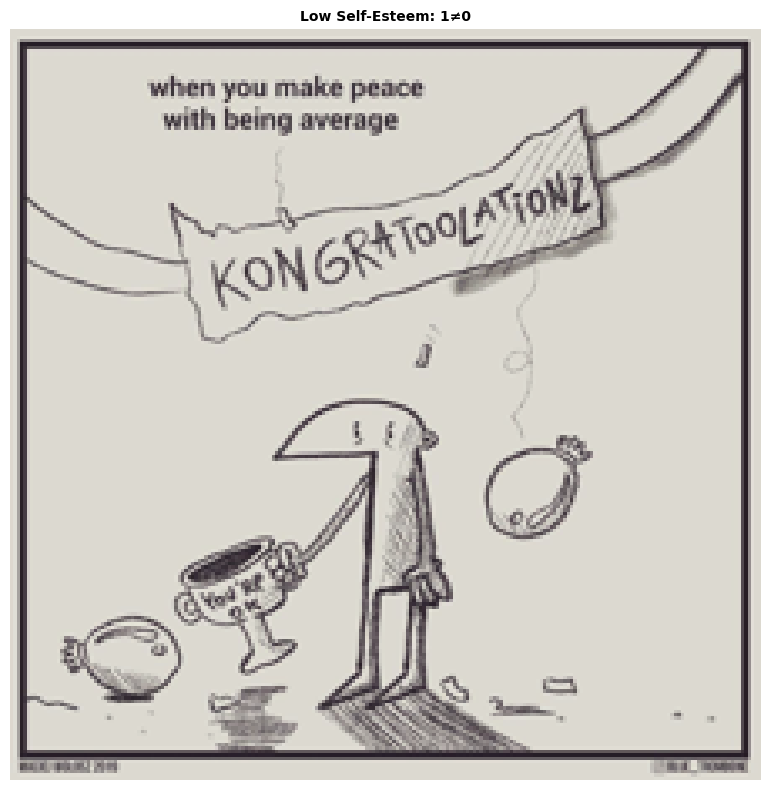


Example 2 (ID: TE-316):
  Class Low Self-Esteem: Predicted 1, Actual 0 (confidence: 0.9878)
  OCR Text: Feeling suicidal Might kill my self later tor No Hang in there budd Very poor choice of words
  Figurative Reasoning: 1. Cause-Effect: The meme shows a rope tied around a person's neck, suggesting that they might be feeling overwhelmed or stressed. The rope could symbolize the burden of life or the weight of responsibilities. 2. Figurative Understanding: The rope around the neck represents a metaphor for the feeling of being trapped or suffocated. It could also symbolize the idea of "hanging in there" or "hanging on for dear life." 3. Mental State: The person in the meme is likely experiencing a state of distress, anxiety, or even despair. The image might be a representation of the person's inner turmoil or a visualization of their emotional state.


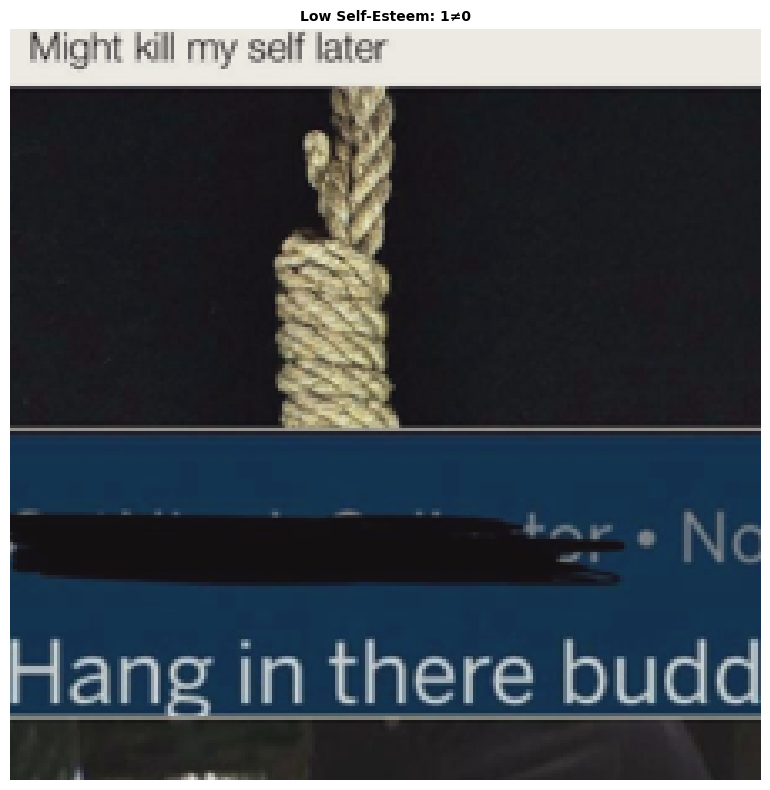


Example 3 (ID: TE-225):
  Class Low Self-Esteem: Predicted 1, Actual 0 (confidence: 0.9128)
  OCR Text: waiting for someone to apologize when they dont even know they hurt your feelings
  Figurative Reasoning: 1. Cause-Effect: The meme shows a person sitting in a chair with a book on their lap, which could be interpreted as a metaphor for someone who is too busy or overwhelmed to engage in leisurely activities. The cause of this situation could be a lack of time or prioritization of tasks, leading to a negative emotional state. 2. Figurative Understanding: The meme's underlying message could be interpreted as a commentary on the importance of taking breaks and finding balance in life. The person in the meme might symbolize someone who is constantly working or engaged in activities without taking time to relax and recharge. 3. Mental State: The person in the meme appears to be in a state of frustration or exhaustion, as they are described as "waiting for someone to apologize when they 

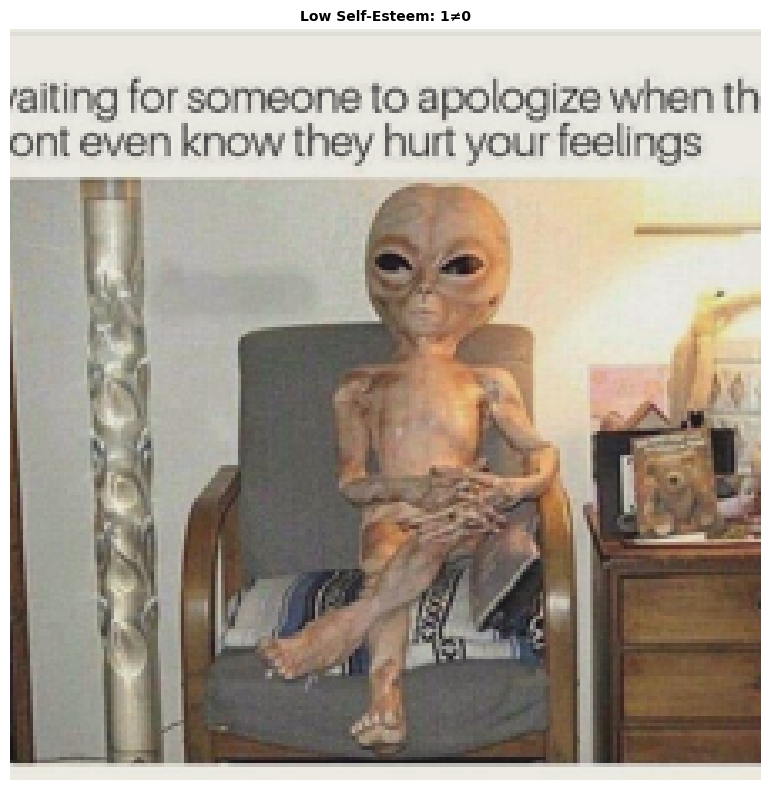


--- Misclassified examples for error pattern: Eating Disorder ---

Example 1 (ID: TE-35):
  Class Eating Disorder: Predicted 1, Actual 0 (confidence: 0.9970)
  OCR Text: 8 funnycutegifs.tumblr.com POINTLESS BUTTON Warning Pointless
  Figurative Reasoning: 1. Cause-Effect: The meme shows a person looking at a sign that says "Pointsless Button." This could be interpreted as a cause-effect relationship, where the person is frustrated or disappointed by the lack of a button or the lack of functionality of the button. 2. Figurative Understanding: The meme can be seen as a metaphor for the feeling of being stuck or trapped in a situation with no way out. The person's expression and the sign's message convey a sense of helplessness or frustration. 3. Mental State: The person in the meme appears to be in a state of frustration or disappointment, as they are looking at the sign with a frown on their face. This could be a representation of the feeling of being stuck or trapped in a situation wi

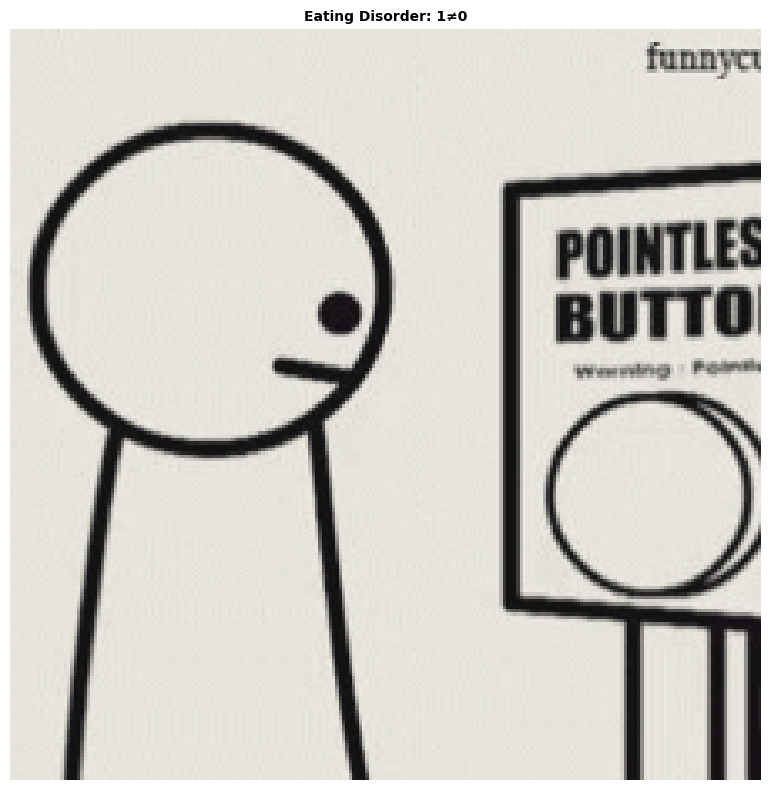


Example 2 (ID: TE-385):
  Class Eating Disorder: Predicted 1, Actual 0 (confidence: 0.9970)
  OCR Text: ELL Always Be Your Sug SUGAR 10 MEDAL Allowrie PRIME LARD CASH COWBURGERS APRIL 2.2012 THINK FAST FOOD IS CHEAP? THINK AGAIN. THE MEDICAL CARE COSTS OF OBESITY IN THE UNITED STATES ARE STAGGERING. IN 2008, THESE COSTS TOTALED ABOUT $147 BILLION. 02 RONALD 1 64 oz 500 A DINE IN 1 TRIPLE SIZE FAY 1 2 POUNDER BURGER * SUBTOTAL* $1.99 $2.25 $4.50 $8.74 OBESITY SURCHARGE $147,000,000,000.00 TOTAL $147,000,000,008.74 THANKS. COME AGAIN.
  Figurative Reasoning: 1. Cause-Effect: The meme shows a fast food meal, including a hamburger, fries, and a drink, with a price tag. The cause-effect relationship here is that consuming fast food regularly can lead to health issues, such as obesity, heart disease, and high blood pressure. 2. Figurative Understanding: The meme can be interpreted as a warning against the temptation of fast food, which is often associated with indulgence and lack of self-co

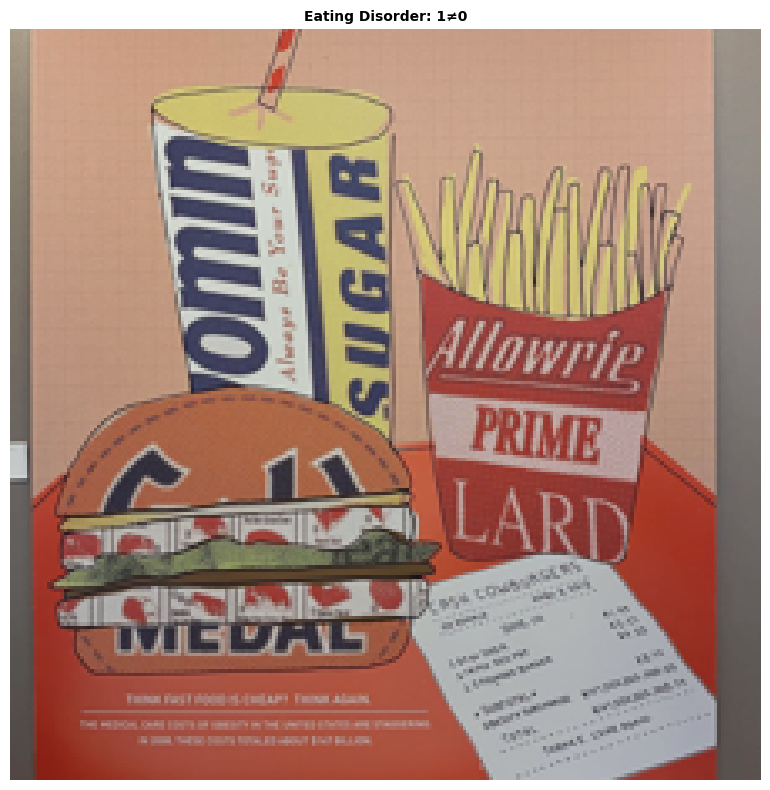


Example 3 (ID: TE-492):
  Class Eating Disorder: Predicted 0, Actual 1 (confidence: 0.2846)
  OCR Text: On Twitter Ber Sees Ed meme Bernie It's from r/ edanonymemes Berni It's my meme rnie OF OF
  Figurative Reasoning: 1. Cause-Effect: The meme is a comical representation of the consequences of excessive social media usage. It shows a man with a red face, suggesting that he is experiencing negative emotions or stress due to his online presence. 2. Figurative Understanding: The meme can be interpreted as a commentary on the impact of social media on people's lives. It highlights the potential for social media to cause stress, anxiety, and negative emotions, as well as the importance of maintaining a healthy balance between online and offline activities. 3. Mental State: The man in the meme appears to be experiencing frustration, stress, or anxiety, possibly due to the pressure of maintaining an online presence or the constant need to be connected to social media.


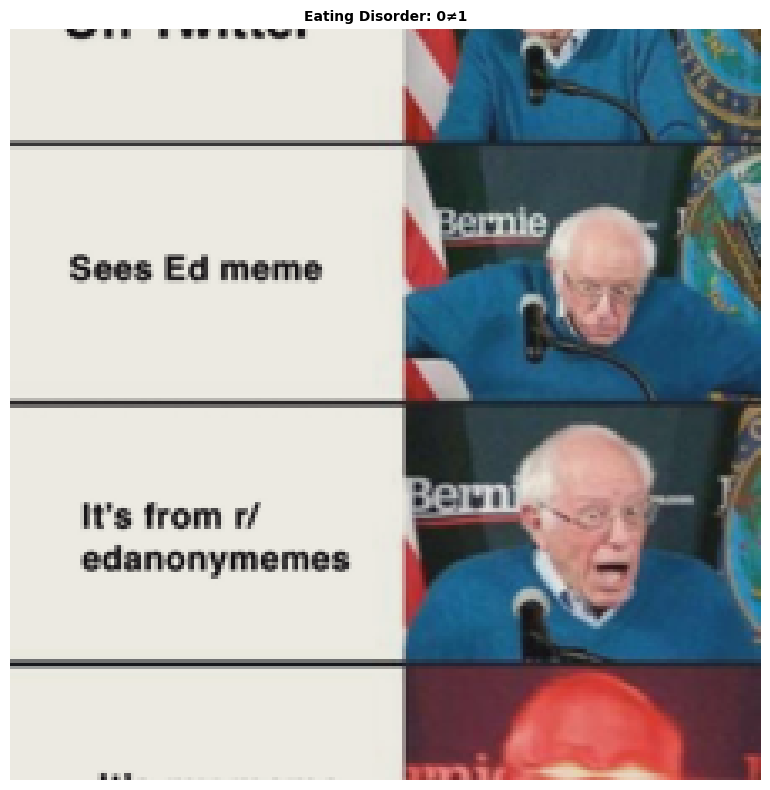


--- Misclassified examples for error pattern: Sleeping Disorder, Self-Harm ---

Example 1 (ID: TE-333):
  Class Sleeping Disorder: Predicted 1, Actual 0 (confidence: 0.9991)
  Class Self-Harm: Predicted 0, Actual 1 (confidence: 0.0055)
  OCR Text: JOIN THE 3 DAY CHALLENGE! NO CRACK ON FEBRUARY 29, 30 AND 31!
  Figurative Reasoning: 1. Cause-Effect: The meme is related to the "no crack on February 29, 30, and 31" message, which suggests that there is a specific time frame in which crack is not allowed. This rule is meant to prevent individuals from using crack during these specific dates. 2. Figurative Understanding: The phrase "no crack on February 29, 30, and 31" can be interpreted as a metaphor for life's unpredictability, as February 29, 30, and 31 only occur once every four years. It could also be a humorous reminder for people to avoid using crack on these rare dates. 3. Mental State: The image of a "no crack" sign suggests a state of caution or alertness, as the message is meant

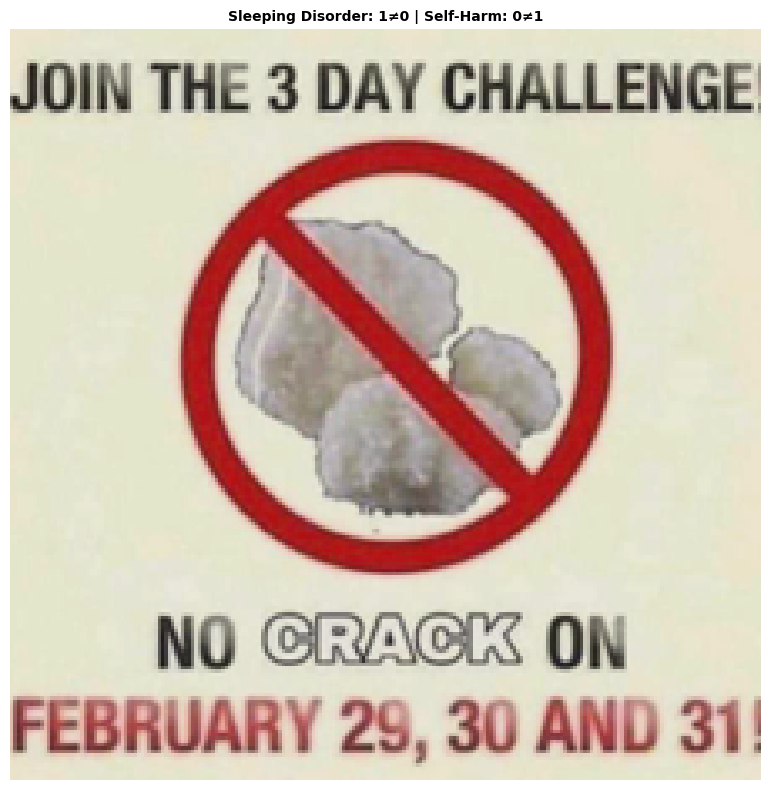


Example 2 (ID: TE-284):
  Class Sleeping Disorder: Predicted 0, Actual 1 (confidence: 0.0069)
  Class Self-Harm: Predicted 1, Actual 0 (confidence: 0.9941)
  OCR Text: nct nct127 LIVE 21.6K X nctkun Shes meditating guys nctten She's died
  Figurative Reasoning: 1. Cause-Effect: The meme shows a person sleeping in a coffin, which can be interpreted as a metaphor for depression or a lack of motivation. The cause of this situation could be a lack of purpose, unfulfilled goals, or personal struggles. 2. Figurative Understanding: The image of the person sleeping in a coffin represents a state of inactivity, apathy, or a lack of engagement in life. This can be interpreted as a symbolic representation of depression, where the person is "sleeping" or not actively participating in life. 3. Mental State: The meme depicts a person in a state of depression or apathy, as they are sleeping in a coffin, which is a metaphor for a lack of motivation or purpose. This could be a representation of feelin

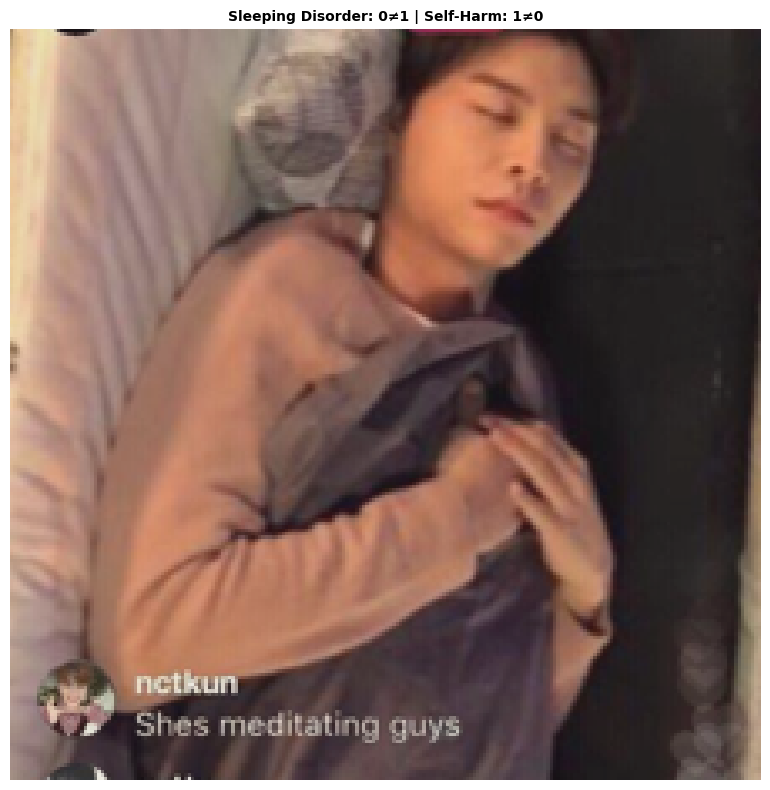


Example 3 (ID: TE-361):
  Class Sleeping Disorder: Predicted 1, Actual 0 (confidence: 0.8879)
  Class Self-Harm: Predicted 0, Actual 1 (confidence: 0.0002)
  OCR Text: AREA WOMAN CHARGED WITH INJECTING LETHAL COCKTAIL OF DRUGS. INTO, COCKROACH SHE CAPTURED AND KEPT UNDER A GLASS IN HER KITCHEN.
  Figurative Reasoning: 1. Cause-Effect: The meme shows a woman smiling and holding a glass, suggesting that she is enjoying a cocktail. The cause of her happiness could be the pleasant taste of the cocktail, the social aspect of sharing drinks with friends, or simply the relaxation and enjoyment that comes with consuming alcoholic beverages. 2. Figurative Understanding: The meme can be interpreted as a metaphor for overcoming life's challenges or finding happiness in simple pleasures. The woman's smile and the glass of cocktail represent the idea that sometimes, it's the small things in life that bring joy and satisfaction. 3. Mental State: The woman in the meme appears to be in a happy and co

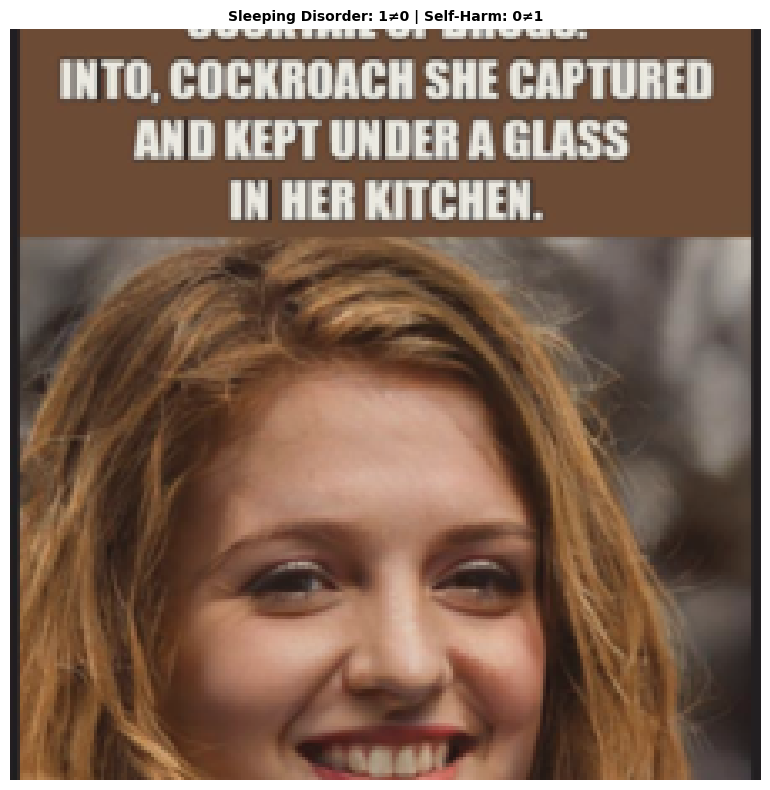


--- Misclassified examples for error pattern: Low Self-Esteem, Self-Harm ---

Example 1 (ID: TE-305):
  Class Low Self-Esteem: Predicted 0, Actual 1 (confidence: 0.4625)
  Class Self-Harm: Predicted 1, Actual 0 (confidence: 0.7296)
  OCR Text: "When you hit rock bottom, the only way is up!" Me: DT-0123 TWO 261
  Figurative Reasoning: 1. Cause-Effect: The meme shows a construction site with multiple yellow construction vehicles, including bulldozers and excavators, working on a hill. The cause of this scene is likely the need for infrastructure development or maintenance, such as road construction, landscaping, or excavation for utilities. The effect of this activity is the creation of a new landscape or the improvement of existing infrastructure. 2. Figurative Understanding: The meme can be interpreted as a metaphor for overcoming challenges or achieving goals. The construction vehicles represent the determination and effort required to overcome obstacles or achieve desired outcomes. 

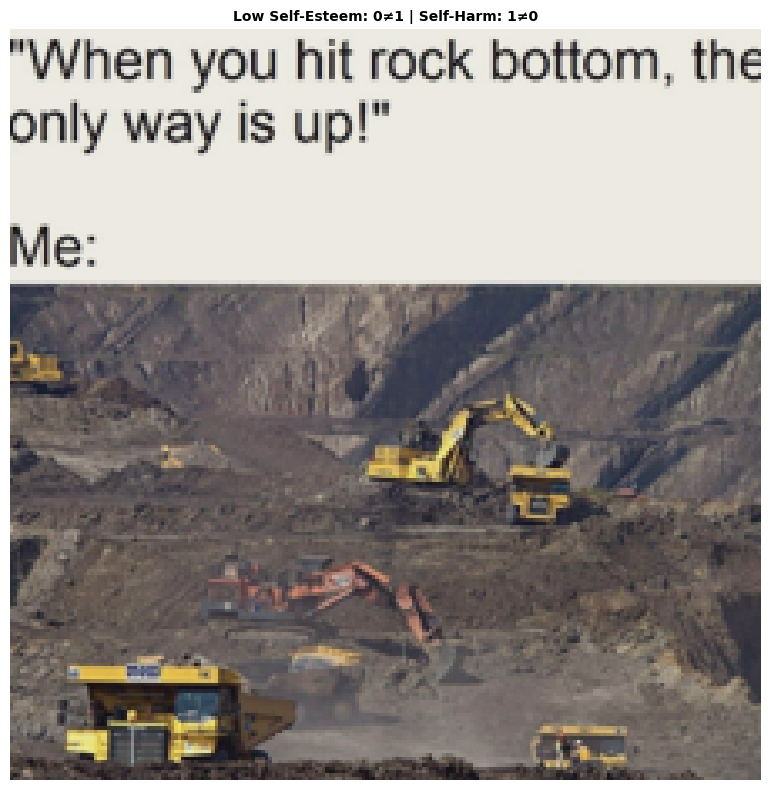


Example 2 (ID: TE-236):
  Class Low Self-Esteem: Predicted 0, Actual 1 (confidence: 0.1586)
  Class Self-Harm: Predicted 1, Actual 0 (confidence: 0.9968)
  OCR Text: POLLEN DEATH STAR ANY QUESTIONS? Like Comment Share 003 How come nobody loves me? Like Reply 4 hrs
  Figurative Reasoning: 1. Cause-Effect: The meme is a play on words, using the phrase "How come nobody loves me?" to create a humorous and relatable situation. The image shows a Death Star and a pollen ball, which are unrelated to the question. The meme's purpose is to evoke a sense of humor and self-deprecating humor in the viewer. 2. Figurative Understanding: The meme uses a combination of a Death Star and pollen ball to create a visual pun. The Death Star is a symbol of destruction and power, while pollen is a small, insignificant particle. The meme's underlying message is that even though the Death Star is a powerful and destructive force, it is still made up of small, insignificant particles. This can be interpreted as

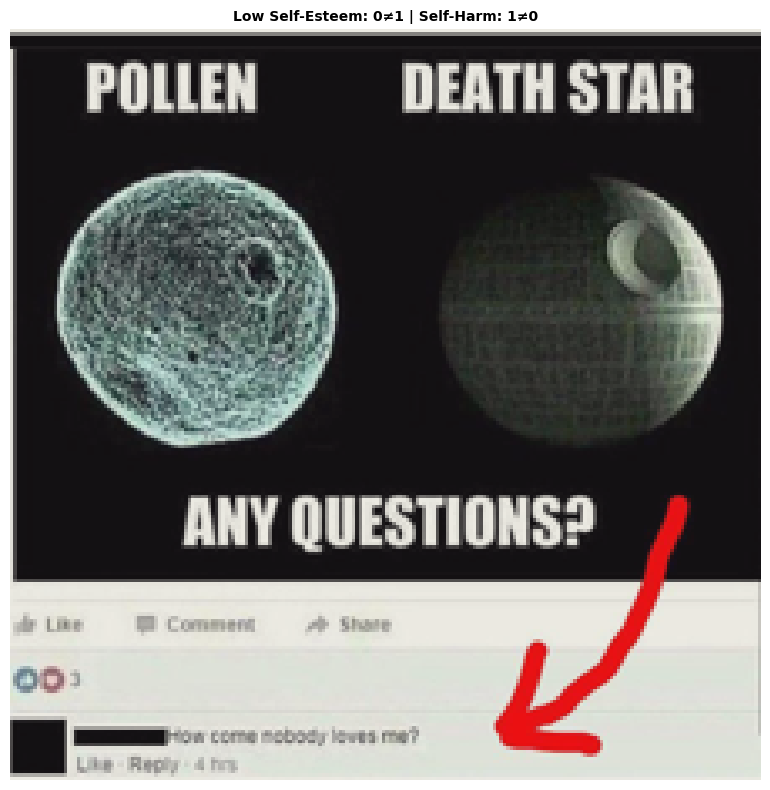


Example 3 (ID: TE-285):
  Class Low Self-Esteem: Predicted 1, Actual 0 (confidence: 0.9979)
  Class Self-Harm: Predicted 0, Actual 1 (confidence: 0.0026)
  OCR Text: YOUNG OLD Depression No treatment Faceapp Treat depression early;prevent suicide Dr.Pavan Sonar
  Figurative Reasoning: 1. Cause-Effect: The meme shows a sad face with the words "Young" and "Old" above it. The cause of the sadness could be related to the age of the person, as they might be experiencing feelings of nostalgia, loneliness, or a sense of loss. The effect of this sadness could be a decrease in their overall well-being and happiness. 2. Figurative Understanding: The meme uses a sad face to represent the concept of depression. The sad face symbolizes the emotional state of someone experiencing depression, while the words "Young" and "Old" suggest that depression can affect people of all ages. The meme also implies that depression is a universal experience, transcending age and generational differences. 3. Mental

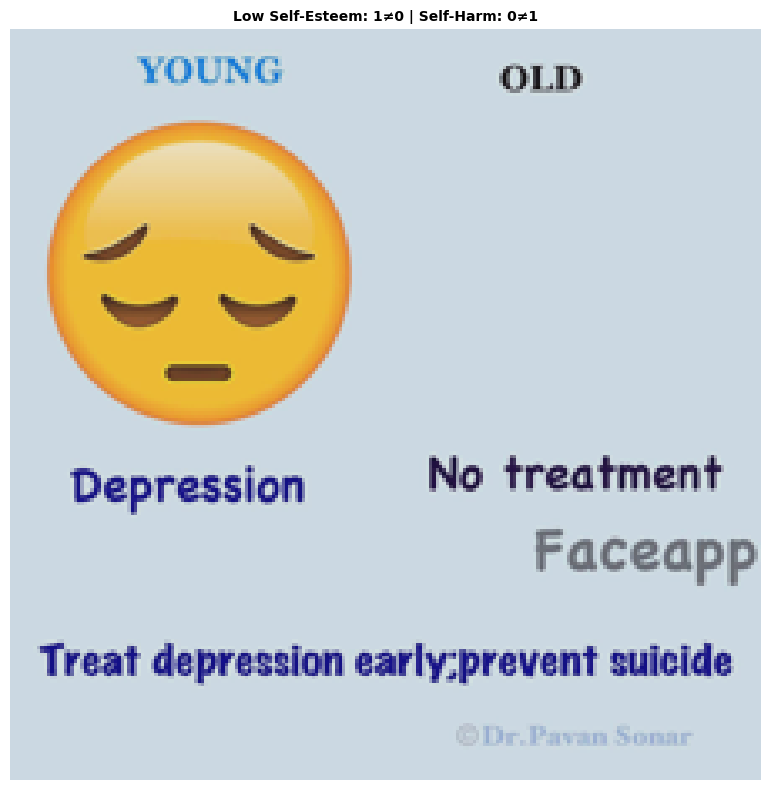


--- Misclassified examples for error pattern: Eating Disorder, Low Self-Esteem ---

Example 1 (ID: TE-185):
  Class Eating Disorder: Predicted 1, Actual 0 (confidence: 0.9951)
  Class Low Self-Esteem: Predicted 0, Actual 1 (confidence: 0.0041)
  OCR Text: me: *looks in mirror* my body dysmorphia: You're ugly, you're disgusting, I'm gonna kill you, give me $200
  Figurative Reasoning: 1. Cause-Effect: The meme is a humorous take on the concept of body dysmorphia, which is a mental disorder characterized by an excessive preoccupation with one's appearance. The meme shows a man in a suit with a caption that reads, "You look in the mirror... Body Dysmorphia." This is a light-hearted way of highlighting the negative impact of body dysmorphia on a person's self-esteem and mental well-being. 2. Figurative Understanding: The meme uses a visual pun by placing the word "mirror" in the caption, which is a play on the word "mirror" as both a noun and a verb. The meme's humor is derived from the w

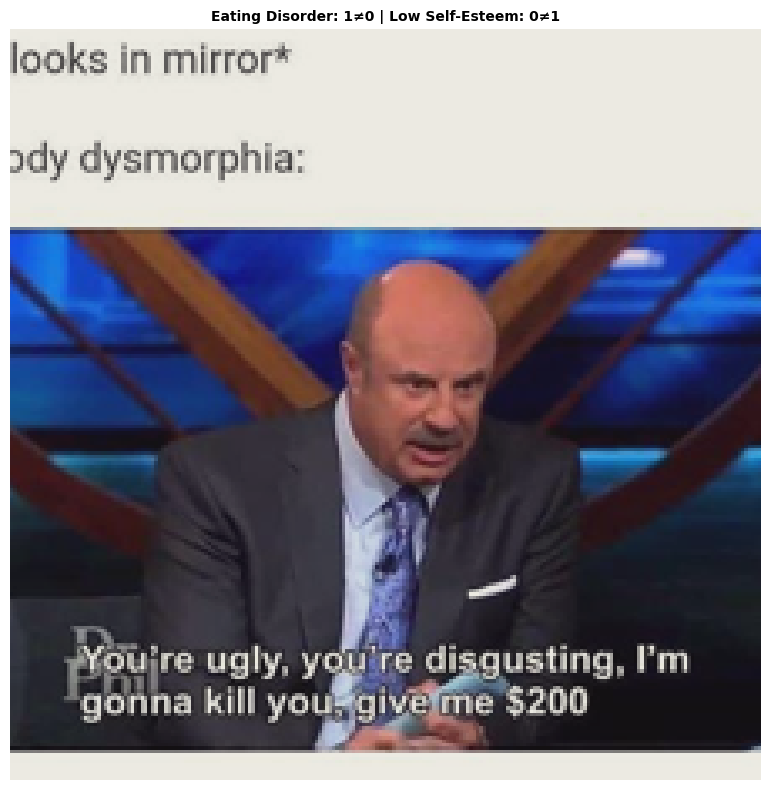


Example 2 (ID: TE-286):
  Class Eating Disorder: Predicted 1, Actual 0 (confidence: 0.9933)
  Class Low Self-Esteem: Predicted 0, Actual 1 (confidence: 0.0001)
  OCR Text: "Whenever I try to recover things just end up getting worse."
  Figurative Reasoning: 1. Cause-Effect: The meme shows a woman lying in bed, possibly depressed or feeling unwell. The cause of her situation could be related to her mental state, personal relationships, or external factors. 2. Figurative Understanding: The meme might be using the phrase "Whenever I try to recover things, just end up getting worse" as a metaphor for the challenges faced in overcoming depression or other mental health issues. It could also be a humorous way of expressing the frustration that comes with trying to improve one's situation but facing setbacks. 3. Mental State: The woman in the meme appears to be in a state of sadness, depression, or exhaustion. She might be struggling with her mental health, feeling overwhelmed, or experienci

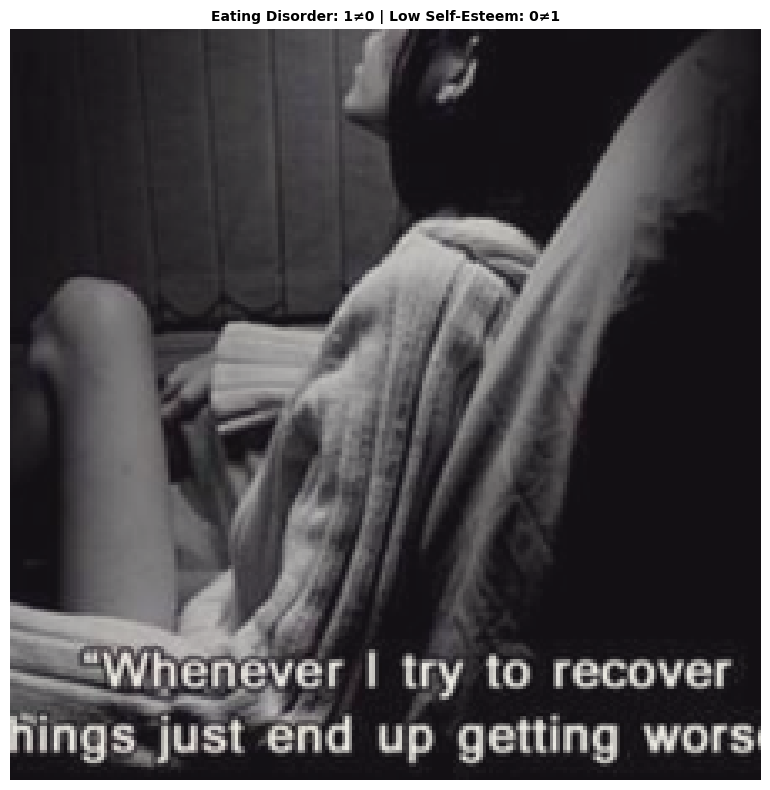


Example 3 (ID: TE-188):
  Class Eating Disorder: Predicted 1, Actual 0 (confidence: 0.9923)
  Class Low Self-Esteem: Predicted 0, Actual 1 (confidence: 0.0003)
  OCR Text: Me: "God I am so FAT" Any friend, loved one, casual acquaintance: "you're not fucking fat" Me: HORTON HEARS @daddy_issues_and_memes A BITCH ASS LIAR
  Figurative Reasoning: 1. Cause-Effect: The meme is a play on words, using the phrase "Horton hears a bitch" to create a humorous and ironic twist on the original phrase "Horton hears a whale." The meme likely aims to evoke amusement and surprise in the viewer. 2. Figurative Understanding: The meme uses a metaphorical comparison between a person and a whale, with the phrase "you're not a whale" implying that the person is not as significant or important as they might think. The meme's underlying message is that people should not overestimate their importance or perceived influence. 3. Mental State: The meme is likely intended to evoke a lighthearted and humorous respon

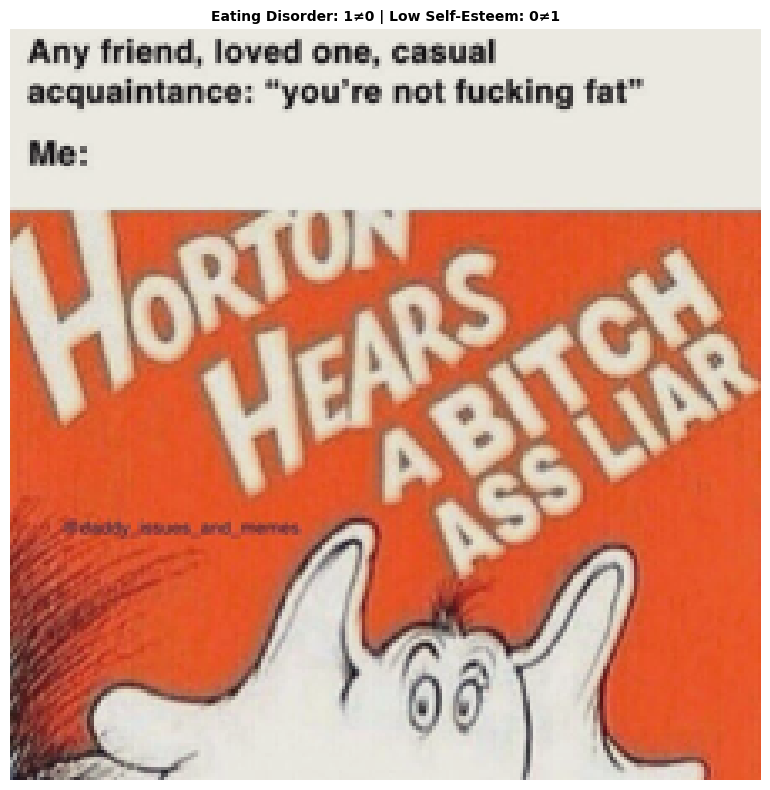


--- Misclassified examples for error pattern: Self-Harm ---

Example 1 (ID: TE-256):
  Class Self-Harm: Predicted 1, Actual 0 (confidence: 0.9935)
  OCR Text: Men remember what you fight for DEUS VULT!
  Figurative Reasoning: 1. Cause-Effect: In this image, there is a meme about depression, featuring a horse with a rider on its back. The rider is described as being depressed, and the horse is depicted as being sad. The cause of the depression is often linked to modern life, which can be overwhelming, fast-paced, and stressful. The effect of this depression is a negative impact on the individual's mental and emotional well-being, as well as their overall quality of life. 2. Figurative Understanding: The horse in the image is a metaphor for the individual experiencing depression. The rider represents the burdens and stresses of modern life, and the horse is a symbol of the individual's emotional state. The rider's sadness is a reflection of the depressed individual's feelings, and the h

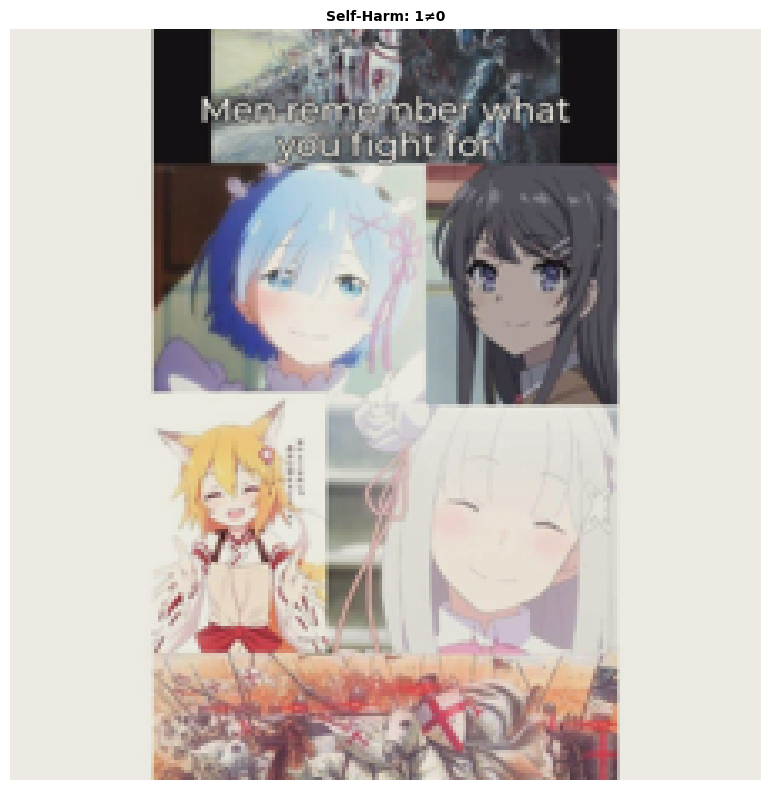


Example 2 (ID: TE-139):
  Class Self-Harm: Predicted 1, Actual 0 (confidence: 0.8130)
  OCR Text: The big sad Me
  Figurative Reasoning: 1. Cause-Effect: The meme shows a character flying through the air with the words "The Big Sad" written below. The cause of this sadness could be related to the character's emotional state or the events happening in the scene. 2. Figurative Understanding: The phrase "The Big Sad" is a metaphorical representation of the character's emotional state. It could be interpreted as a symbol of vulnerability, loneliness, or even a representation of the character's inner turmoil. 3. Mental State: The character in the meme is experiencing a state of sadness or distress. This emotional state could be a result of various factors, such as personal relationships, life events, or even the character's personality traits.


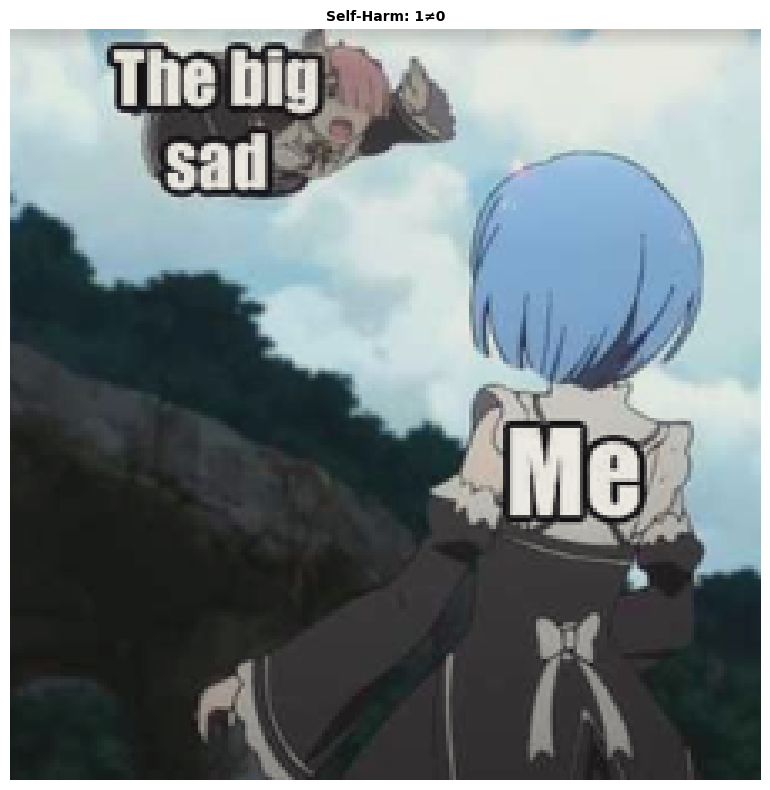


Example 3 (ID: TE-301):
  Class Self-Harm: Predicted 0, Actual 1 (confidence: 0.2945)
  OCR Text: this will never look like this again
  Figurative Reasoning: 1. Cause-Effect: The meme shows a person with a scarred arm and a caption that says "This will never heal." The cause of the scarred arm could be an accident, a medical condition, or a self-inflicted injury. The effect is the person's emotional state, which might include pain, sadness, or frustration. 2. Figurative Understanding: The meme can be interpreted as a metaphor for emotional or psychological scars that people carry with them throughout their lives. The scarred arm symbolizes the physical remnants of a traumatic event, while the caption emphasizes the idea that emotional pain can be just as enduring and difficult to overcome. 3. Mental State: The person in the meme is likely experiencing feelings of sadness, loss, or despair due to the emotional pain associated with the scarred arm. The image may also evoke feelings of 

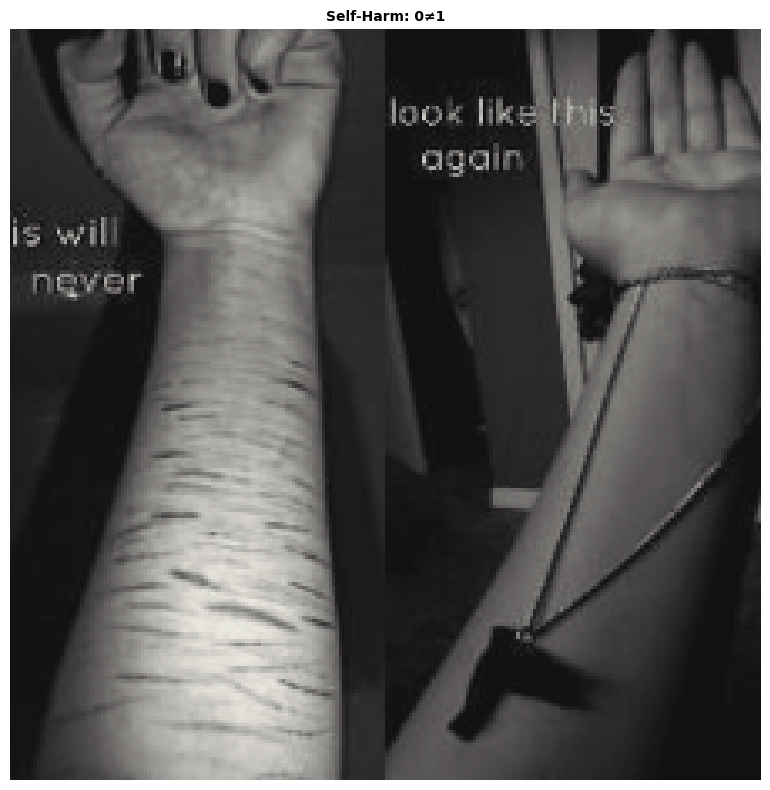


--- Misclassified examples for error pattern: Lack of Interest, Feeling Down, Low Self-Esteem, Self-Harm ---

Example 1 (ID: TE-605):
  Class Lack of Interest: Predicted 0, Actual 1 (confidence: 0.0001)
  Class Feeling Down: Predicted 0, Actual 1 (confidence: 0.0564)
  Class Low Self-Esteem: Predicted 1, Actual 0 (confidence: 0.9849)
  Class Self-Harm: Predicted 1, Actual 0 (confidence: 0.6518)
  OCR Text: My will to achieve something depression
  Figurative Reasoning: 1. Cause-Effect: The meme shows a train crashing into another train, which could be interpreted as a metaphor for the consequences of depression. The image suggests that depression can lead to negative outcomes, such as accidents or failures in life. 2. Figurative Understanding: The meme uses the image of a train crash to represent the impact of depression on a person's life. The trains symbolize the pressures and challenges that a person with depression may face, and the crash represents the potential for a person to l

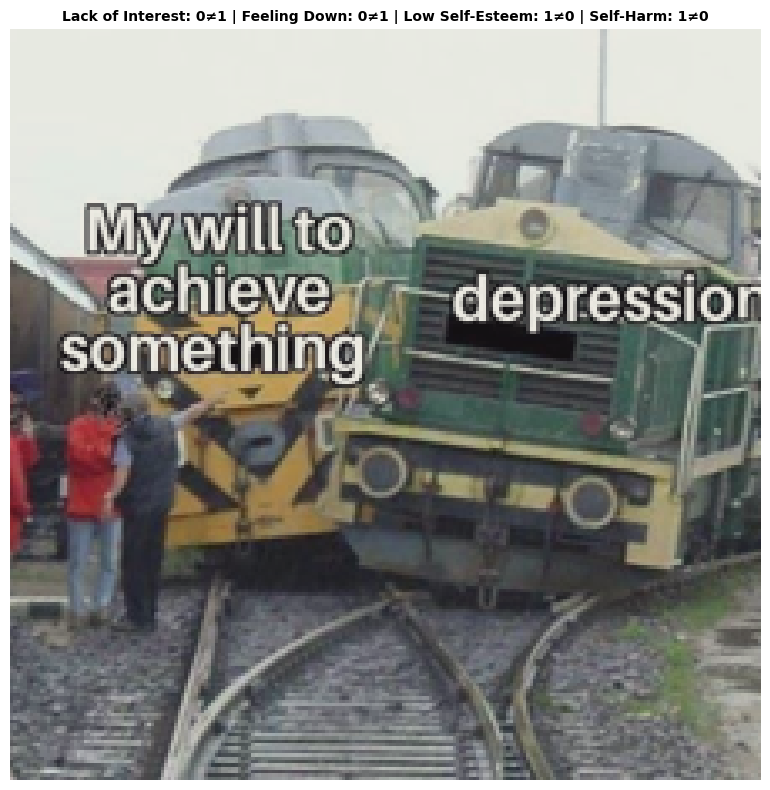


--- Misclassified examples for error pattern: Feeling Down ---

Example 1 (ID: TE-351):
  Class Feeling Down: Predicted 1, Actual 0 (confidence: 0.9964)
  OCR Text: voices in my head say "you need to be dead"
  Figurative Reasoning: 1. Cause-Effect: The meme is a visual representation of the negative emotions and thoughts that can lead to depression. The image shows a person with a sad face, surrounded by a forest, and a sign that says "voices in my head say 'you need to be dead'." This suggests that the person is experiencing negative thoughts and emotions, which can contribute to feelings of depression. 2. Figurative Understanding: The meme uses a metaphorical representation of the person's inner thoughts and emotions. The "voices in my head" symbolize the person's negative self-talk and the "you need to be dead" phrase represents the overwhelming and hopeless feelings associated with depression. 3. Mental State: The meme portrays a person experiencing feelings of sadness, hopelessn

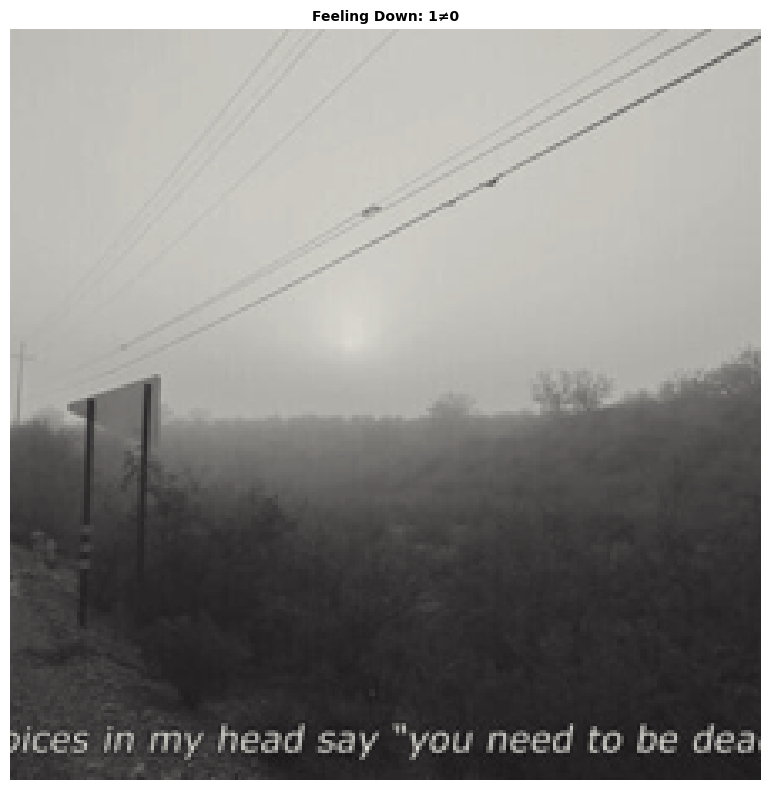


Example 2 (ID: TE-198):
  Class Feeling Down: Predicted 1, Actual 0 (confidence: 0.9953)
  OCR Text: I think about dying all the time. SEMPETERNAL
  Figurative Reasoning: 1. Cause-Effect: The man in the image is contemplating the act of dying, which can be attributed to various factors such as depression, loneliness, or a general sense of hopelessness. 2. Figurative Understanding: The man's contemplation of death can be seen as a metaphor for overcoming challenges or facing one's fears. It can also be interpreted as a symbol of the fleeting nature of life and the importance of making the most of the time we have. 3. Mental State: The man appears to be in a state of deep thought or introspection, possibly struggling with his emotions or grappling with difficult life decisions.


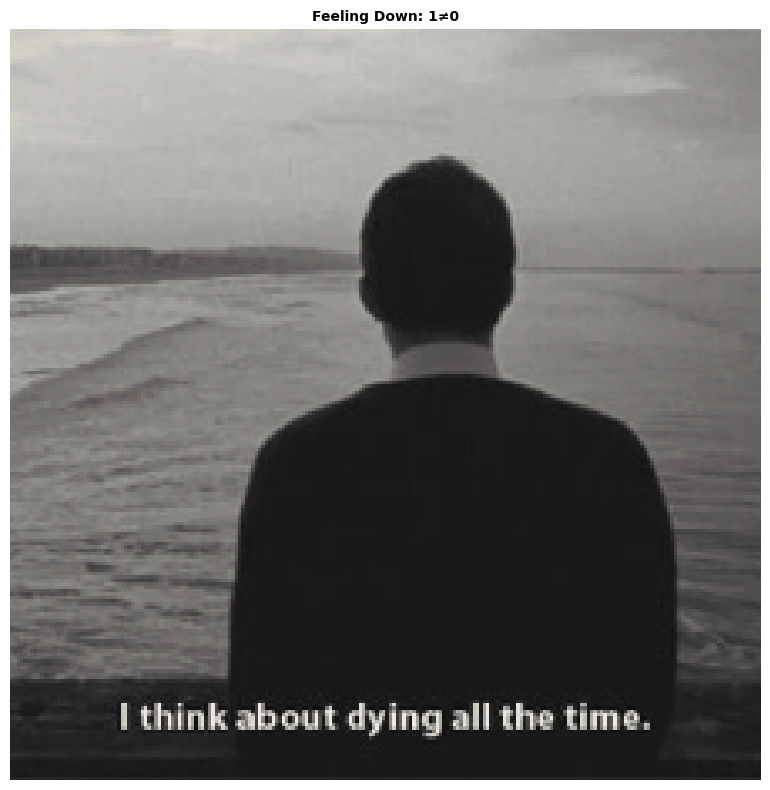


Example 3 (ID: TE-33):
  Class Feeling Down: Predicted 1, Actual 0 (confidence: 0.9887)
  OCR Text: GRANDPA WHAT DID YOU DO DURING THE GREAT CORONAVIRUS PANIC OF 2020? Charmik Char TRvd Sropy Basic Charmin Charmin Charmin WUFMAN 20 WELL SON, I HAD A VERY DANGEROUS JOB. I WAS A TAILGUNNER ON A CHARMIN DELIVERY TRUCK
  Figurative Reasoning: 1. Cause-Effect: The meme shows an old man driving a truck with a large advertisement for Charmin toilet paper. The cause of this situation is the old man's decision to drive the truck, and the effect is the advertisement being displayed on the truck. 2. Figurative Understanding: The meme can be interpreted as a metaphor for the old man's age and the need for him to be cautious while driving. The truck's large advertisement for Charmin toilet paper can symbolize the importance of maintaining cleanliness and hygiene, especially for older individuals. 3. Mental State: The meme depicts the old man as being in a dangerous situation, as he is driving a la

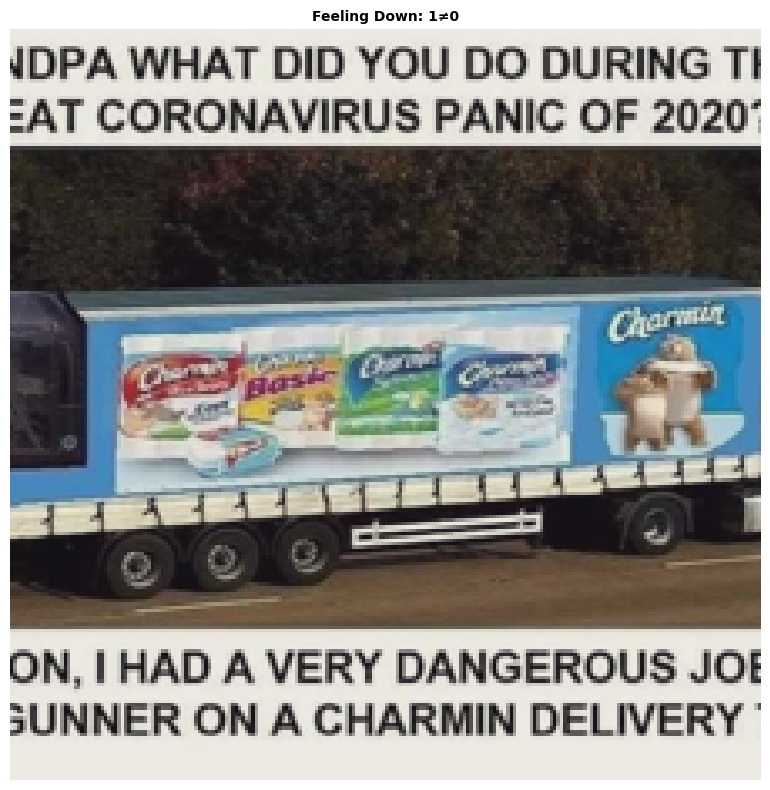


--- Misclassified examples for error pattern: Sleeping Disorder, Low Self-Esteem ---

Example 1 (ID: TE-427):
  Class Sleeping Disorder: Predicted 0, Actual 1 (confidence: 0.2465)
  Class Low Self-Esteem: Predicted 1, Actual 0 (confidence: 0.7242)
  OCR Text: MEMORIES OF A PERSON WHO DOESN'T CARE ABOUT ME, BUT I STILL CARE FOR DEEPLY ME AT 3AM
  Figurative Reasoning: 1. Cause-Effect: The meme is about a person who is lying in bed, possibly feeling depressed or sad. The cause of this situation could be a lack of care or concern for oneself, as indicated by the phrase "but i still don't care for deeply." 2. Figurative Understanding: The meme's underlying message is about self-care and the importance of taking care of oneself. The person in the meme is shown not caring about themselves, which can be interpreted as a metaphor for neglecting one's emotional and mental well-being. 3. Mental State: The person in the meme is depicted as feeling sad, depressed, or uncaring. This emotional stat

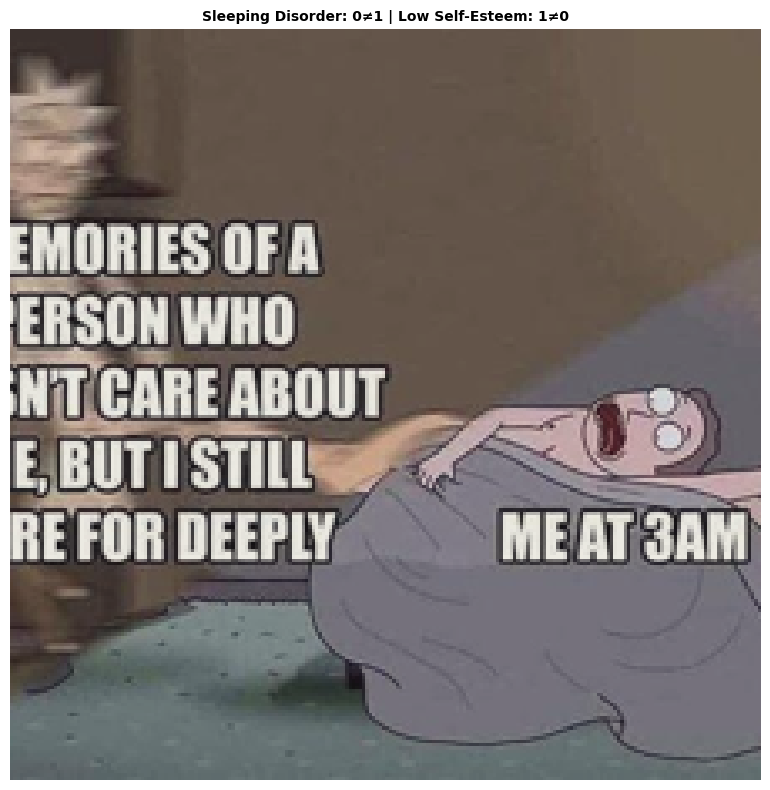


Example 2 (ID: TE-524):
  Class Sleeping Disorder: Predicted 0, Actual 1 (confidence: 0.0362)
  Class Low Self-Esteem: Predicted 1, Actual 0 (confidence: 0.8826)
  OCR Text: my mother introducing me to people : @infj_jokes_memes This animal sleeps its whole life away.
  Figurative Reasoning: 1. Cause-Effect: The mother is introducing herself to people, which could be a cause for the baby animal to sleep whole life away. 2. Figurative Understanding: The mother is introducing herself to people, which can be seen as a metaphor for the baby animal's innocence and vulnerability. 3. Mental State: The baby animal is in a state of sleep, which could indicate a sense of security and comfort in its surroundings.


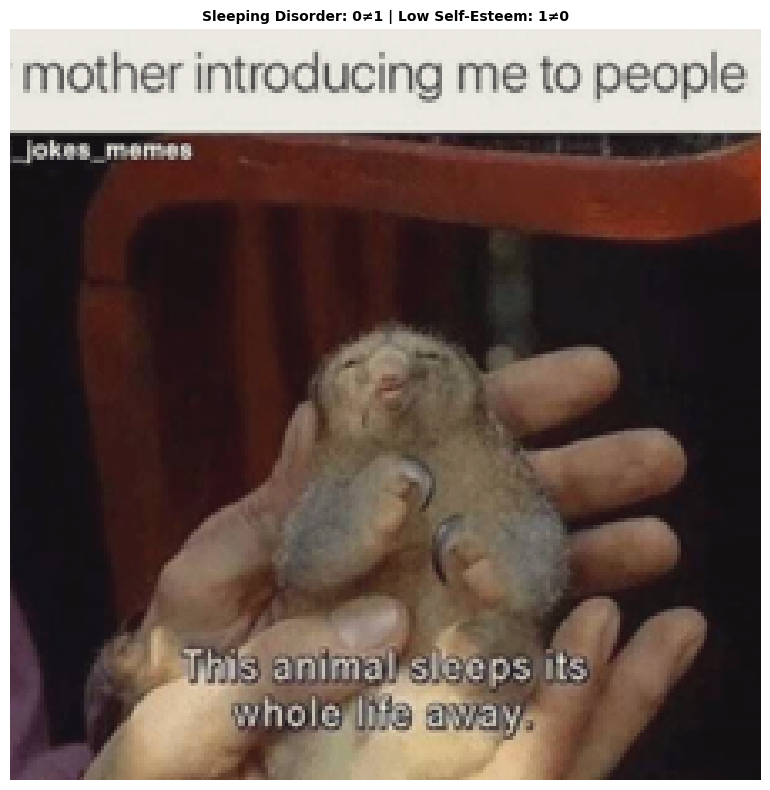


Example 3 (ID: TE-295):
  Class Sleeping Disorder: Predicted 0, Actual 1 (confidence: 0.0002)
  Class Low Self-Esteem: Predicted 0, Actual 1 (confidence: 0.0453)
  OCR Text: ARE YA WINNING, SON? No dad, I'm not winning, I don't even play games anymore they're not fun. I just sit and scroll Reddit mindlessly for hours. It's the same everynight. i'm tired dad
  Figurative Reasoning: 1. Cause-Effect: The meme shows a man sitting in front of a computer, with a caption stating that he is tired. This could be a result of spending long hours working or playing games on the computer. 2. Figurative Understanding: The meme can be interpreted as a representation of the modern-day sedentary lifestyle, where people spend a significant amount of time sitting in front of screens. This can lead to physical and mental health issues, such as obesity, poor posture, and reduced productivity. 3. Mental State: The man in the meme appears to be tired and possibly overwhelmed by his work or gaming habits. Th

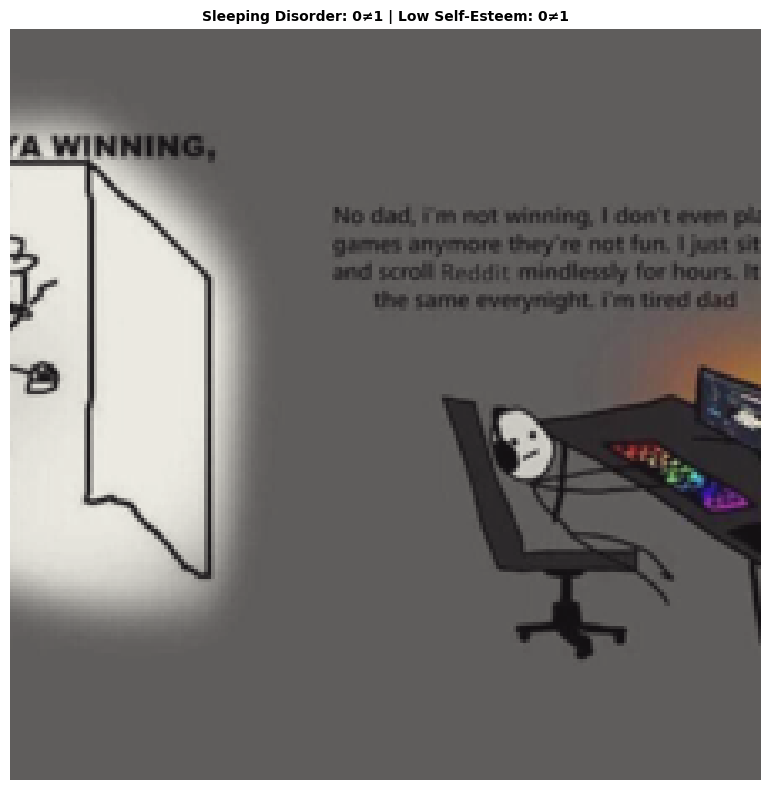


--- Misclassified examples for error pattern: Eating Disorder, Self-Harm ---

Example 1 (ID: TE-341):
  Class Eating Disorder: Predicted 1, Actual 0 (confidence: 0.9997)
  Class Self-Harm: Predicted 0, Actual 1 (confidence: 0.0005)
  OCR Text: It's an addiction now I don't even need a reason
  Figurative Reasoning: 1. Cause-Effect: The meme shows a person with scars on their legs, which could be a result of self-harm or an eating disorder. The scars indicate a negative outcome of the person's actions, which may have been driven by emotional distress or mental health issues. 2. Figurative Understanding: The meme can be interpreted as a metaphor for the consequences of addiction, specifically to drugs or alcohol. The scars on the person's legs symbolize the physical and emotional damage that can result from substance abuse. 3. Mental State: The person in the meme appears to be in a state of distress or despair, as evidenced by the scars on their legs. This could be a result of their add

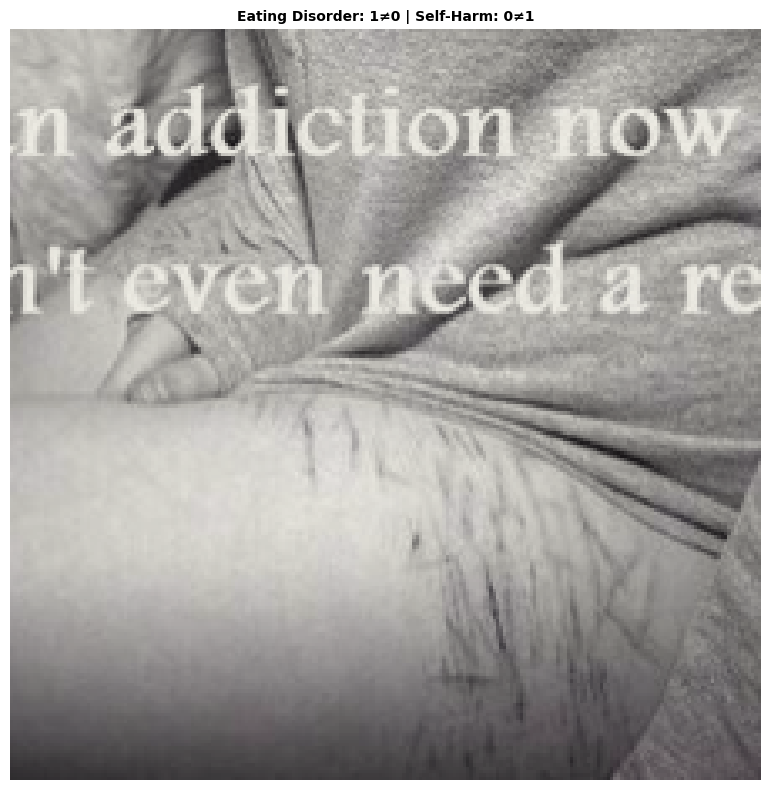


Example 2 (ID: TE-401):
  Class Eating Disorder: Predicted 1, Actual 0 (confidence: 0.9996)
  Class Self-Harm: Predicted 0, Actual 1 (confidence: 0.0003)
  OCR Text: You can choke.
  Figurative Reasoning: 1. Cause-Effect: The cause of her upset could be related to something that happened during the gathering or party, such as a disagreement, an argument, or disappointment in an event or situation. 2. Figurative Understanding: The phrase "You Can Choke" might be interpreted figuratively, suggesting that the woman is feeling overwhelmed, stressed, or frustrated, possibly due to the pressure of the gathering or the expectations of the event. 3. Mental State: The woman is experiencing a negative emotional state, possibly feeling angry, disappointed, or upset.


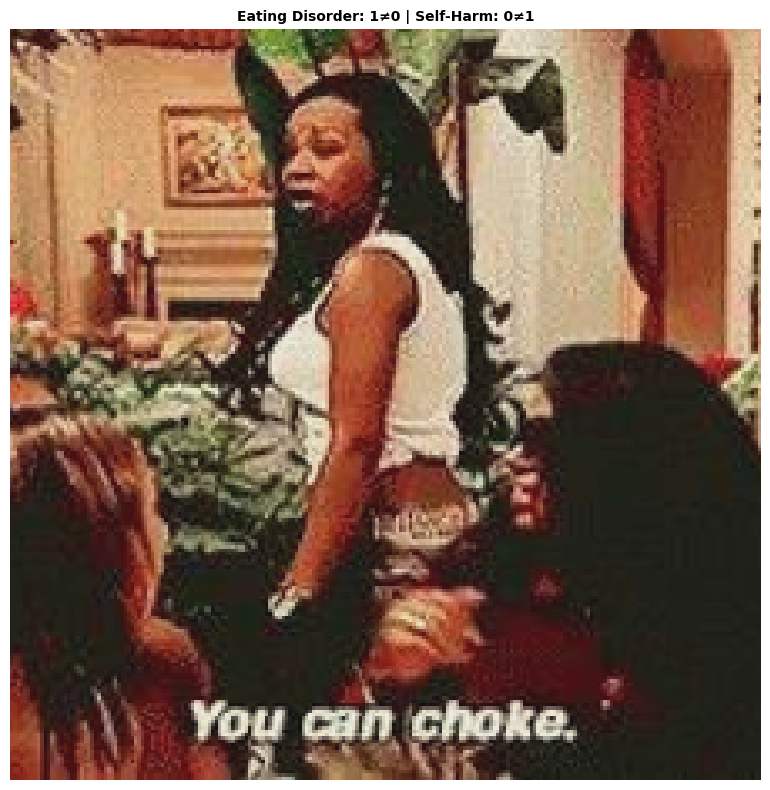


Example 3 (ID: TE-67):
  Class Eating Disorder: Predicted 1, Actual 0 (confidence: 0.9877)
  Class Self-Harm: Predicted 0, Actual 1 (confidence: 0.0035)
  OCR Text: It's hard to keep a secret when it's written all over your body.
  Figurative Reasoning: 1. Cause-Effect: The meme shows a person with a scarred arm, which could be a result of self-harm or an accident. The cause of the scarred arm could be a lack of support or understanding from others, leading to the person resorting to self-harm as a coping mechanism. 2. Figurative Understanding: The meme's underlying message is about the importance of seeking help and support when dealing with difficult situations. The scarred arm symbolizes the consequences of not reaching out for help, while the words "It's hard to keep a secret when it's written all over you" highlight the idea that people can't hide their emotions or struggles, even if they try to keep them hidden. 3. Mental State: The meme depicts a person in a state of distress o

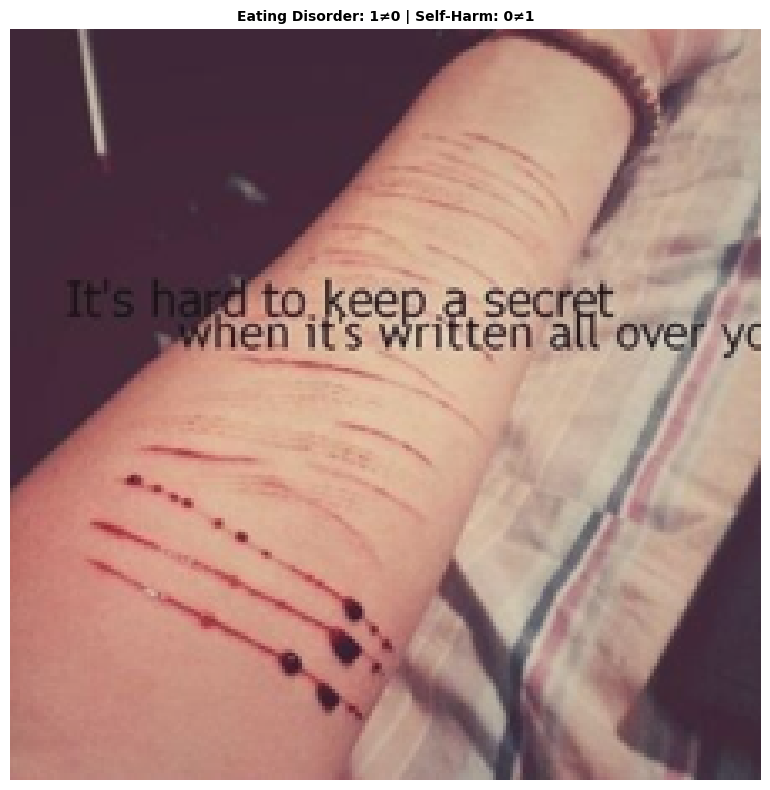


--- Misclassified examples for error pattern: Lack of Interest, Eating Disorder, Concentration Problem ---

Example 1 (ID: TE-441):
  Class Lack of Interest: Predicted 0, Actual 1 (confidence: 0.0002)
  Class Eating Disorder: Predicted 1, Actual 0 (confidence: 0.7895)
  Class Concentration Problem: Predicted 0, Actual 1 (confidence: 0.0001)
  OCR Text: My Anxiety My AD/HD My Depression My not having any motivation to do anything all day while simultaneously staying up for 30+ hours
  Figurative Reasoning: 1. Cause-Effect: The meme shows three Spider-Men pointing at each other, suggesting that they are pointing out their anxiety, depression, and the need for motivation. This could be interpreted as a call for support or encouragement from others to help combat these negative emotions. 2. Figurative Understanding: The image of three Spider-Men pointing at each other can be seen as a metaphor for the idea of collective responsibility or support. It highlights the importance of people com

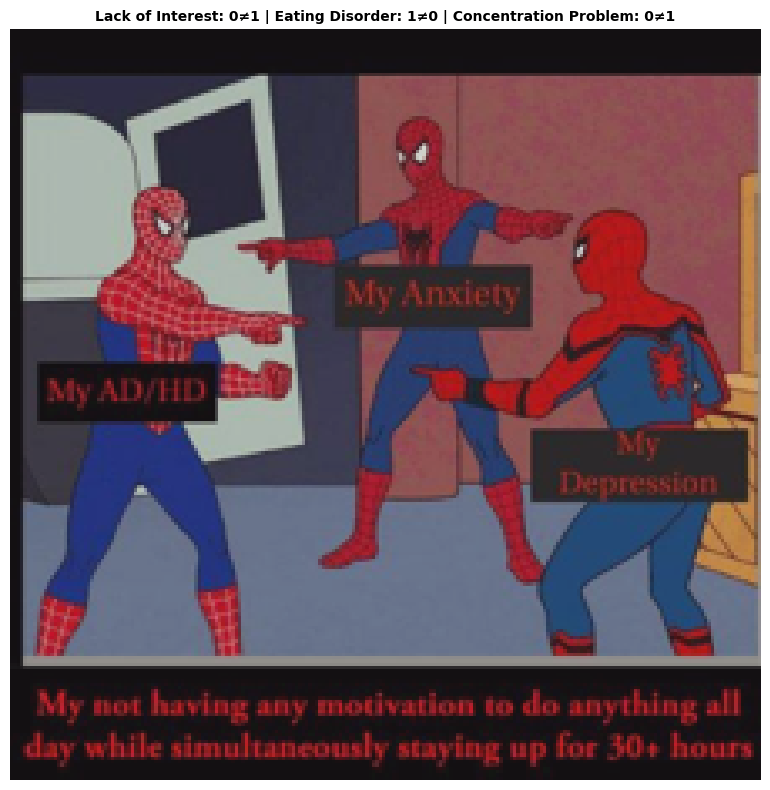


--- Misclassified examples for error pattern: Feeling Down, Self-Harm ---

Example 1 (ID: TE-237):
  Class Feeling Down: Predicted 1, Actual 0 (confidence: 0.9882)
  Class Self-Harm: Predicted 1, Actual 0 (confidence: 0.5163)
  OCR Text: me, enjoying my life being a dumb bitch
  Figurative Reasoning: 1. Cause-Effect: The meme is a play on words, suggesting that enjoying one's life can lead to being a "dumb" or "stupid" person. The cause is the enjoyment of life, and the effect is being perceived as dumb or stupid. 2. Figurative Understanding: The meme uses a humorous and ironic tone to convey the idea that enjoying life can make a person appear "dumb" or "stupid." It is a metaphorical representation of how focusing on the present and enjoying life can sometimes lead to being perceived as less intelligent or less serious. 3. Mental State: The meme portrays a lighthearted and humorous mental state, as it is meant to be entertaining and amusing rather than serious or thought-provoking.


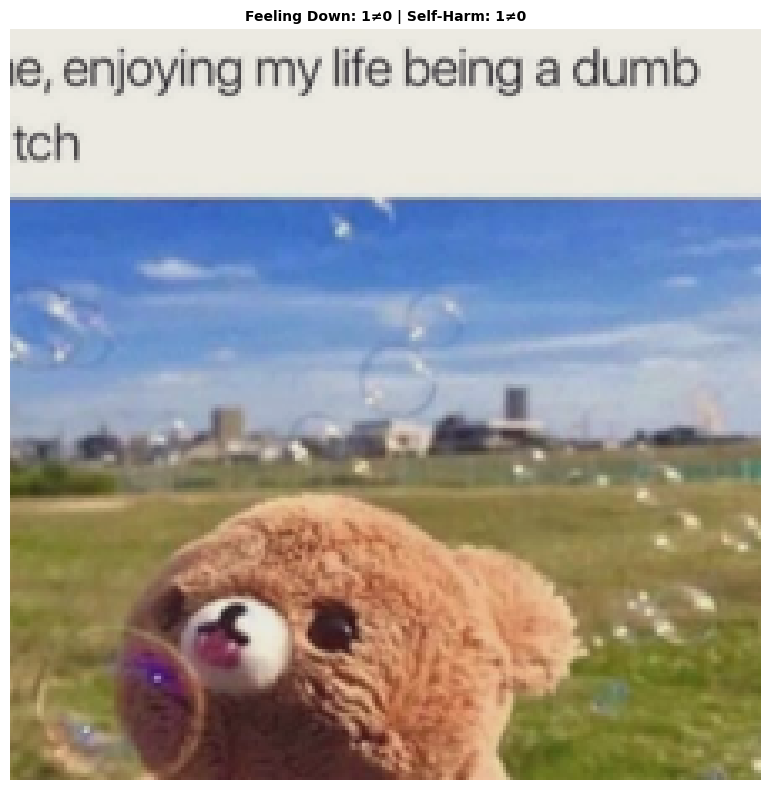


Example 2 (ID: TE-118):
  Class Feeling Down: Predicted 0, Actual 1 (confidence: 0.0025)
  Class Self-Harm: Predicted 1, Actual 0 (confidence: 0.9992)
  OCR Text: BPDMEMES22 TOXIC PEOPLE 0330 ME TRYING TO KEEP THEM AWAY MY FRAGILE MENTAL HEALTH
  Figurative Reasoning: 1. Cause-Effect: The meme shows a comic book character, Spider-Man, hanging from the side of a bus. This could be interpreted as a metaphor for the burden of mental health issues or the feeling of being overwhelmed by life's challenges. 2. Figurative Understanding: The image of Spider-Man hanging from the bus represents the struggle of dealing with mental health issues, as well as the feeling of being trapped or burdened by one's problems. The comic book character's superhero persona can also symbolize the idea of facing challenges head-on, even when it seems impossible. 3. Mental State: The meme depicts a sense of vulnerability, as Spider-Man is shown in a precarious position, hanging from the side of the bus. This coul

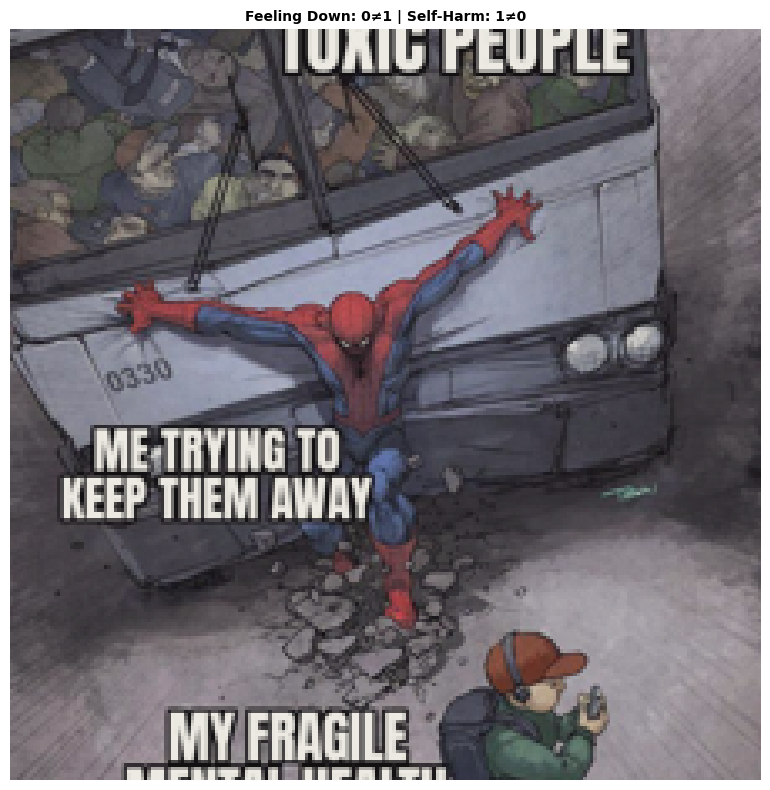


Example 3 (ID: TE-155):
  Class Feeling Down: Predicted 1, Actual 0 (confidence: 0.9978)
  Class Self-Harm: Predicted 0, Actual 1 (confidence: 0.0032)
  OCR Text: How lucky are you? - Me:
  Figurative Reasoning: 1. Cause-Effect: The meme shows a person with an arrow sticking out of their head, which can be interpreted as a metaphor for the negative consequences of constantly thinking about or focusing on negative things. This can lead to mental distress, such as depression or anxiety. 2. Figurative Understanding: The image of the arrow in the person's head represents a literal manifestation of the idea that negative thoughts can be harmful to one's mental well-being. It serves as a visual reminder to be mindful of the thoughts we choose to focus on and to practice positive thinking and self-care. 3. Mental State: The meme depicts a person experiencing a state of distress or discomfort, as indicated by the arrow sticking out of their head. This could represent feelings of overwhelming 

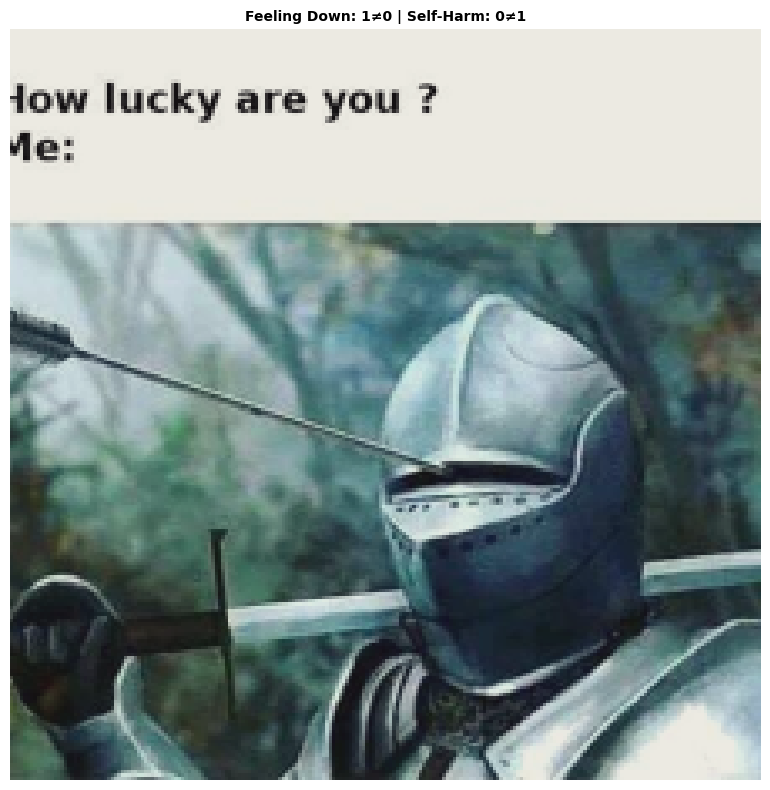


--- Misclassified examples for error pattern: Feeling Down, Low Self-Esteem ---

Example 1 (ID: TE-116):
  Class Feeling Down: Predicted 1, Actual 0 (confidence: 0.9993)
  Class Low Self-Esteem: Predicted 1, Actual 0 (confidence: 0.9375)
  OCR Text: I realized I didn't have a purpose anymore.
  Figurative Reasoning: 1. Cause-Effect: The meme shows a person standing on a clock, which could be interpreted as a metaphor for the person feeling trapped or stuck in their current situation. The person might be experiencing depression or feeling like they are going through a difficult time. 2. Figurative Understanding: The image of the person standing on the clock could symbolize the feeling of being overwhelmed or burdened by time, responsibilities, or life in general. It might also represent the person's desire to break free from their current circumstances and start anew. 3. Mental State: The person in the meme appears to be experiencing a sense of hopelessness or despair, as they are stan

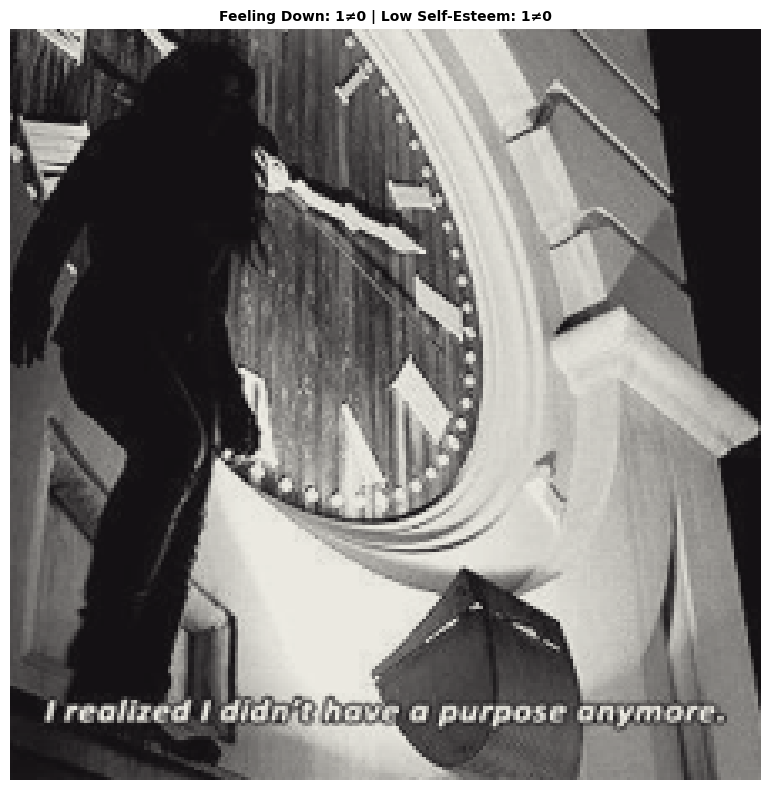


Example 2 (ID: TE-368):
  Class Feeling Down: Predicted 1, Actual 0 (confidence: 0.9963)
  Class Low Self-Esteem: Predicted 1, Actual 0 (confidence: 0.6766)
  OCR Text: -You wanna kill somebody? -Just myself.
  Figurative Reasoning: 1. Cause-Effect: The meme is a commentary on the desire to kill oneself, which is often associated with depression or mental health issues. The figure of speech, "You wanna kill someone? Just yourself" highlights the irony and absurdity of such a statement, as it suggests that one's own life is not worth living. 2. Figurative Understanding: The meme uses a play on words, "You wanna kill someone? Just yourself," to emphasize the idea that one's own life is the only life worth ending. It also implies that those who are experiencing depression or contemplating suicide may view their lives as insignificant or unworthy, which is a common theme in such discussions. 3. Mental State: The meme reflects a state of despondency, hopelessness, or despair, as it deals w

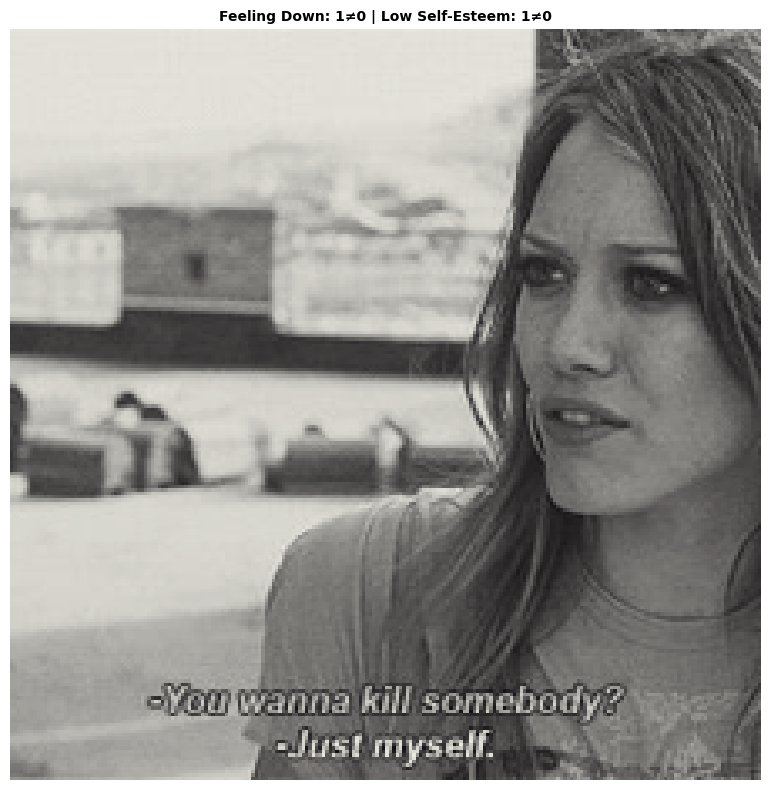


Example 3 (ID: TE-383):
  Class Feeling Down: Predicted 1, Actual 0 (confidence: 0.9987)
  Class Low Self-Esteem: Predicted 0, Actual 1 (confidence: 0.0779)
  OCR Text: I wanna die please Fucking kill me I can't do anything right And it kills me
  Figurative Reasoning: 1. Cause-Effect: The meme shows a pink character holding a sign that says "I want to die please fucking kill me and it kills me right." This could be interpreted as a cry for help or a representation of the character's emotional state. 2. Figurative Understanding: The character's pink color and the use of a heart-shaped sign could be seen as a symbol of vulnerability, emotional fragility, or even a metaphor for the character's inner turmoil. 3. Mental State: The character appears to be in a state of distress, sadness, or hopelessness, as indicated by the sign's message. This could be a representation of depression or a desire for escape from one's current situation.


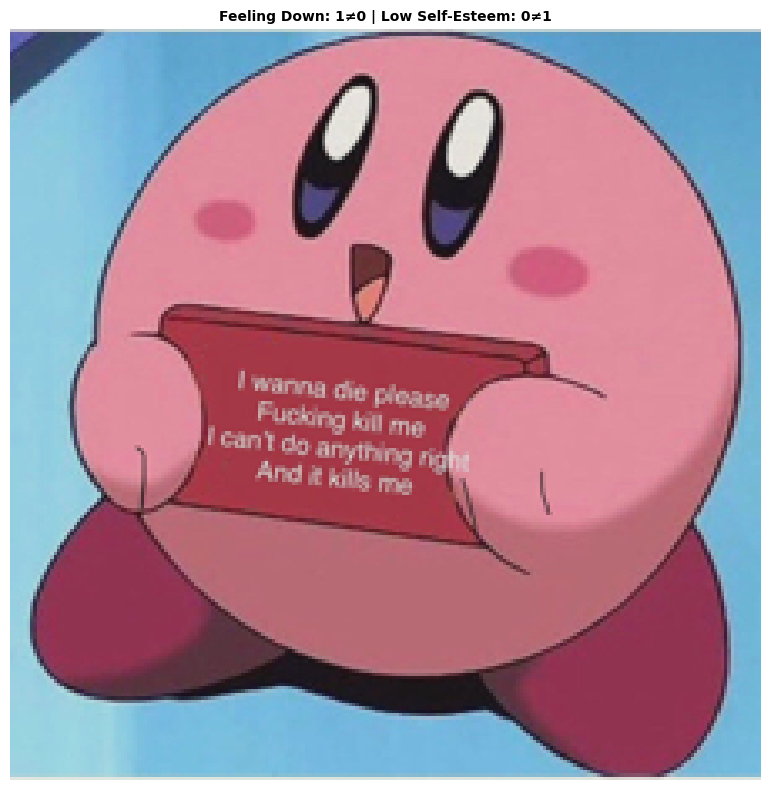


--- Misclassified examples for error pattern: Lack of Interest, Low Self-Esteem ---

Example 1 (ID: TE-358):
  Class Lack of Interest: Predicted 0, Actual 1 (confidence: 0.0004)
  Class Low Self-Esteem: Predicted 1, Actual 0 (confidence: 0.9995)
  OCR Text: WHO: Maintain social distancing. Me: Say no more. -iadin liadin Wiadin ladin Madin
  Figurative Reasoning: 1. Cause-Effect: The man is wearing a belt with a circle on it, which is a symbolic representation of the concept of maintaining social distance. This could be a result of the ongoing COVID-19 pandemic, where people are encouraged to maintain a safe distance from others to prevent the spread of the virus. 2. Figurative Understanding: The man's belt with a circle on it can be interpreted as a visual metaphor for the idea of "maintaining social distance." The circle represents the boundary or distance that people should keep between themselves and others to ensure their safety and the safety of others. 3. Mental State: The man a

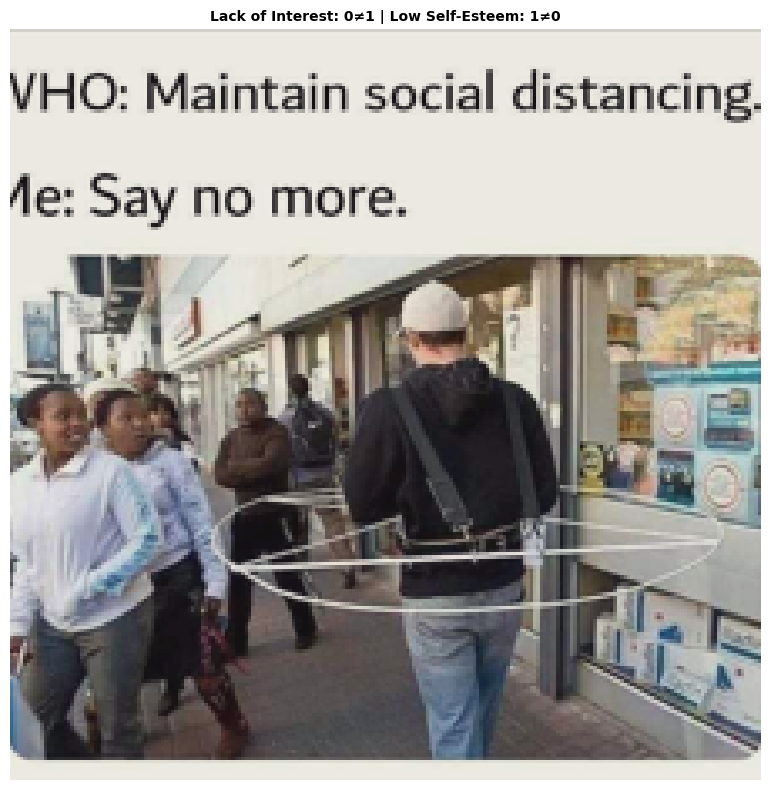


Example 2 (ID: TE-83):
  Class Lack of Interest: Predicted 0, Actual 1 (confidence: 0.0003)
  Class Low Self-Esteem: Predicted 1, Actual 0 (confidence: 0.9994)
  OCR Text: Me ignoring messages until I gain enough energy to be social again
  Figurative Reasoning: 1. Cause-Effect: The meme shows a character, possibly Marge Simpson, looking angry while holding a cell phone. The cause of her anger could be related to receiving an unwanted or annoying message. The effect of this situation is that she is now upset or frustrated. 2. Figurative Understanding: The meme might be using humor or irony to convey the idea that people can be easily annoyed or upset by messages, even if they are not necessarily harmful or threatening. The character's reaction to the message could be seen as an exaggerated or comical representation of how people might feel when they receive unwanted messages. 3. Mental State: The character appears to be in a negative emotional state, such as anger or frustration, due 

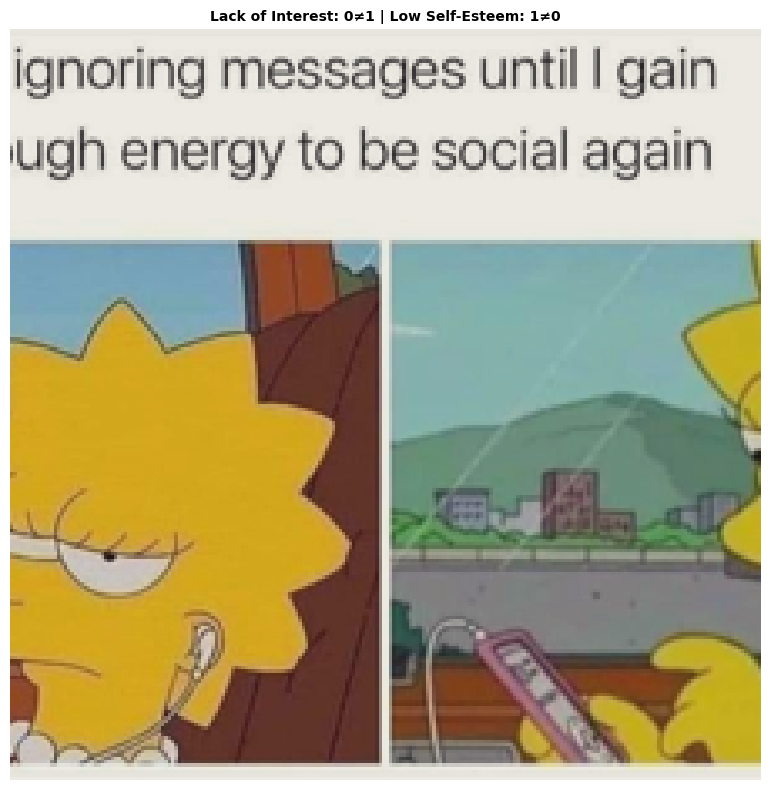


Example 3 (ID: TE-587):
  Class Lack of Interest: Predicted 0, Actual 1 (confidence: 0.0005)
  Class Low Self-Esteem: Predicted 1, Actual 0 (confidence: 0.9956)
  OCR Text: when I see someone from high Schoolins store but they don't c00 me yet
  Figurative Reasoning: 1. Cause-Effect: The meme shows a character walking on train tracks, which can be interpreted as a metaphor for the challenges and obstacles one faces in life. The character's journey on the train tracks represents the struggle to overcome difficulties and reach one's destination. 2. Figurative Understanding: The character walking on train tracks can be seen as a symbol of perseverance and determination. It represents the idea that, despite the challenges and obstacles, one must continue to move forward and overcome adversity. 3. Mental State: The meme depicts a sense of introspection and self-reflection. The character's journey on the train tracks can be seen as a metaphor for personal growth and development, as they nav

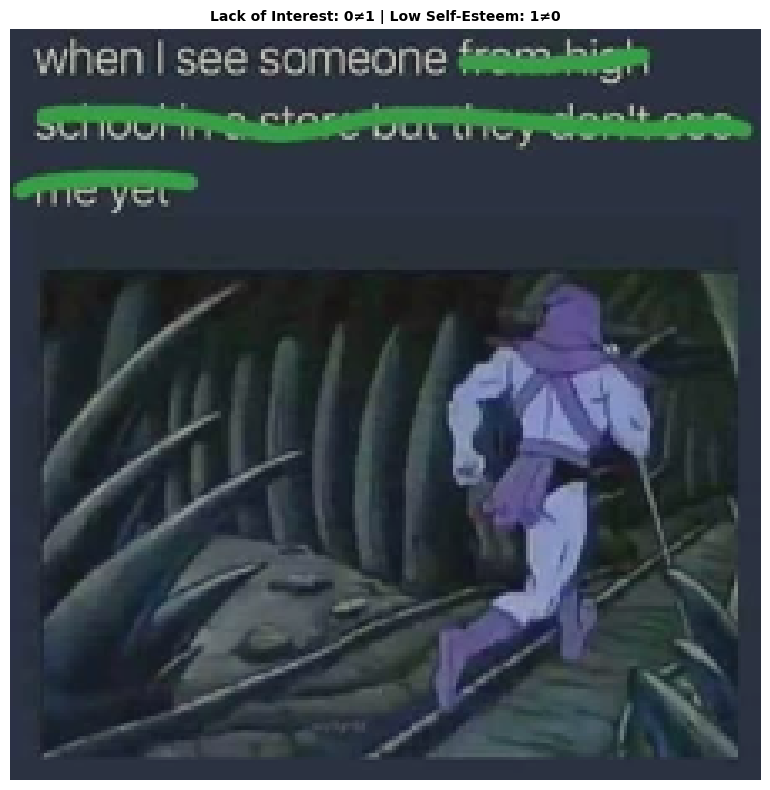


--- Misclassified examples for error pattern: Feeling Down, Sleeping Disorder, Low Self-Esteem ---

Example 1 (ID: TE-245):
  Class Feeling Down: Predicted 1, Actual 0 (confidence: 0.9913)
  Class Sleeping Disorder: Predicted 0, Actual 1 (confidence: 0.0001)
  Class Low Self-Esteem: Predicted 1, Actual 0 (confidence: 0.9539)
  OCR Text: When you maul a kid at the zoo just for the free tranquilizers
  Figurative Reasoning: 1. Cause-Effect: The meme shows a man wearing a rhino costume, which is a humorous and ironic representation of the concept of depression. The man's facial expression and the costume's appearance suggest that he is trying to hide his depression, but it is still evident. 2. Figurative Understanding: The meme uses the image of a rhino costume to symbolize the idea of trying to hide or mask one's emotions, particularly depression. The rhino costume is a playful and exaggerated representation of this concept, highlighting the challenge of dealing with depression and the 

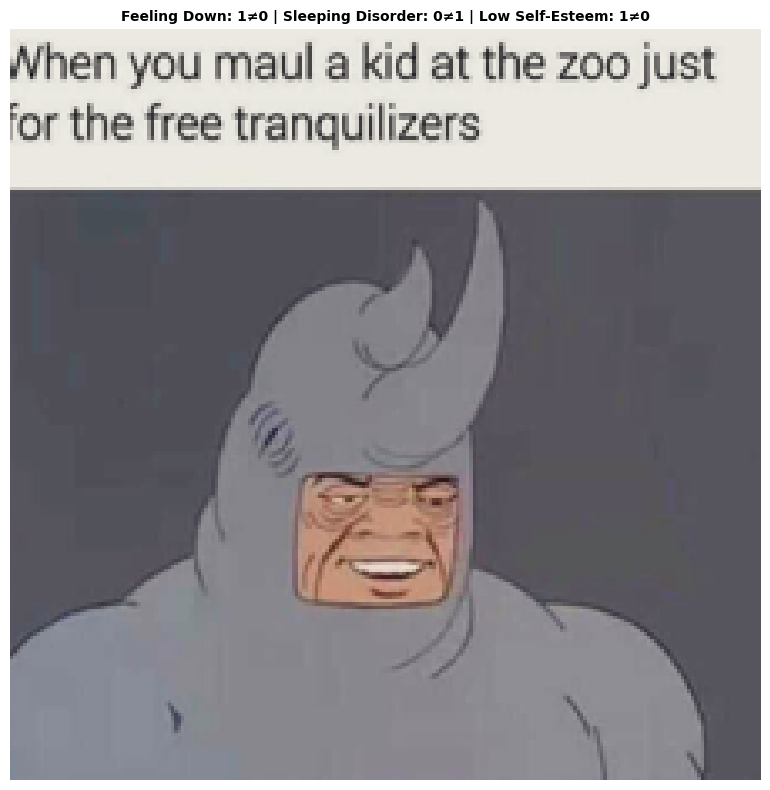


Example 2 (ID: TE-512):
  Class Feeling Down: Predicted 0, Actual 1 (confidence: 0.3698)
  Class Sleeping Disorder: Predicted 0, Actual 1 (confidence: 0.0062)
  Class Low Self-Esteem: Predicted 0, Actual 1 (confidence: 0.0052)
  OCR Text: Novacy You Depression Chronic pain Anxiety Insomnia
  Figurative Reasoning: 1. Cause-Effect: The meme shows an older woman holding a fire extinguisher and a cake with lit candles. The cause-effect relationship here is that the woman is trying to put out the candles on the cake, possibly because she is concerned about the fire hazard or wants to prevent the cake from burning. 2. Figurative Understanding: The meme can be interpreted as a metaphor for dealing with difficult situations or challenges. The woman is using the fire extinguisher to put out the candles, which can symbolize overcoming obstacles or dealing with problems. The cake with lit candles represents a celebration or achievement, and the woman's action of putting out the candles can be se

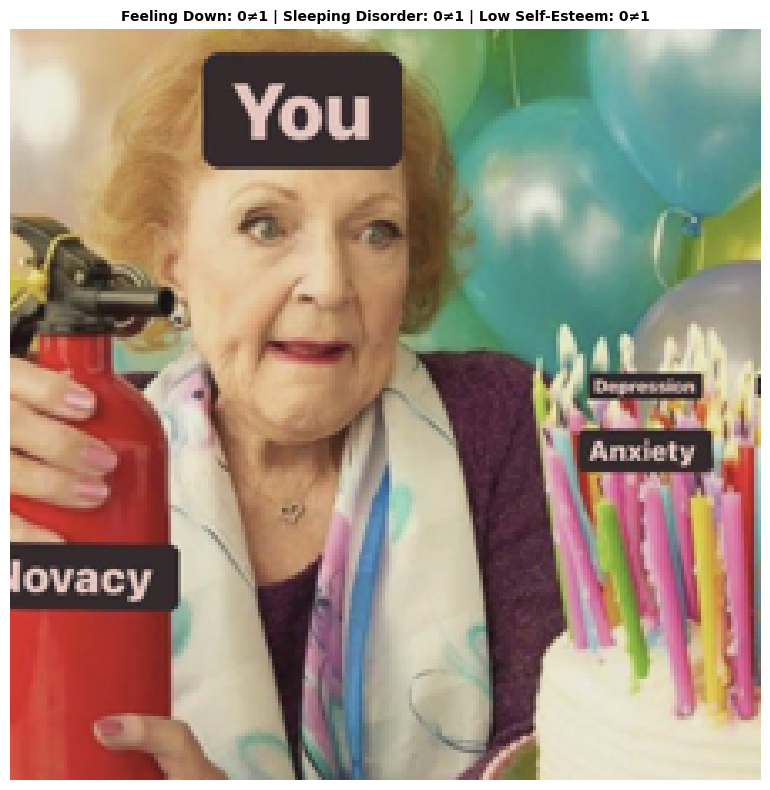


--- Misclassified examples for error pattern: Feeling Down, Eating Disorder, Low Self-Esteem ---

Example 1 (ID: TE-415):
  Class Feeling Down: Predicted 1, Actual 0 (confidence: 0.8985)
  Class Eating Disorder: Predicted 0, Actual 1 (confidence: 0.0000)
  Class Low Self-Esteem: Predicted 1, Actual 0 (confidence: 0.9318)
  OCR Text: Anyone: You should smile more. Me: Onelastconn
  Figurative Reasoning: 1. Cause-Effect: The meme shows a character from the cartoon "Family Guy" lying on the floor with a caption that says "Anyone. You should smile more. Me." The cause of the character's sadness is the lack of smiling, and the effect is that the character is lying on the floor. 2. Figurative Understanding: The meme uses a visual metaphor of the character's facial expression and body language to convey the message of the importance of smiling. The character's sadness is represented by lying on the floor, while smiling would have the opposite effect, making the character happier and more ene

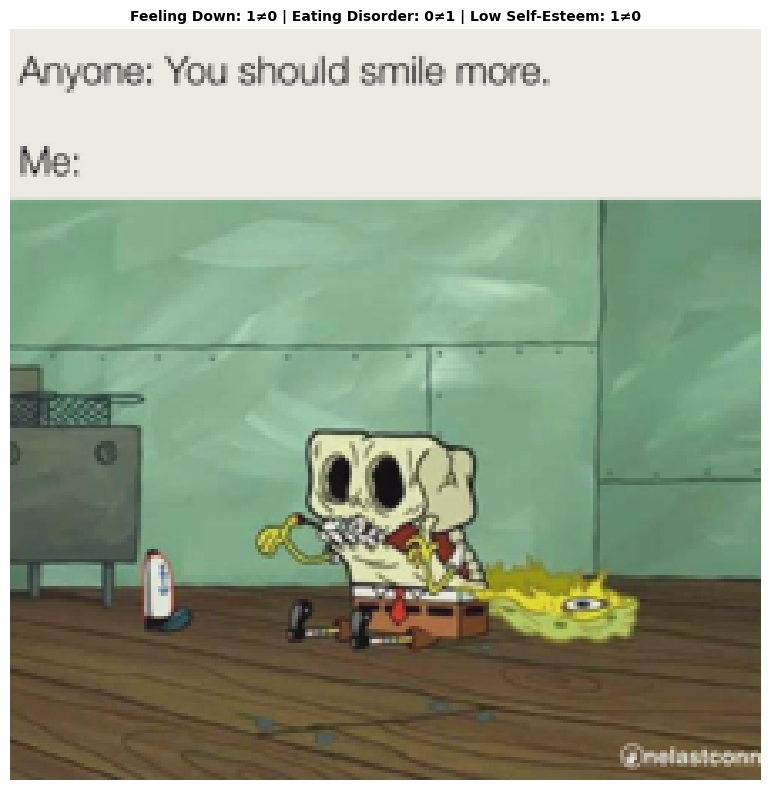


Example 2 (ID: TE-281):
  Class Feeling Down: Predicted 0, Actual 1 (confidence: 0.0001)
  Class Eating Disorder: Predicted 1, Actual 0 (confidence: 0.9990)
  Class Low Self-Esteem: Predicted 0, Actual 1 (confidence: 0.0027)
  OCR Text: So mean Well its not wrong. YOU ARE WASTING YOUR LIFE Well who cares what a cake has to say! We're just going to eat it and poop it out anyway!~ Well she's not wrong. Yeah, go ahead and make us fatter. cake
  Figurative Reasoning: 1. Cause-Effect: The meme shows a woman smiling and holding a cake, with the words "Well, who cares what a cake has to say?" This suggests that the woman is trying to make a point or express her feelings about the cake, possibly indicating that she is not interested in the cake or its contents. 2. Figurative Understanding: The meme's underlying message could be interpreted as a commentary on the importance of enjoying simple pleasures in life, such as sharing a cake with friends or loved ones. The woman's smile and the cake's

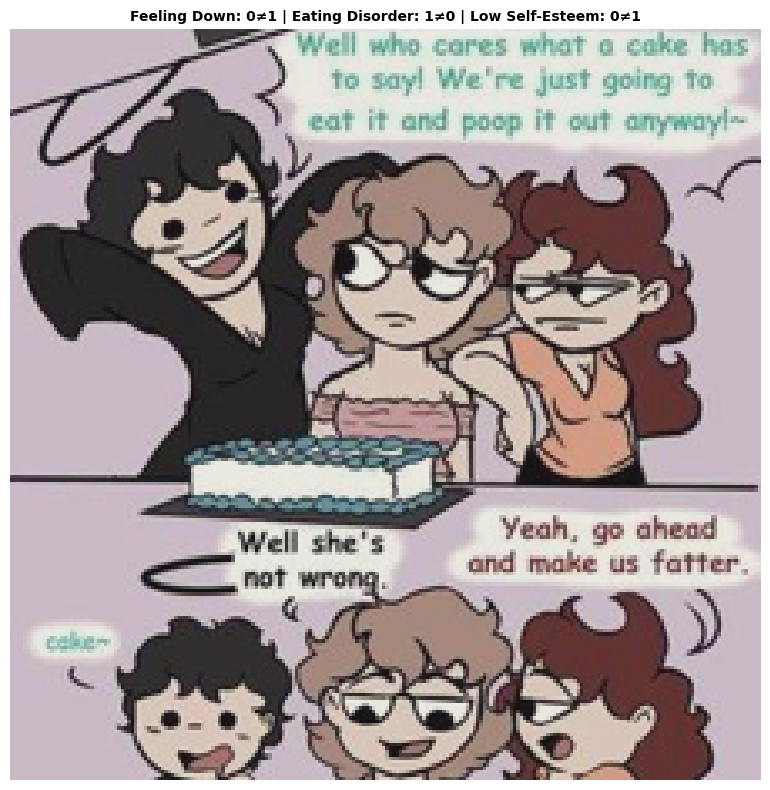


Example 3 (ID: TE-105):
  Class Feeling Down: Predicted 0, Actual 1 (confidence: 0.0000)
  Class Eating Disorder: Predicted 1, Actual 0 (confidence: 0.8920)
  Class Low Self-Esteem: Predicted 0, Actual 1 (confidence: 0.0896)
  OCR Text: AVERAGE WEIGHT 90kg the burden i put on my parents by existing, being useless, ugly and untalented 5400kg Okg
  Figurative Reasoning: 1. Cause-Effect: The text suggests that the burden of the person's existence is causing stress on their parents. 2. Figurative Understanding: The meme uses animals and numbers to represent the burden of the person's existence. The sheep represents the person's weight, the elephant represents the person's size, and the giraffe represents the person's height. The numbers next to the animals represent the perceived burden on their parents. 3. Mental State: The meme conveys a sense of guilt or responsibility, as the person feels they are burdening their parents with their existence.


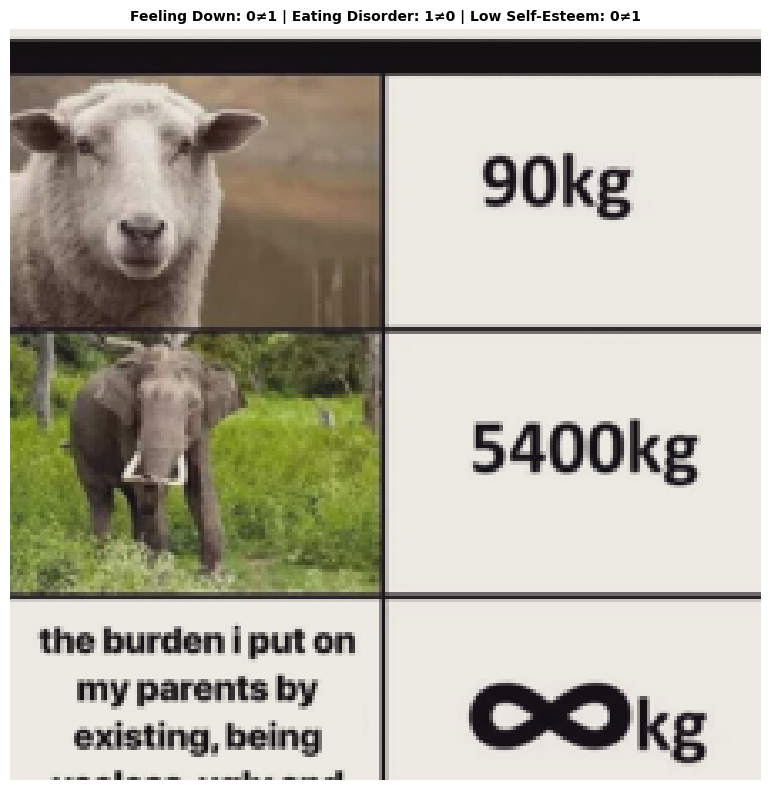


--- Misclassified examples for error pattern: Feeling Down, Eating Disorder ---

Example 1 (ID: TE-217):
  Class Feeling Down: Predicted 0, Actual 1 (confidence: 0.0021)
  Class Eating Disorder: Predicted 1, Actual 0 (confidence: 0.9990)
  OCR Text: me embracing my bad coping mechanisms the skills I learned in DBT the skill I learned in DBT
  Figurative Reasoning: 1. Cause-Effect: The man is holding the cat, which could be a cause for the cat to feel comfortable and relaxed. 2. Figurative Understanding: The image of the cat sitting on the person's lap can be interpreted as a metaphor for seeking comfort and support from others. 3. Mental State: The cat appears to be in a relaxed and content state, as it is sitting on the person's lap.


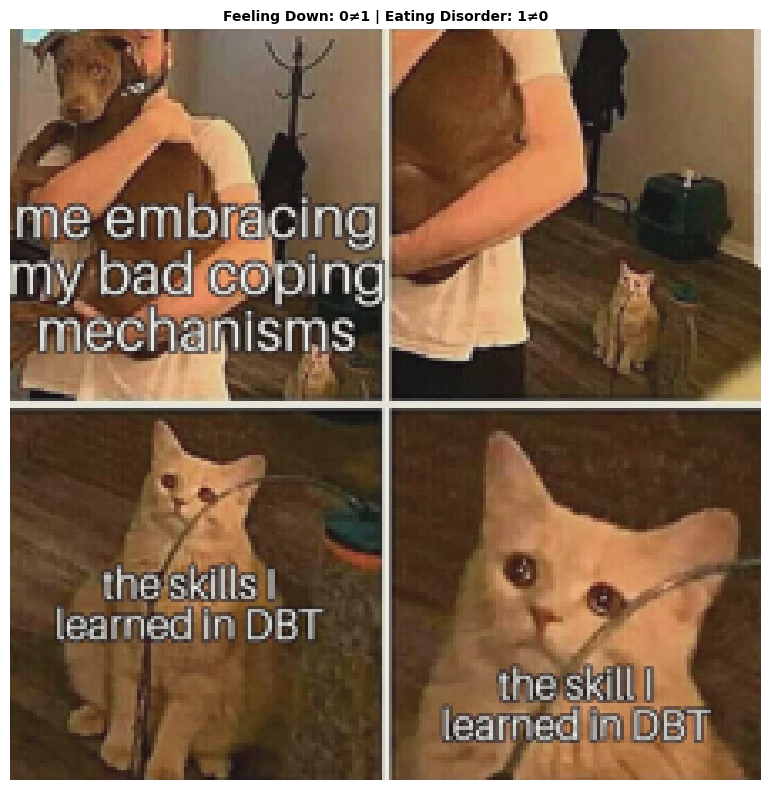


Example 2 (ID: TE-150):
  Class Feeling Down: Predicted 1, Actual 0 (confidence: 0.9841)
  Class Eating Disorder: Predicted 0, Actual 1 (confidence: 0.0001)
  OCR Text: When someone tells you to look deep inside yourself to accomplish you life goals
  Figurative Reasoning: 1. Cause-Effect: The man in the image is feeling depressed and is hiding his face in a trash can. This could be due to various reasons such as personal issues, social pressures, or a lack of support from friends and family. 2. Figurative Understanding: The man's action of hiding his face in the trash can can be interpreted as a metaphor for feeling overwhelmed or burdened by life's problems. It also symbolizes the idea of feeling trapped or stuck in a difficult situation. 3. Mental State: The man appears to be experiencing feelings of sadness, hopelessness, or despair. He may be struggling with mental health issues, such as depression or anxiety, and may be seeking comfort or solace in the trash can.


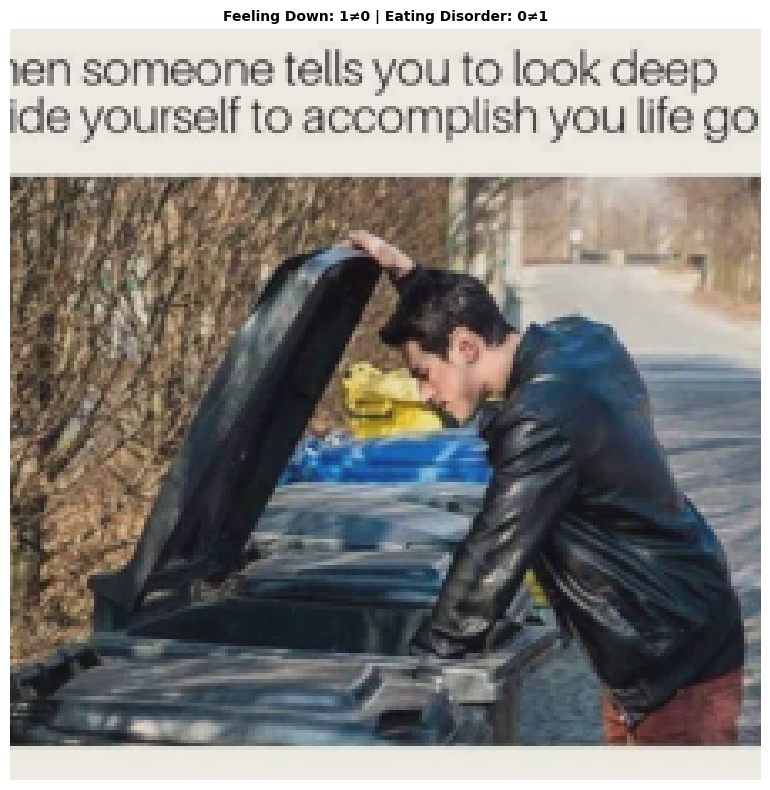


Example 3 (ID: TE-130):
  Class Feeling Down: Predicted 0, Actual 1 (confidence: 0.0055)
  Class Eating Disorder: Predicted 1, Actual 0 (confidence: 0.8441)
  OCR Text: Antidepressants Brit Week Me k Sevices My orgasms
  Figurative Reasoning: 1. Cause-Effect: The meme shows a man running with a soccer ball, while another man is walking away. The cause-effect relationship here is that the man running is trying to catch up to the other man who is walking away. This could be interpreted as a metaphor for the struggle of overcoming depression or anxiety, where the person running represents the effort to overcome the negative emotions, while the walking man represents the resistance or lack of motivation to change. 2. Figurative Understanding: The meme can be seen as a representation of the concept of "running away" from problems or negative emotions. The man running with the soccer ball might symbolize the act of trying to escape from depression or anxiety, while the walking man represent

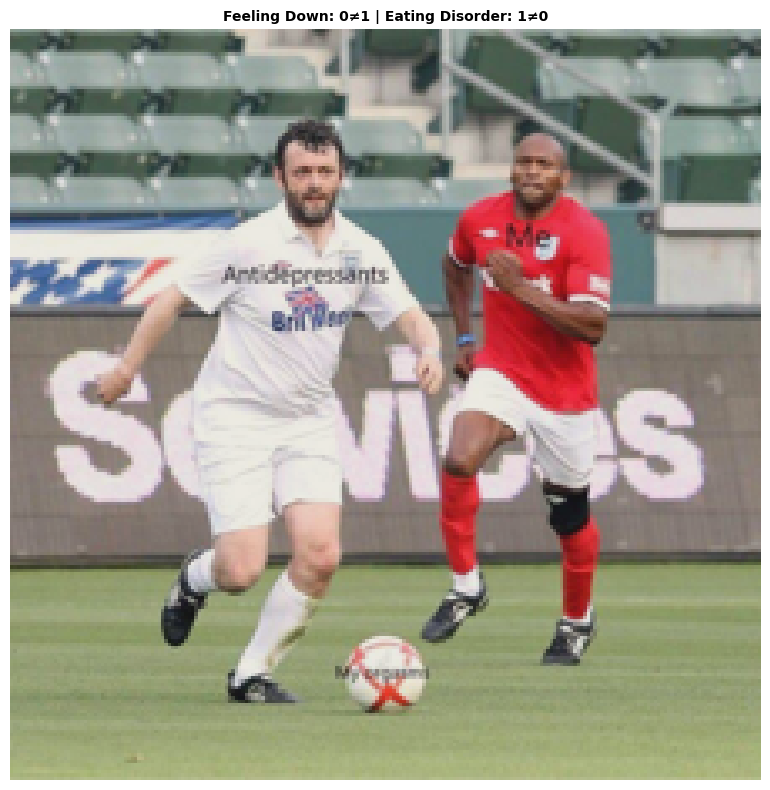


--- Misclassified examples for error pattern: Feeling Down, Low Self-Esteem, Self-Harm ---

Example 1 (ID: TE-161):
  Class Feeling Down: Predicted 1, Actual 0 (confidence: 0.9545)
  Class Low Self-Esteem: Predicted 1, Actual 0 (confidence: 0.9906)
  Class Self-Harm: Predicted 0, Actual 1 (confidence: 0.0285)
  OCR Text: Therapist: "You need to reconnect with your inner child." My inner child: aborted reams ABORTED DREAMS VOID POSTER end me.
  Figurative Reasoning: 1. Cause-Effect: The meme shows a man in a brown robe, possibly a therapist, talking to a man in a white robe, who is described as his "inner child." The therapist is suggesting that the man needs to reconcile with his inner child. This could be a result of unresolved emotional issues or past traumas that the man is struggling with. 2. Figurative Understanding: The meme uses the concept of an "inner child" to represent the unresolved emotional baggage or unhealed wounds from one's past. The inner child symbolizes the vulner

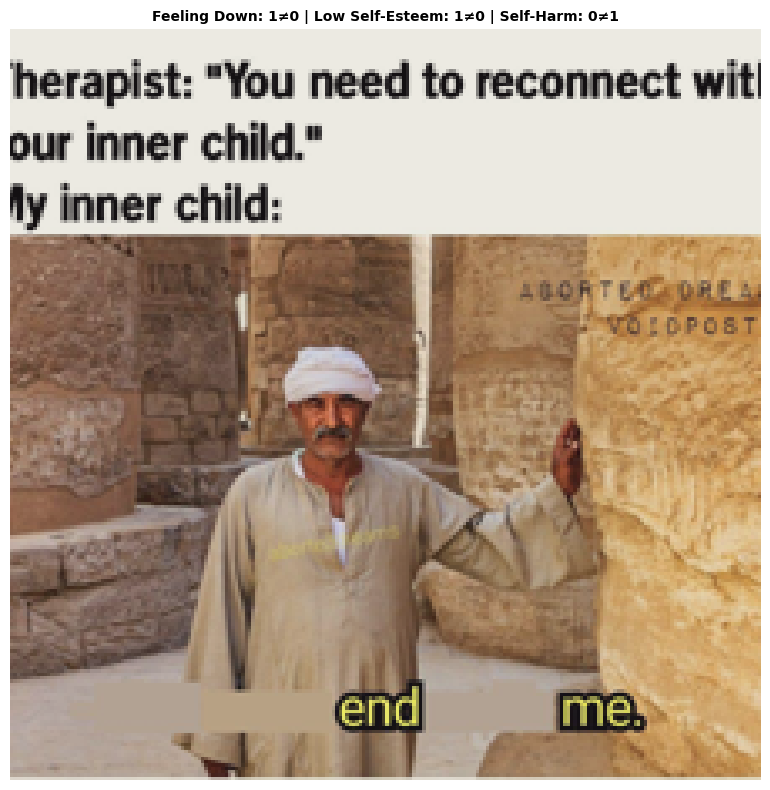


Example 2 (ID: TE-60):
  Class Feeling Down: Predicted 1, Actual 0 (confidence: 0.9047)
  Class Low Self-Esteem: Predicted 1, Actual 0 (confidence: 0.9972)
  Class Self-Harm: Predicted 0, Actual 1 (confidence: 0.0354)
  OCR Text: I hate not being good enough.
  Figurative Reasoning: 1. Cause-Effect: The meme shows a person with a scarred arm, which could be a result of self-harm or an accident. The cause of the scar might be a lack of self-love or a feeling of not being good enough. 2. Figurative Understanding: The meme's underlying message could be about the importance of self-love and self-acceptance. It might be suggesting that one should not be too hard on themselves and should be good enough as they are. 3. Mental State: The person in the meme appears to be in a state of self-reflection or self-doubt, as they are contemplating their own worth and the consequences of their actions.


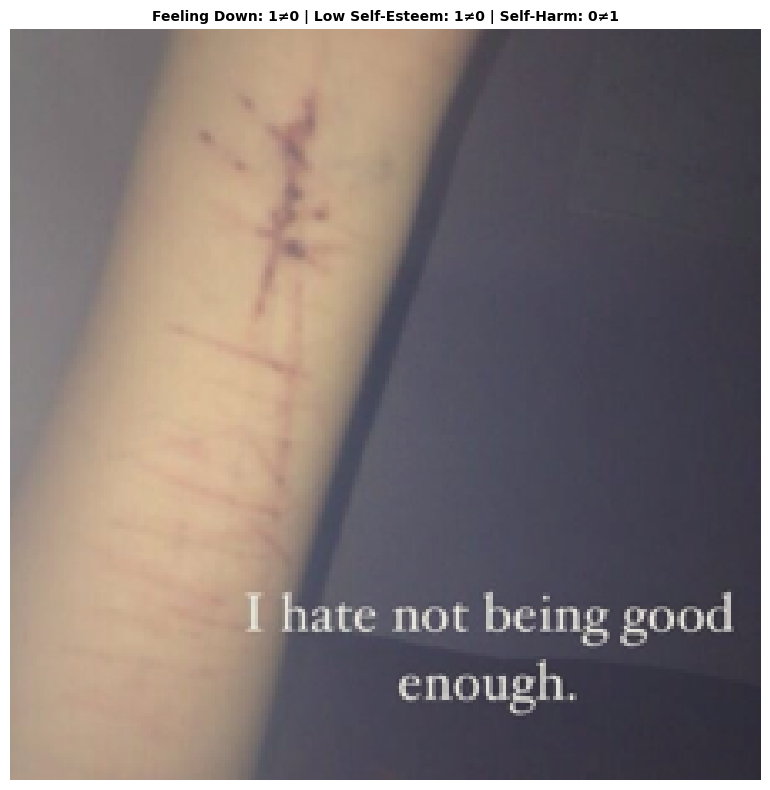


Example 3 (ID: TE-183):
  Class Feeling Down: Predicted 1, Actual 0 (confidence: 0.9565)
  Class Low Self-Esteem: Predicted 0, Actual 1 (confidence: 0.0143)
  Class Self-Harm: Predicted 1, Actual 0 (confidence: 0.8719)
  OCR Text: Some optimist: At least at rock bottom you can only go up from here Me: made with mematic
  Figurative Reasoning: 1. Cause-Effect: The meme shows a cartoon character, likely Pikachu, holding a knife and a gun. This could be interpreted as a representation of the negative consequences of mental health issues, such as depression, and the potential for self-harm. 2. Figurative Understanding: The image of the cartoon character holding a knife and a gun can be seen as a metaphor for the internal struggles and turmoil that individuals with mental health issues may experience. The character's actions may symbolize the desperation and hopelessness that can accompany depression. 3. Mental State: The meme portrays a character in a state of distress, possibly experienc

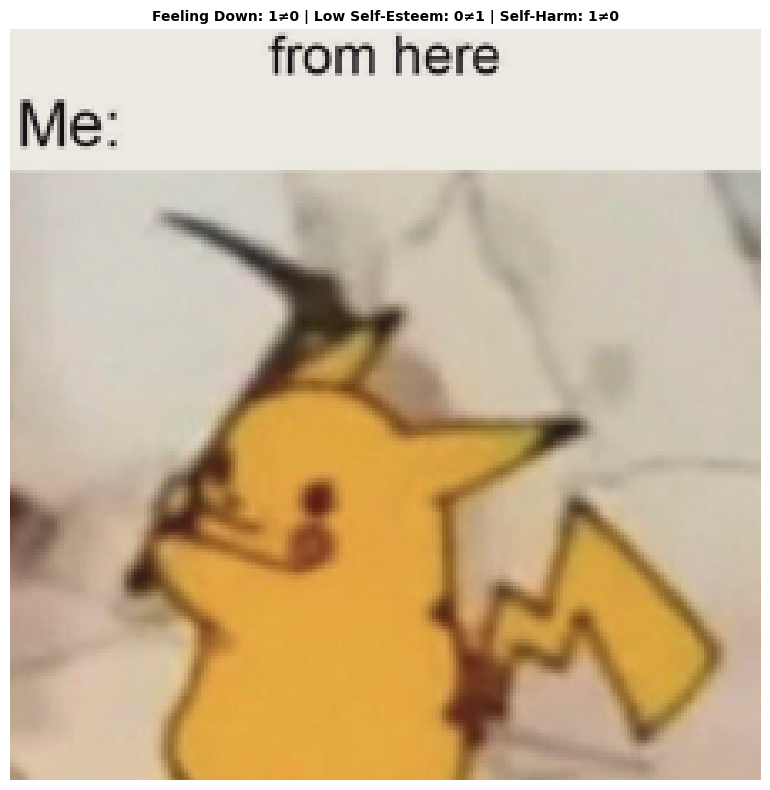


--- Misclassified examples for error pattern: Lack of Interest ---

Example 1 (ID: TE-179):
  Class Lack of Interest: Predicted 0, Actual 1 (confidence: 0.2054)
  OCR Text: You're so quiet... I'm usually quiet when I'm having a bad day. But you're always quiet... อ Mayson quiet equals depression so sad
  Figurative Reasoning: 1. Cause-Effect: The meme shows a dog with a sad face and a speech bubble saying "But you're always quiet." This implies that the dog is feeling sad or lonely, possibly due to the owner's lack of interaction or attention. 2. Figurative Understanding: The meme uses a dog as a metaphor for a person experiencing depression or loneliness. The dog's sad face represents the emotional state of the person, and the speech bubble conveys their feelings of being unnoticed or ignored. 3. Mental State: The dog in the meme is depicted as feeling sad or lonely, as indicated by its sad face and the speech bubble's message. This emotional state is likely a representation of the p

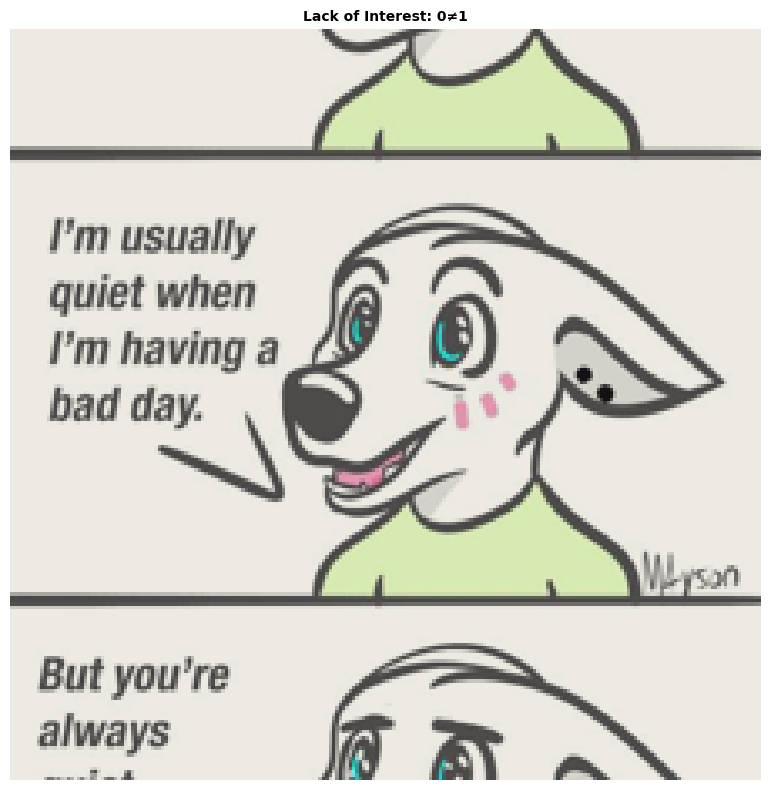


Example 2 (ID: TE-206):
  Class Lack of Interest: Predicted 0, Actual 1 (confidence: 0.0107)
  OCR Text: su @sharinganv Me waiting for my phone to stop ringing, so I can text the person who called me and ask what they want:
  Figurative Reasoning: 1. Cause-Effect: The meme shows a girl with red hair sitting in front of a computer, looking sad. The cause of her sadness could be related to her phone, as she is waiting for it to stop ringing. The effect of this situation is that she is unable to focus on her computer or engage in any other activity. 2. Figurative Understanding: The meme can be interpreted as a metaphor for the constant distractions and interruptions in modern life. The girl's red hair symbolizes a striking visual element, while the computer represents technology and digital communication. The phone ringing represents the constant notifications and calls that can disrupt our focus and mental well-being. 3. Mental State: The girl in the meme is experiencing a state of frus

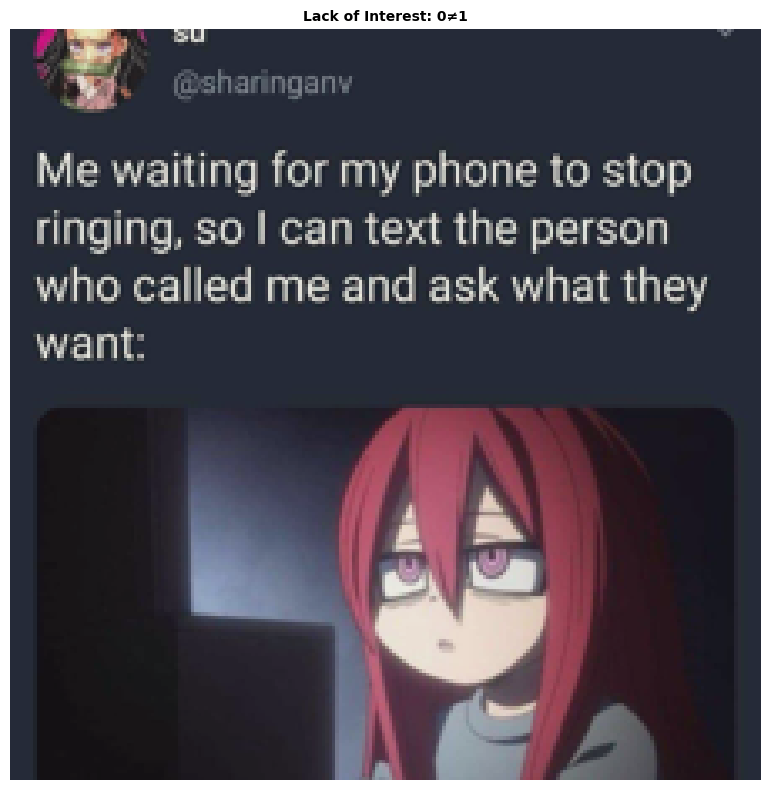


Example 3 (ID: TE-510):
  Class Lack of Interest: Predicted 0, Actual 1 (confidence: 0.0079)
  OCR Text: My responsibilities me
  Figurative Reasoning: 1. Cause-Effect: The girl is crying because she is responsible for the robot's tasks, and she is overwhelmed by the workload. 2. Figurative Understanding: The meme can be interpreted as a metaphorical representation of the burden of responsibility and the emotional impact it can have on a person. 3. Mental State: The girl is experiencing emotional distress, as she is responsible for the robot's tasks and is overwhelmed by the workload.


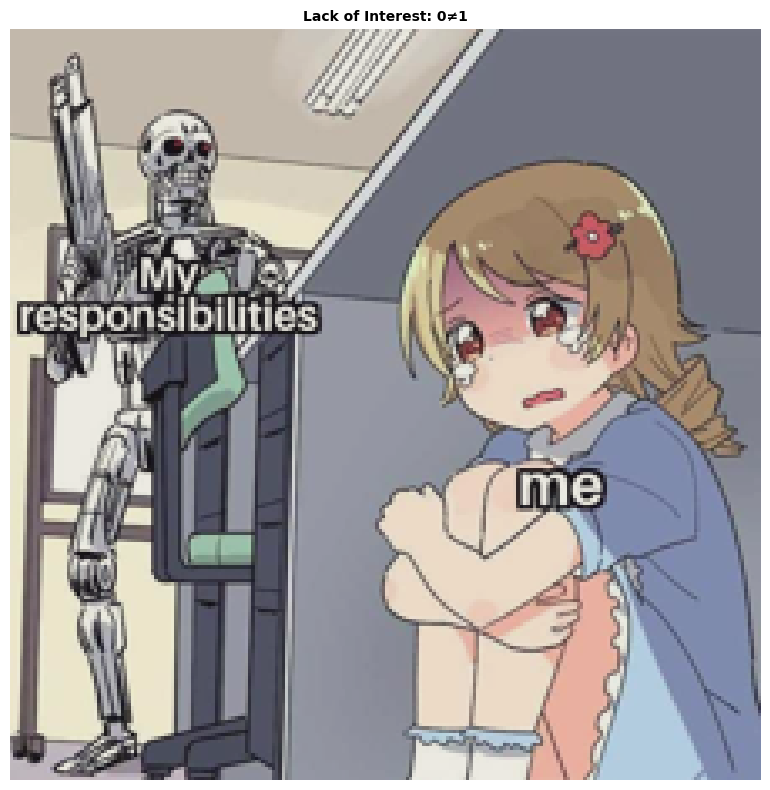


--- Misclassified examples for error pattern: Sleeping Disorder ---

Example 1 (ID: TE-165):
  Class Sleeping Disorder: Predicted 1, Actual 0 (confidence: 0.9991)
  OCR Text: BINGO Neglected kid edition 'Wow! You're very mature Video Games for your age!' 5 hours of sleep every night Socially awkward Hours on random Wikipedia articles 'We pay for everything, 'You're at Good grades Tries to take Anxiety OUR house, not to draw as little space you're so not yours" attention as possible ungrateful' 'You're wasting so Free space! Loneliness much Depression 'Why don't you show emotions?' Self Hatred potential' Likes Interiorized guilt Tried writing a journal but gave up philosophy, psychology and science Has no ambition Watches a lot of movies, shows and Youtube Did sports & martial arts to please mom but gave up Gave up on relationships Few to no friends Cries silently until falling asleep Wants to disappear without being noticed
  Figurative Reasoning: 1. Cause-Effect: The card highlights 

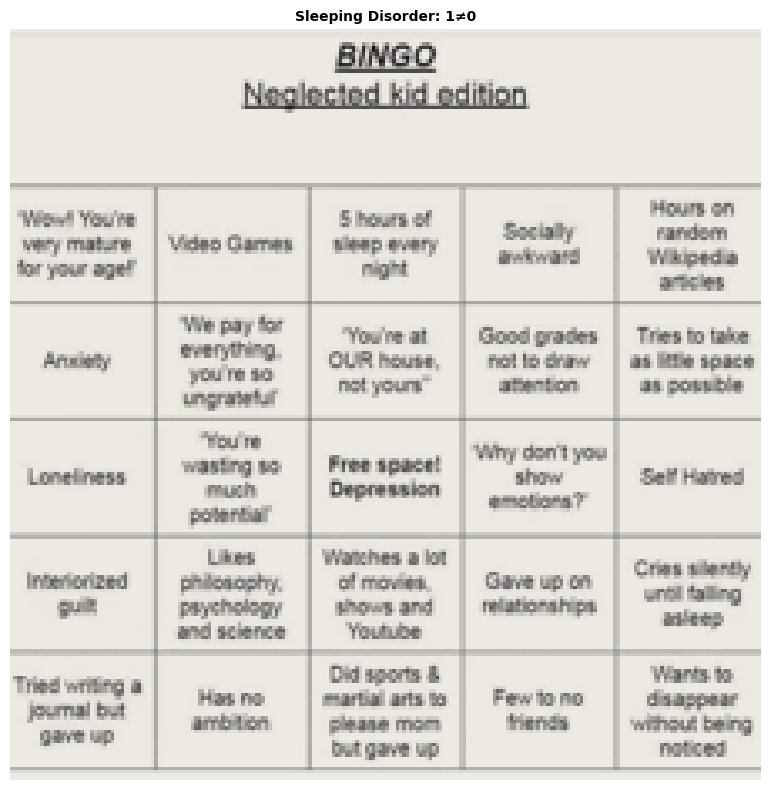


Example 2 (ID: TE-423):
  Class Sleeping Disorder: Predicted 1, Actual 0 (confidence: 0.9960)
  OCR Text: Me on zoom call after 2 minutes of waking up
  Figurative Reasoning: 1. Cause-Effect: The meme shows a woman on a cell phone, possibly talking to someone, and she is described as being "on zoom call after 2 minutes of waking up." This suggests that the woman is experiencing a lack of sleep or has been awake for a short period of time. 2. Figurative Understanding: The meme can be interpreted as a commentary on the modern-day phenomenon of people being constantly connected through technology, even during their waking hours. The woman's tired appearance might symbolize the exhaustion that can result from constantly being "on" and available to others. 3. Mental State: The woman appears to be tired or sleepy, as she is described as looking "zombie-like" and having "dead eyes." This suggests that she might be experiencing fatigue or sleep deprivation, which can affect her mental state a

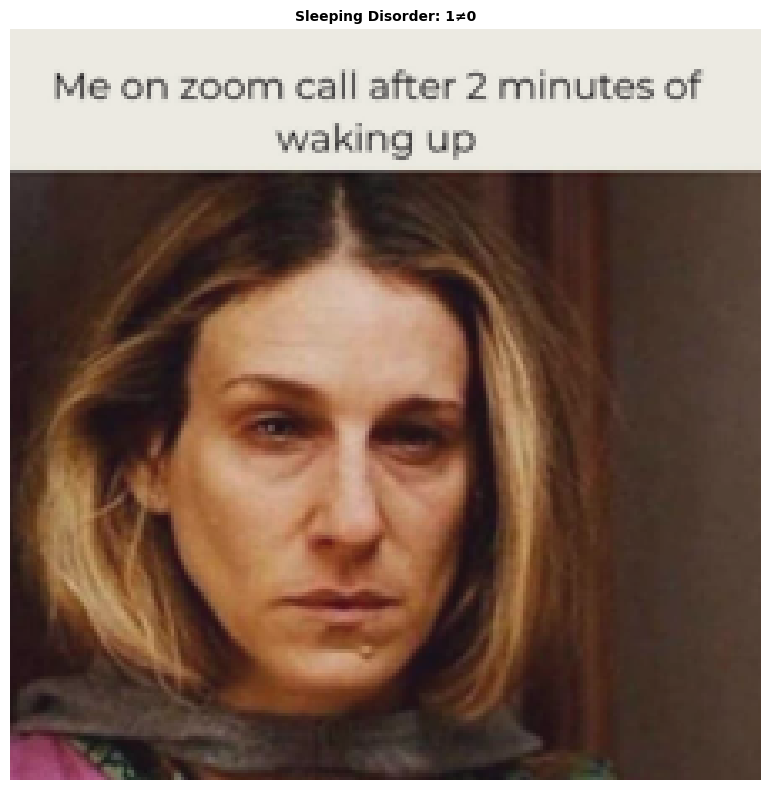


Example 3 (ID: TE-419):
  Class Sleeping Disorder: Predicted 0, Actual 1 (confidence: 0.2036)
  OCR Text: jolly spooks @tiredspook how I sleep during a 3-hour depression nap in the middle of the day vs how I sleep at night 17/12/2016, 08:23
  Figurative Reasoning: 1. Cause-Effect: The meme shows a comparison between a person sleeping and another person experiencing a 3-hour depression. The cause of the depression could be attributed to the lack of sleep, as the person in the image is shown sleeping. 2. Figurative Understanding: The meme uses the concept of sleep and depression to create a metaphorical representation of the impact of sleep on mental health. It suggests that a lack of sleep can lead to a state of depression, which is represented by the person sleeping in the image. 3. Mental State: The meme shows a person sleeping and another person experiencing a 3-hour depression. The person sleeping is likely in a relaxed and restful state, while the person experiencing depression is

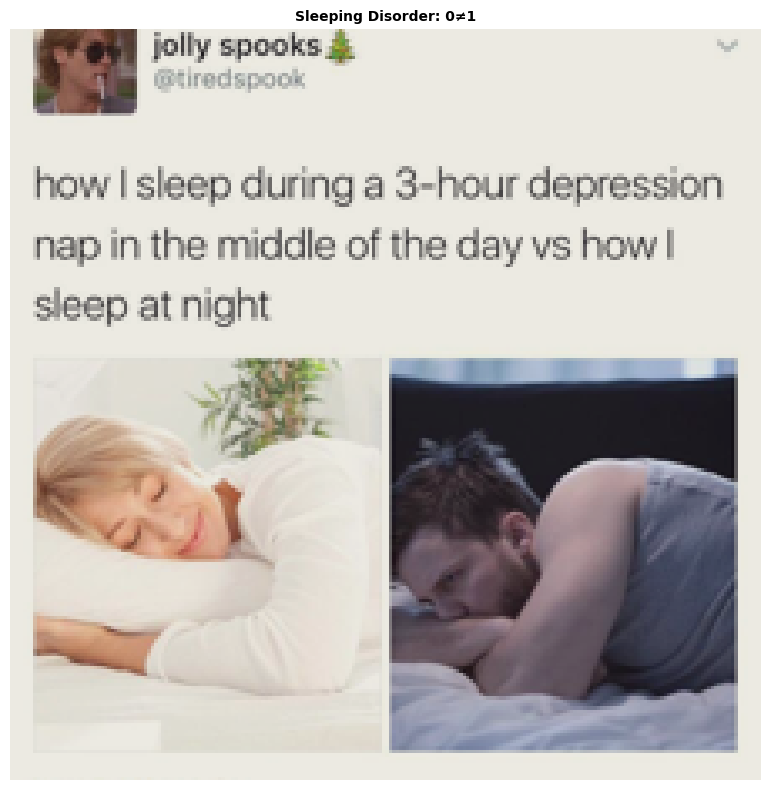


--- Misclassified examples for error pattern: Lack of Interest, Concentration Problem ---

Example 1 (ID: TE-261):
  Class Lack of Interest: Predicted 0, Actual 1 (confidence: 0.0002)
  Class Concentration Problem: Predicted 0, Actual 1 (confidence: 0.0003)
  OCR Text: "How's everything?" Me: Debt Memes Alcohol Pornhub @thetastelessgentlemen Anxiety Me Regrets Drugs Stress
  Figurative Reasoning: 1. Cause-Effect: The meme shows a man holding an umbrella and standing in water, which could be interpreted as a metaphor for dealing with depression. The cause of this situation could be the man's emotional state, and the effect could be the coping mechanism he employs by holding an umbrella to shield himself from the rain. 2. Figurative Understanding: The meme's underlying message could be that depression is like a heavy rain that drenches one's life, and the man holding the umbrella symbolizes the effort to shield oneself from the emotional burden. The umbrella also represents the coping m

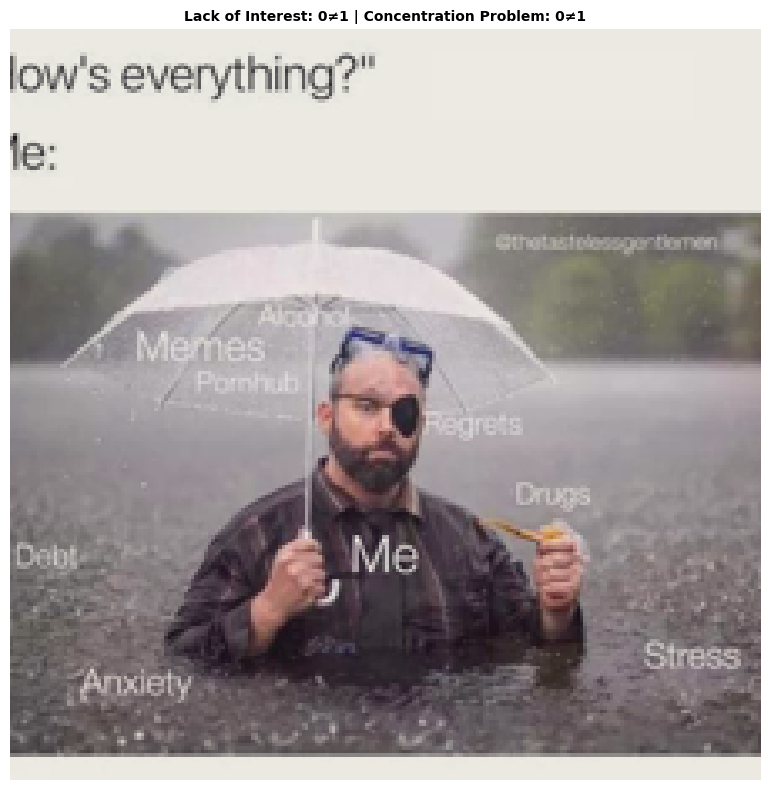


--- Misclassified examples for error pattern: Eating Disorder, Sleeping Disorder ---

Example 1 (ID: TE-386):
  Class Eating Disorder: Predicted 1, Actual 0 (confidence: 0.9992)
  Class Sleeping Disorder: Predicted 0, Actual 1 (confidence: 0.0001)
  OCR Text: When you finally lose your appetite after years with your ED and you realize it days after.
  Figurative Reasoning: 1. Cause-Effect: The meme shows a man with a "loading" symbol on his forehead, suggesting that he is experiencing depression or mental stress. The cause of this situation could be related to personal issues, work-related stress, or other factors that contribute to mental health challenges. 2. Figurative Understanding: The "loading" symbol on the man's forehead represents the weight or burden of his emotions or thoughts, which can be interpreted as a metaphor for the mental strain that depression or stress can cause. This image might also be seen as a humorous or ironic representation of the concept of mental health,

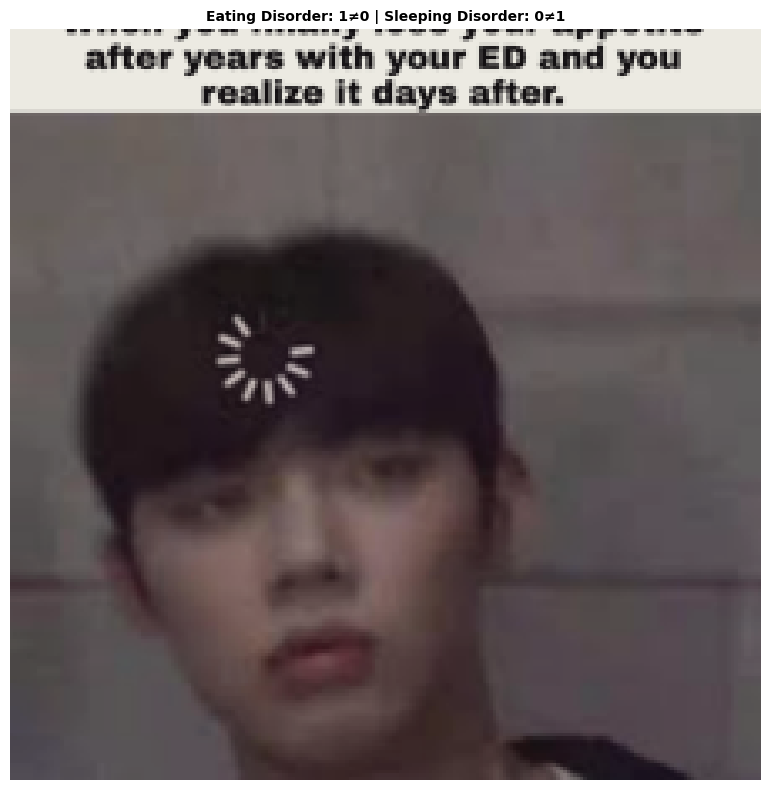


Example 2 (ID: TE-40):
  Class Eating Disorder: Predicted 1, Actual 0 (confidence: 0.7818)
  Class Sleeping Disorder: Predicted 0, Actual 1 (confidence: 0.0958)
  OCR Text: I'M WIDE AWAKE
  Figurative Reasoning: 1. Cause-Effect: The meme shows a woman with red lips and the words "a wide awake" written above her. The cause-effect relationship here is that the woman's red lips might be a result of her being awake and conscious of her appearance. 2. Figurative Understanding: The phrase "a wide awake" can be interpreted as a metaphor for being alert, conscious, or attentive. The meme might be suggesting that the woman is wide awake, meaning she is aware of her surroundings and actively engaged in her environment. 3. Mental State: The woman in the meme appears to be in a state of alertness or awareness, as indicated by her wide-awake expression. This could be a representation of her being focused, attentive, or conscious of her actions and surroundings.


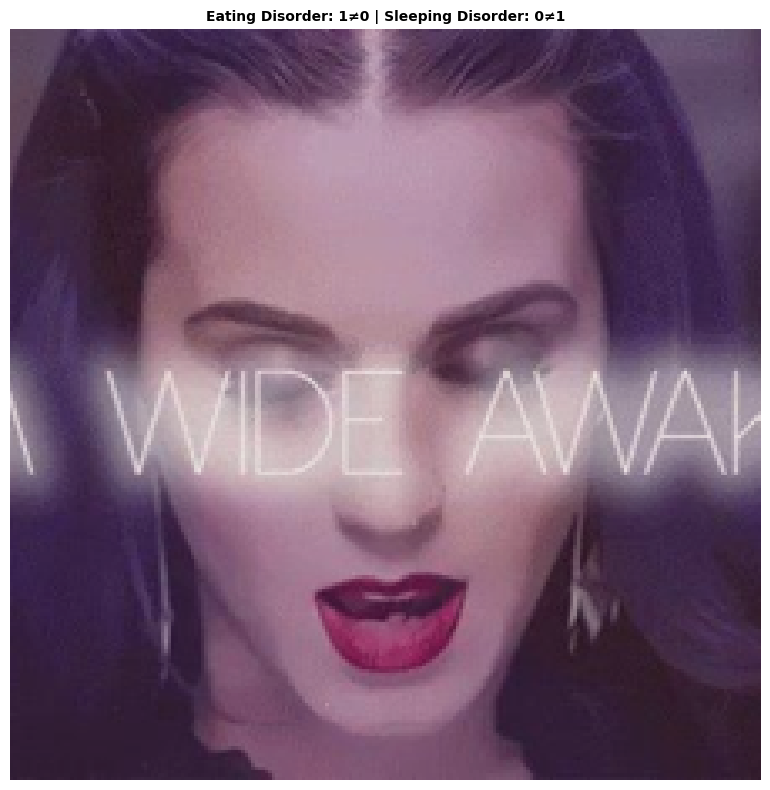


--- Misclassified examples for error pattern: Feeling Down, Concentration Problem ---

Example 1 (ID: TE-345):
  Class Feeling Down: Predicted 0, Actual 1 (confidence: 0.0141)
  Class Concentration Problem: Predicted 0, Actual 1 (confidence: 0.0000)
  OCR Text: "if your friends jumped off a--" Me:
  Figurative Reasoning: 1. Cause-Effect: The meme shows a man jumping off a bridge, which is an extreme action that can be attributed to various factors such as depression, stress, or a desire for adventure. The act of jumping off a bridge can be seen as a result of these factors, and it highlights the consequences of such actions. 2. Figurative Understanding: The meme can be interpreted as a metaphor for the idea of "jumping off a bridge" as a symbol of taking drastic action or making a significant change in one's life. It can also be seen as a humorous or ironic representation of the phrase "if your friends jumped off a bridge, would you jump too?" as a way to encourage self-reflection and

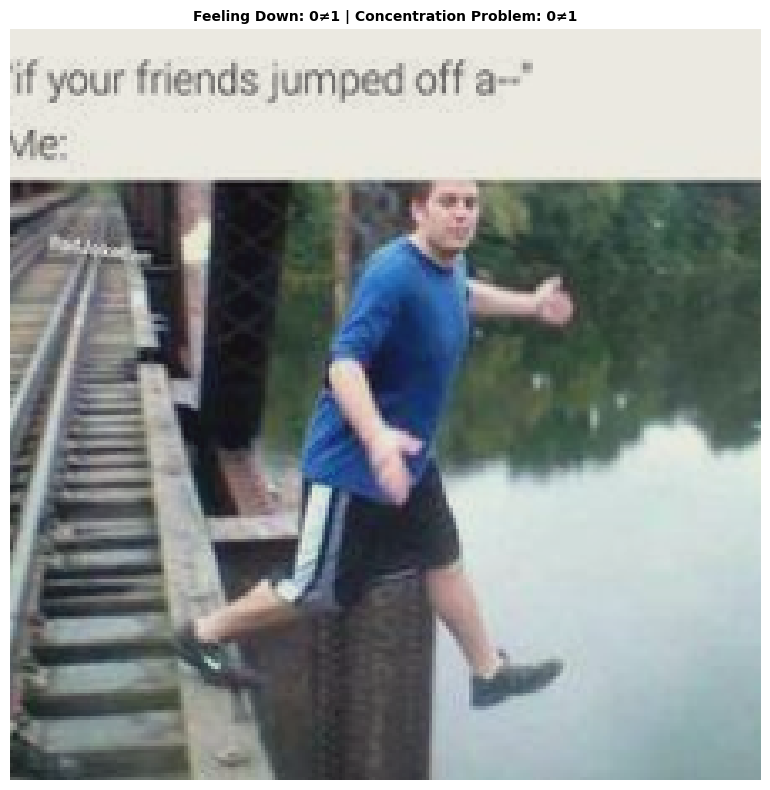


--- Misclassified examples for error pattern: Feeling Down, Sleeping Disorder ---

Example 1 (ID: TE-335):
  Class Feeling Down: Predicted 1, Actual 0 (confidence: 0.9882)
  Class Sleeping Disorder: Predicted 0, Actual 1 (confidence: 0.0188)
  OCR Text: When someone asks you how your night went Didn't get much sleep, but I did get a few hours of anxiety in
  Figurative Reasoning: 1. Cause-Effect: The meme shows a man in a suit, likely a businessman, expressing frustration and exhaustion. The cause of this situation could be the stress and long hours associated with a demanding job or workload. 2. Figurative Understanding: The meme can be interpreted as a metaphor for the challenges and pressures faced by professionals in various fields. The man's exhaustion and frustration represent the mental and emotional toll that work-related stress can take on individuals. 3. Mental State: The man in the meme is experiencing feelings of exhaustion, frustration, and anxiety. This emotional state i

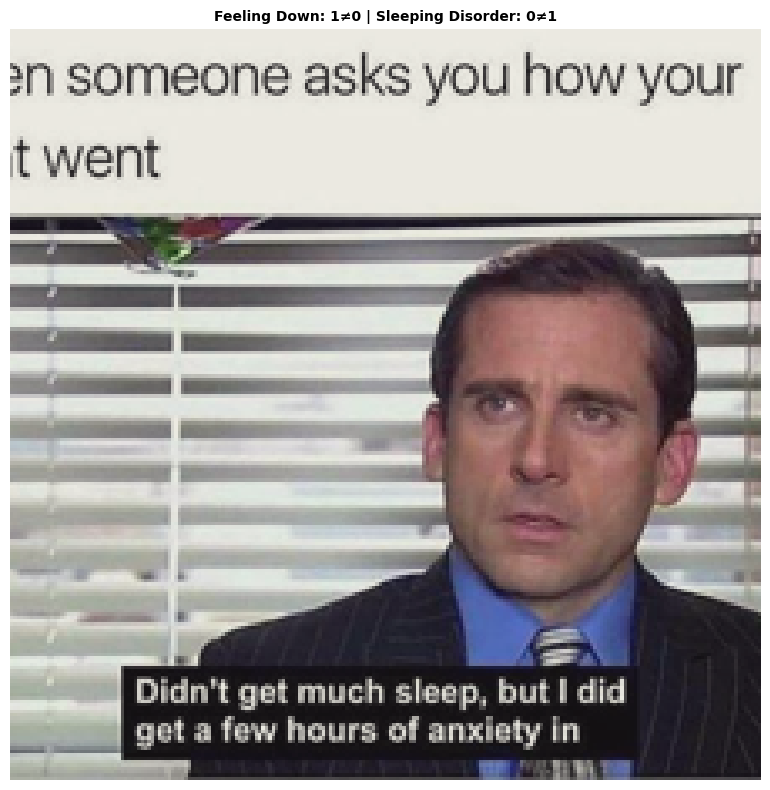


Example 2 (ID: TE-467):
  Class Feeling Down: Predicted 0, Actual 1 (confidence: 0.0002)
  Class Sleeping Disorder: Predicted 1, Actual 0 (confidence: 0.9986)
  OCR Text: Billie Eilish - when the party's over 292 mili näyttökerton What it actually looks like: Not much of a house
  Figurative Reasoning: 1. Cause-Effect: The meme shows a cartoon of a panda bear in front of a fence, with the words "What it actually looks like" written below. The cause of this situation is likely the panda bear's attempt to look cute or endearing, while the effect is that it might not be as adorable as it initially appears. 2. Figurative Understanding: The meme uses a visual metaphor to convey the idea that something might not be as it initially seems. The panda bear's attempt to look cute is a symbolic representation of the idea that things might not be as they appear, and the fence serves as a barrier or boundary that highlights the contrast between the panda bear's appearance and reality. 3. Mental Sta

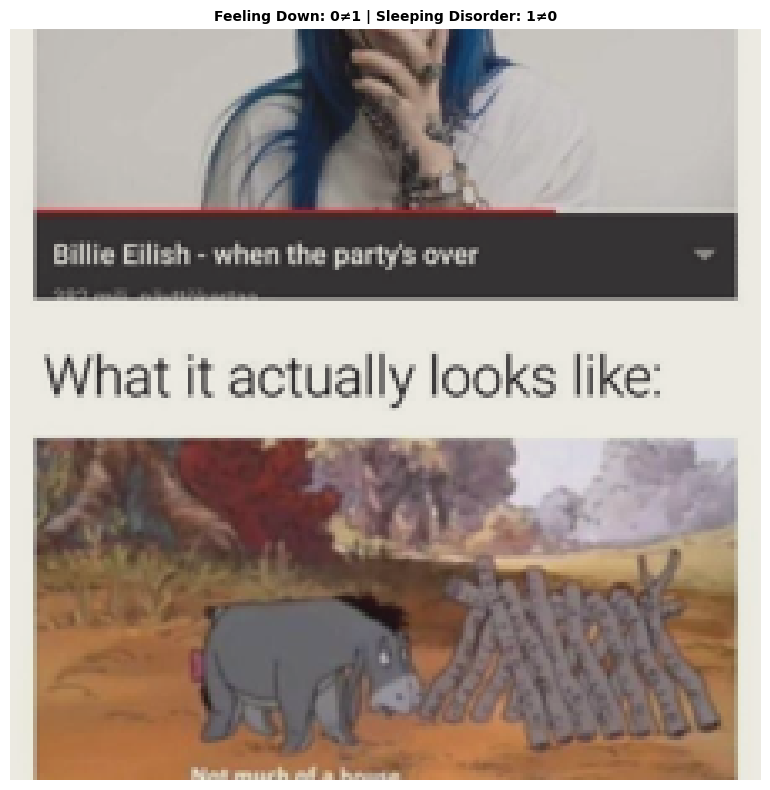


Example 3 (ID: TE-565):
  Class Feeling Down: Predicted 1, Actual 0 (confidence: 0.9852)
  Class Sleeping Disorder: Predicted 0, Actual 1 (confidence: 0.0064)
  OCR Text: When someone asks you how your night went Didn't get much sleep, but I did get a few hours of anxiety in
  Figurative Reasoning: 1. Cause-Effect: The meme shows a man in a suit, possibly a businessman, with a caption that says "When someone asks you how your night went." The cause of this situation could be a lack of sleep or a late night at work. The effect is that the man appears tired and possibly not at his best. 2. Figurative Understanding: The meme can be interpreted as a commentary on the stress and exhaustion that can come with a demanding job or a busy lifestyle. The man's tired appearance symbolizes the mental and emotional state of someone who has had a long and tiring night. 3. Mental State: The man in the meme appears tired and possibly stressed, as he is described as looking "anxious" or "depressed." Th

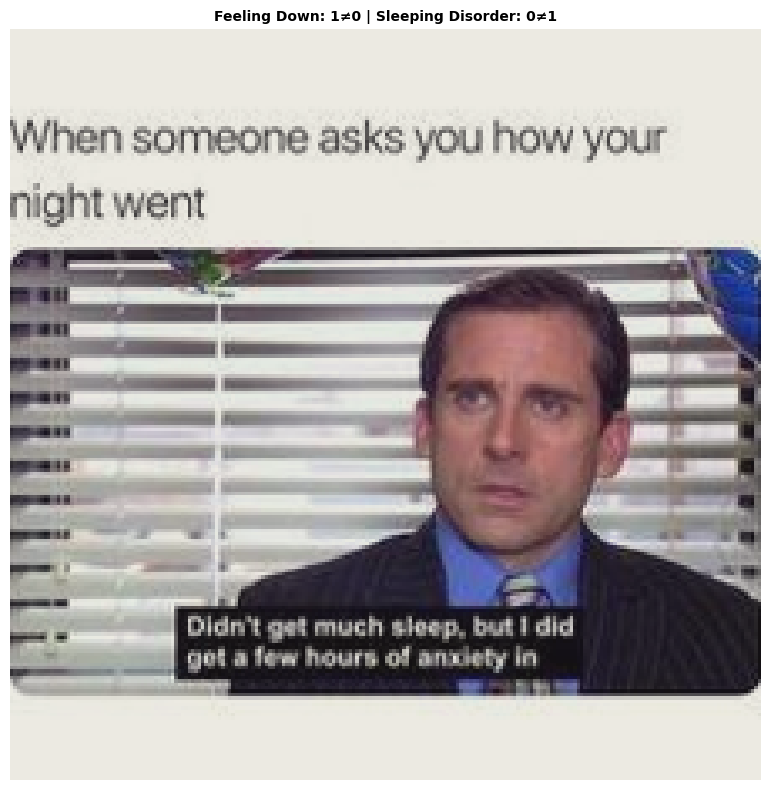


--- Misclassified examples for error pattern: Feeling Down, Low Self-Esteem, Concentration Problem ---

Example 1 (ID: TE-65):
  Class Feeling Down: Predicted 1, Actual 0 (confidence: 0.9856)
  Class Low Self-Esteem: Predicted 1, Actual 0 (confidence: 0.9989)
  Class Concentration Problem: Predicted 0, Actual 1 (confidence: 0.0004)
  OCR Text: restrained-thoughts I often question my existance. I've been told that eveyone has their place on earth, we all have a purpose. Well what exactly is my purpose being on this earth? I'm quite useless.
  Figurative Reasoning: 1. Cause-Effect: The meme shows a woman looking out a window, possibly contemplating her purpose in life. The cause of her contemplation could be the emptiness she feels, and the effect could be her seeking to find meaning or purpose in her existence. 2. Figurative Understanding: The woman looking out the window might symbolize introspection, self-reflection, or a desire to connect with the world beyond her immediate surround

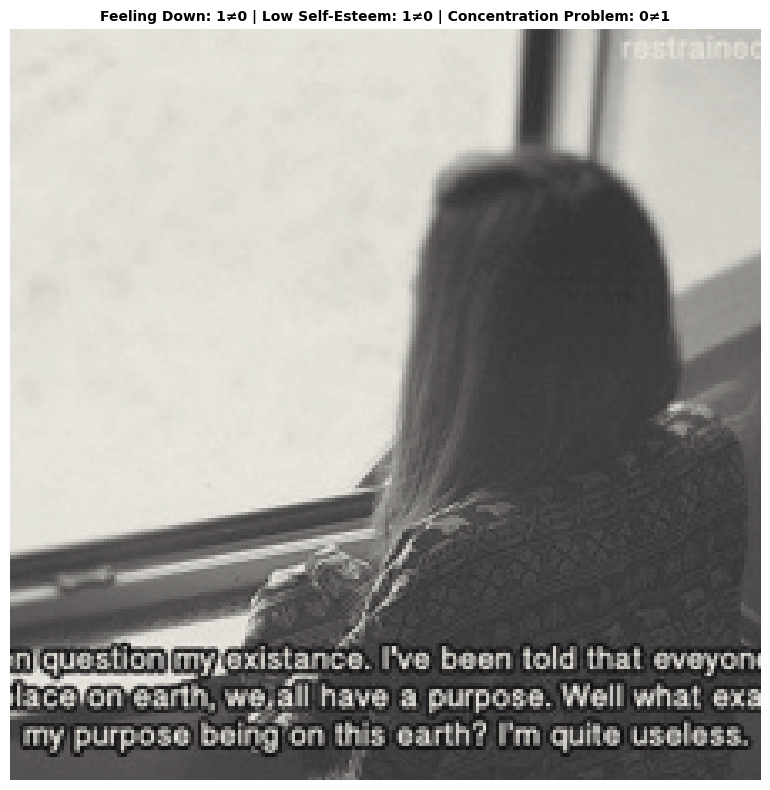


--- Misclassified examples for error pattern: Concentration Problem ---

Example 1 (ID: TE-319):
  Class Concentration Problem: Predicted 0, Actual 1 (confidence: 0.0962)
  OCR Text: What if overthinking, fear, anxiety and worry (caused by low serotonin) is holding you back instead of low motivation/low dopamine? HOLLYWOOD PRODUCTION. DIRECTOR CAMERA DATE SCENE TAKE
  Figurative Reasoning: 1. Cause-Effect: The meme shows a man with his head in his hands, suggesting that he is experiencing stress, anxiety, or depression. The cause of this situation could be related to work, personal relationships, or other factors that contribute to mental health issues. 2. Figurative Understanding: The image of the man with his head in his hands can be interpreted as a metaphor for feeling overwhelmed or burdened by life's challenges. It can also symbolize the idea of "head in the sand" or "burying one's head in the sand," which means to ignore or avoid problems or challenges. 3. Mental State: The man

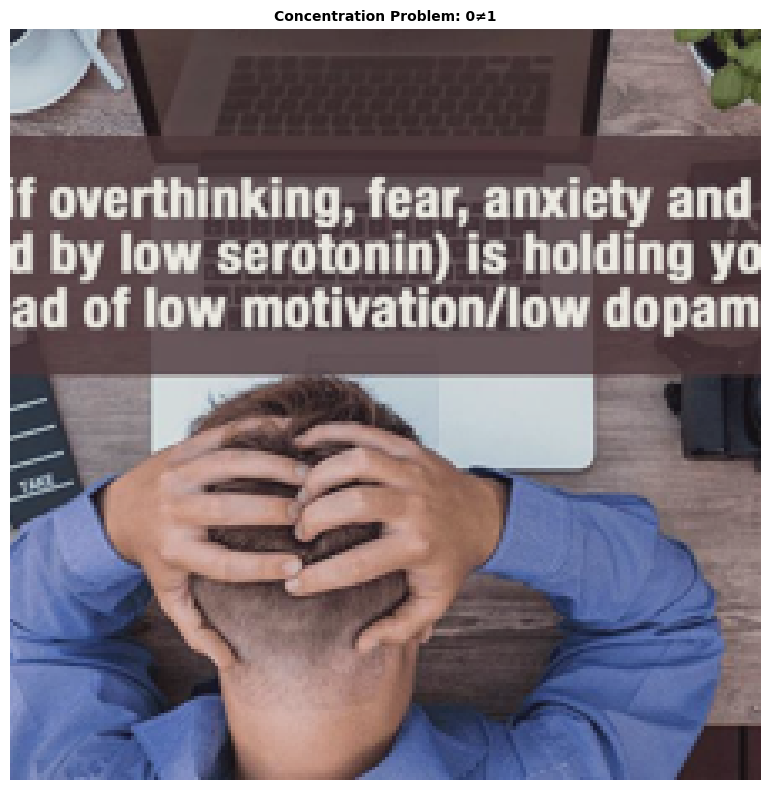


Example 2 (ID: TE-552):
  Class Concentration Problem: Predicted 0, Actual 1 (confidence: 0.0004)
  OCR Text: Me trying to remember someone's name a minute after they tell me
  Figurative Reasoning: 1. Cause-Effect: The meme shows a man trying to remember someone's name, which is a common cause of frustration and embarrassment. The effect of this situation is that the man might feel embarrassed or frustrated if he cannot remember the person's name. 2. Figurative Understanding: The meme can be interpreted as a metaphor for the difficulty of remembering someone's name, as it is a common challenge that many people face. The image of the man trying to remember the name can symbolize the struggle to recall important information or details. 3. Mental State: The meme depicts a man in a state of frustration or embarrassment, as he is trying to remember someone's name and might feel overwhelmed or anxious if he cannot recall it.


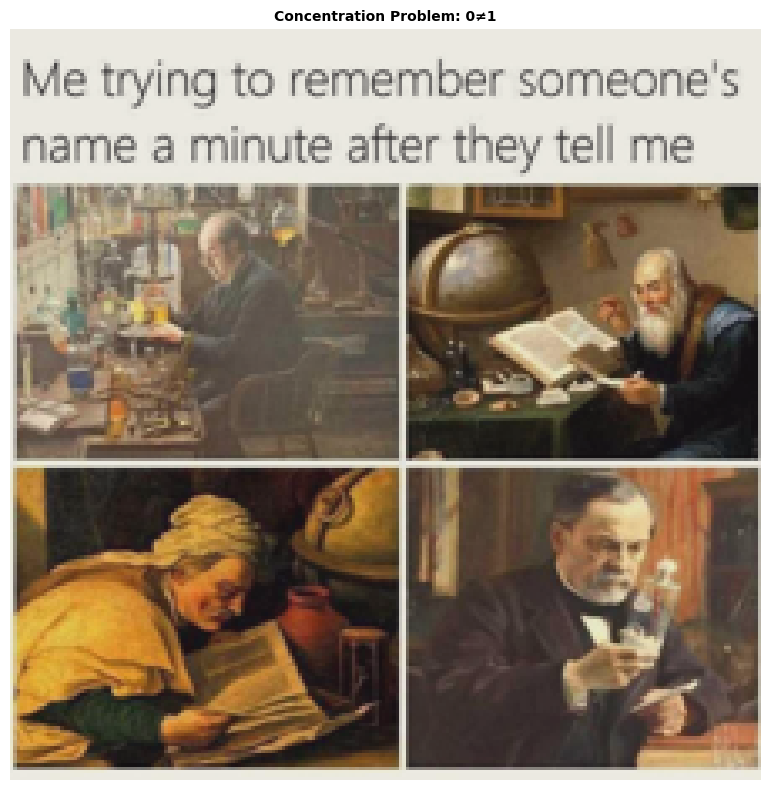


Example 3 (ID: TE-585):
  Class Concentration Problem: Predicted 0, Actual 1 (confidence: 0.0004)
  OCR Text: TO-DOList 1. Don't break down 2. ???
  Figurative Reasoning: 1. Cause-Effect: The meme is a cartoon of a person writing on a piece of paper, with the words "To-Do List" written at the top. The person is also holding a pencil. The cause of this situation is the person's desire to create a list of tasks to accomplish. The effect is the creation of a written list, which can help the person stay organized and focused on their goals. 2. Figurative Understanding: The meme can be interpreted as a metaphor for the act of creating a list of tasks. The person is depicted as a "cartoon" character, which implies that the meme is not meant to be taken literally. The underlying message is that creating a list of tasks can be a helpful tool for managing one's time and priorities. 3. Mental State: The person in the meme is depicted as being focused and engaged in the task of writing their to-

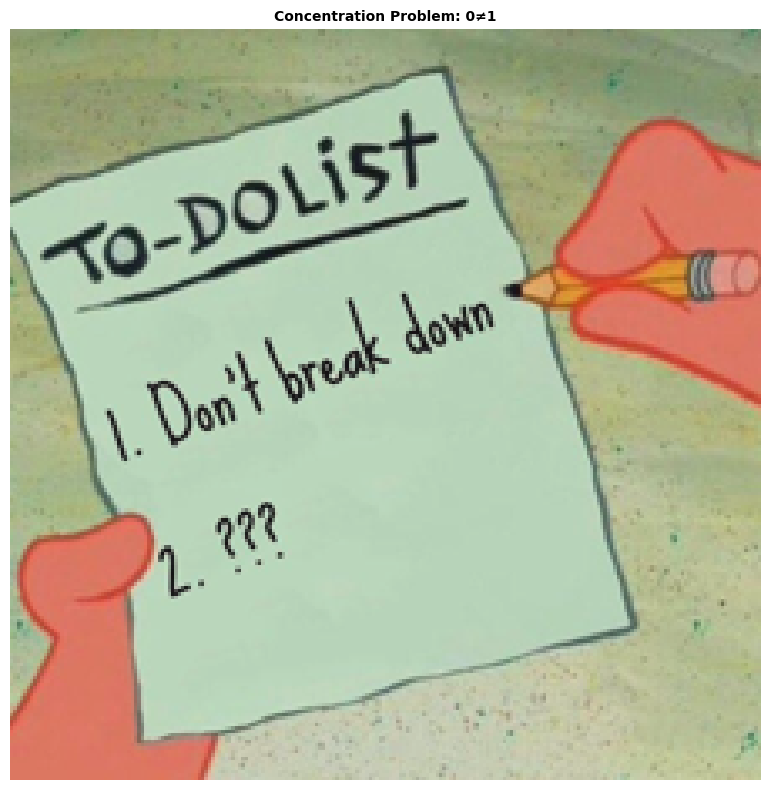


--- Misclassified examples for error pattern: Eating Disorder, Sleeping Disorder, Concentration Problem ---

Example 1 (ID: TE-514):
  Class Eating Disorder: Predicted 0, Actual 1 (confidence: 0.0058)
  Class Sleeping Disorder: Predicted 0, Actual 1 (confidence: 0.0004)
  Class Concentration Problem: Predicted 0, Actual 1 (confidence: 0.0001)
  OCR Text: self destructive tendencies, self isolation, depression naps, bad coping methods, bad eating and sleeping habits me my mental health
  Figurative Reasoning: 1. Cause-Effect: The meme shows a man and a woman, with the man looking at the woman and saying, "Me." This could be interpreted as a cause-effect relationship, where the man's actions or thoughts are directly related to the woman's appearance or behavior. 2. Figurative Understanding: The meme's underlying metaphor is that the man is the center of attention or the main focus in the scene. This could be interpreted as a symbolic representation of the man's ego or self-importance. 3

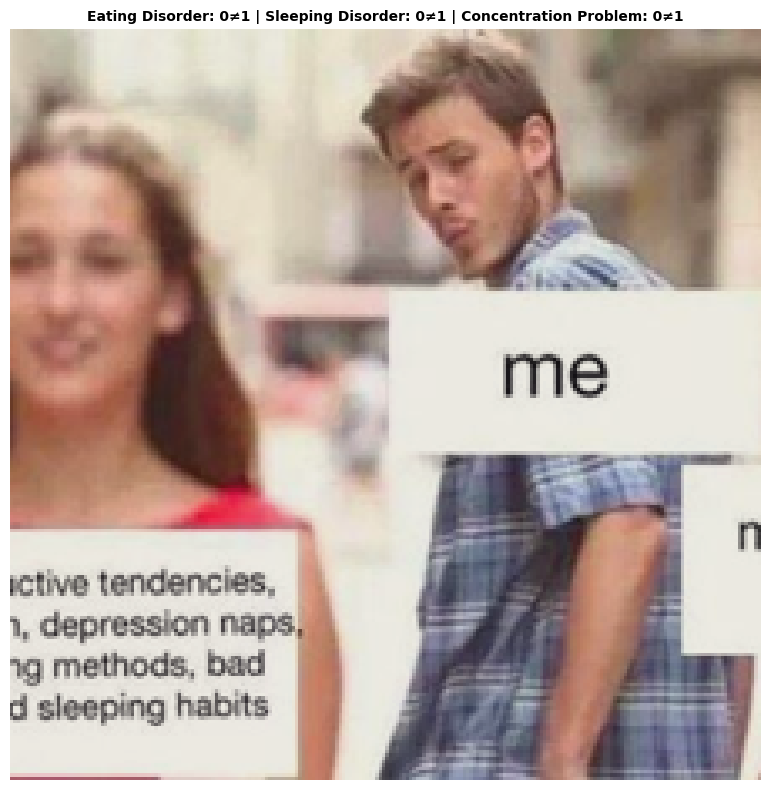


--- Misclassified examples for error pattern: Lack of Interest, Feeling Down ---

Example 1 (ID: TE-73):
  Class Lack of Interest: Predicted 0, Actual 1 (confidence: 0.0002)
  Class Feeling Down: Predicted 1, Actual 0 (confidence: 0.9997)
  OCR Text: BEDROOM KITCHEN BATH ALONE ROOM
  Figurative Reasoning: 1. Cause-Effect: The image shows a room with a sign that says "Alone Room." This could be interpreted as a cause for someone feeling lonely or isolated. The effect of this situation could be a negative impact on their mental health, such as depression or anxiety. 2. Figurative Understanding: The "Alone Room" sign can be seen as a metaphor for feelings of isolation or loneliness. It may symbolize the idea of a person being trapped in their own thoughts or emotions, unable to connect with others. 3. Mental State: The image suggests a state of loneliness or isolation, which can lead to negative emotions such as depression or anxiety. The person in the room might be experiencing feelings

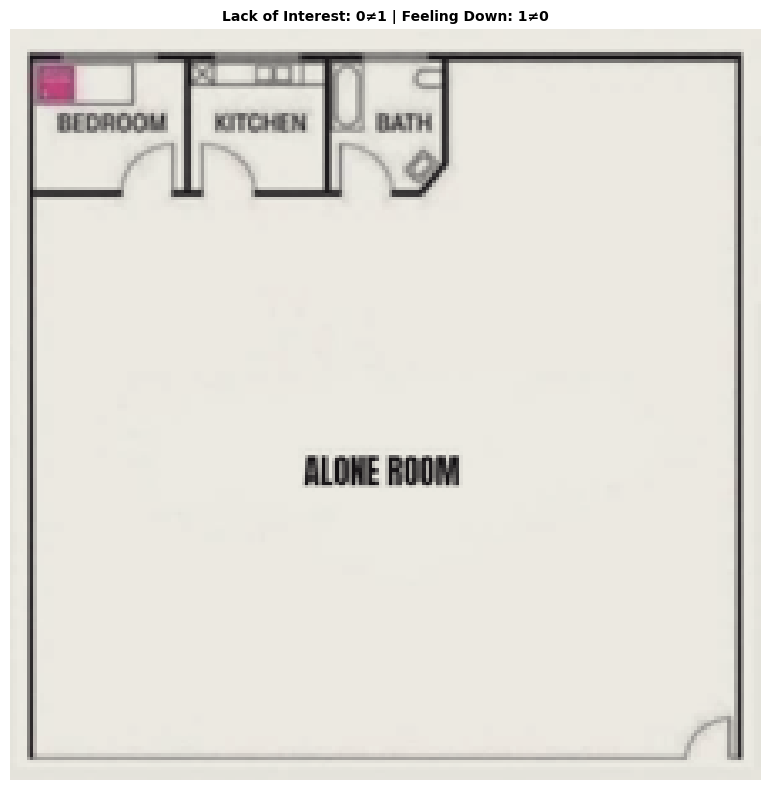


Example 2 (ID: TE-640):
  Class Lack of Interest: Predicted 0, Actual 1 (confidence: 0.0005)
  Class Feeling Down: Predicted 1, Actual 0 (confidence: 0.9988)
  OCR Text: I stopped caring a long time ago. XOXOX
  Figurative Reasoning: 1. Cause-Effect: The man in the image is described as "sad" and "depressed," which are the direct consequences of his actions. He is wearing a suit and tie, which suggests that he is in a professional setting, possibly at work. The meme implies that his work environment or job responsibilities might be causing him stress or dissatisfaction, leading to his sadness and depression. 2. Figurative Understanding: The meme can be interpreted as a metaphor for the challenges and pressures that people face in their professional lives. The man's attire, the suit and tie, symbolizes the formal and often demanding nature of work environments. The "long time" in the meme could represent the duration of the man's struggle with his emotional state, emphasizing the idea 

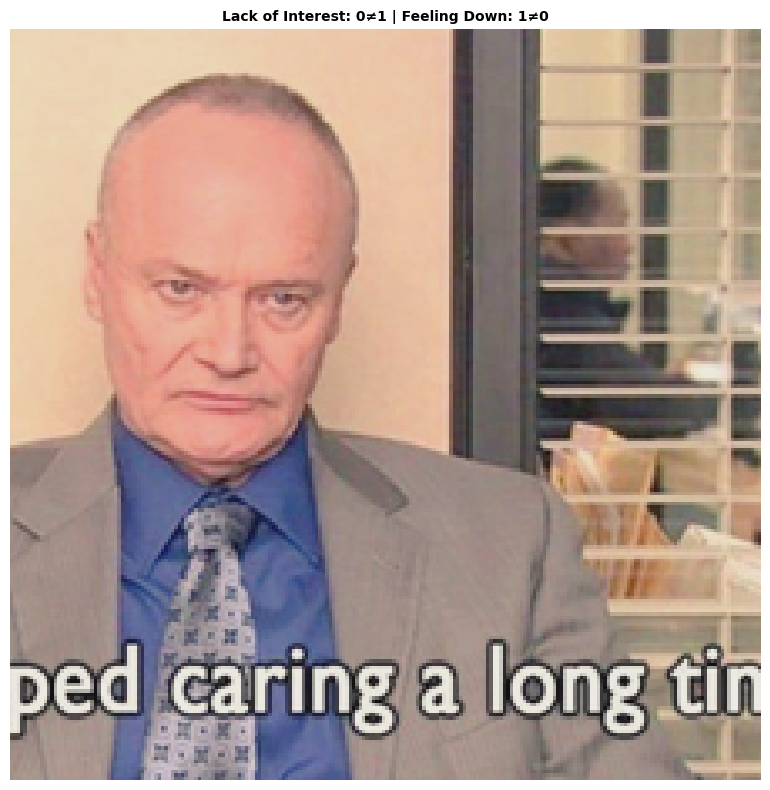


Example 3 (ID: TE-146):
  Class Lack of Interest: Predicted 0, Actual 1 (confidence: 0.0048)
  Class Feeling Down: Predicted 1, Actual 0 (confidence: 0.9929)
  OCR Text: My favorite part of social isolation is that I no longer have to think of excuses on why I can't go to social events
  Figurative Reasoning: 1. Cause-Effect: The meme shows a cartoon character, likely a character from the TV show "The Simpsons," sitting on the floor with a can of soda. The cause of this situation could be that the character is tired or bored, and the effect is that they are sitting on the floor with a can of soda. 2. Figurative Understanding: The meme might be interpreted as a representation of the character's mental state, such as feeling overwhelmed or exhausted. The can of soda could symbolize a temporary escape from reality or a coping mechanism for dealing with stress or boredom. 3. Mental State: The character appears to be in a state of exhaustion or boredom, as they are sitting on the floor wit

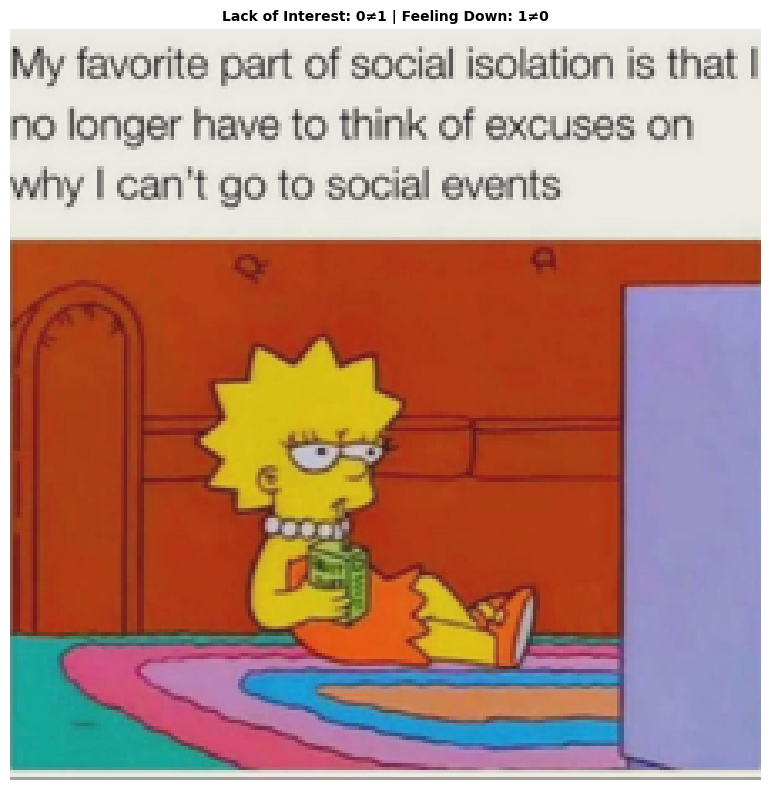


--- Misclassified examples for error pattern: Low Self-Esteem, Concentration Problem ---

Example 1 (ID: TE-655):
  Class Low Self-Esteem: Predicted 1, Actual 0 (confidence: 0.8954)
  Class Concentration Problem: Predicted 0, Actual 1 (confidence: 0.0014)
  OCR Text: Me not knowing Literally anything during a test When it's done you can go home and watch anime
  Figurative Reasoning: 1. Cause-Effect: The meme shows a girl holding a tiny figurine, which could represent a test or a challenge. The girl's mental state might be one of frustration or stress, as she is not enjoying the experience. 2. Figurative Understanding: The tiny figurine could symbolize a small problem or challenge that the girl is facing. The act of holding the figurine might represent her attempt to overcome the issue or deal with the situation. 3. Mental State: The girl appears to be in a negative or frustrated state, as she is not enjoying the experience of holding the tiny figurine. This could be due to the challe

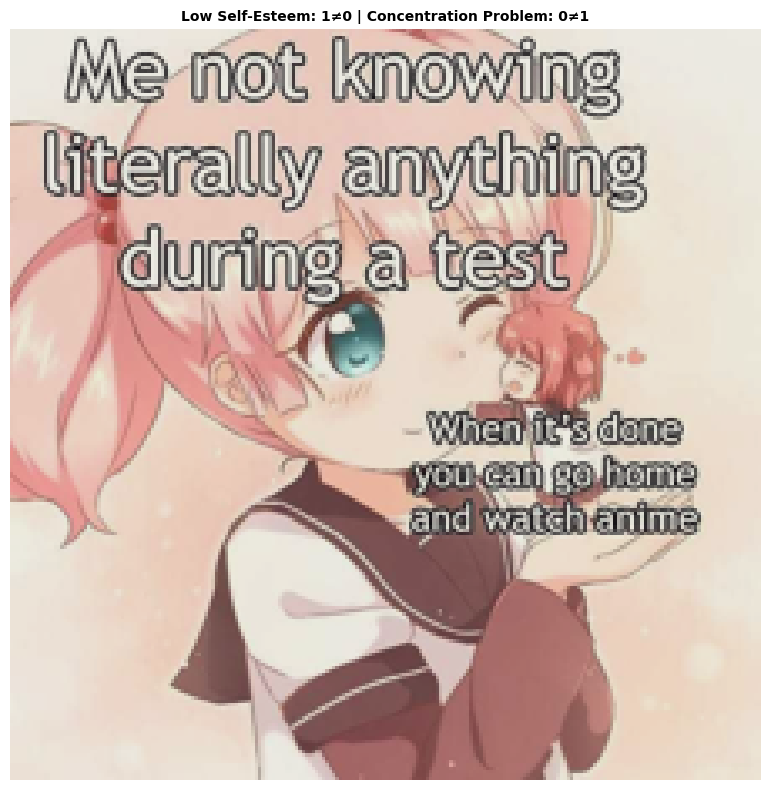


Example 2 (ID: TE-392):
  Class Low Self-Esteem: Predicted 1, Actual 0 (confidence: 0.8954)
  Class Concentration Problem: Predicted 0, Actual 1 (confidence: 0.0014)
  OCR Text: Me not knowing Literally anything during a test When it's done you can go home and watch anime
  Figurative Reasoning: 1. Cause-Effect: The meme shows a girl holding a tiny figurine, which could represent a test or a challenge. The girl's mental state might be one of frustration or stress, as she is not enjoying the experience. 2. Figurative Understanding: The tiny figurine could symbolize a small problem or challenge that the girl is facing. The act of holding the figurine might represent her attempt to overcome the issue or deal with the situation. 3. Mental State: The girl appears to be in a negative or frustrated state, as she is not enjoying the experience of holding the tiny figurine. This could be due to the challenge or problem she is facing, which might be overwhelming or difficult for her to handle.


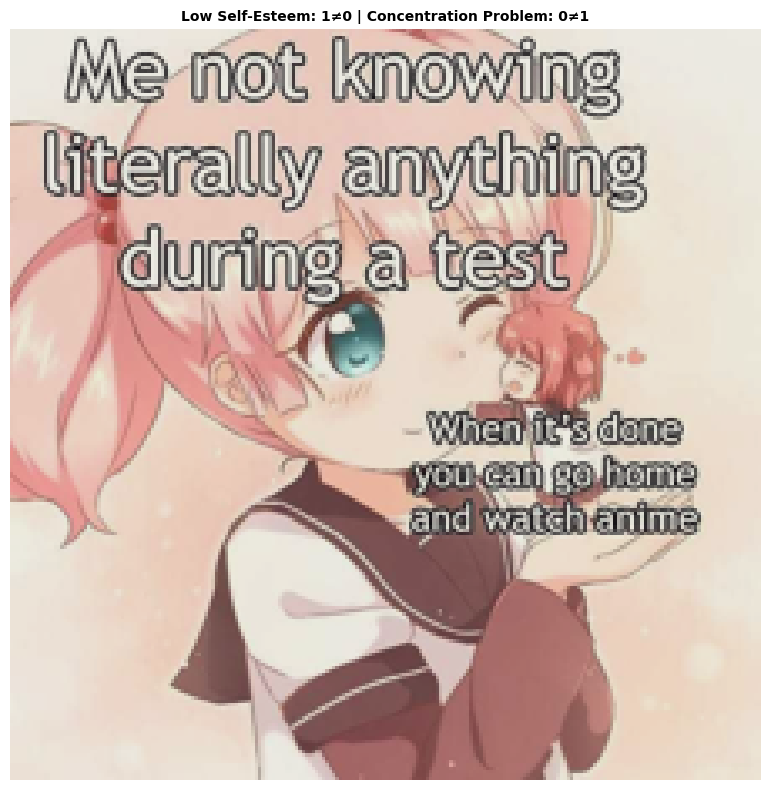


Example 3 (ID: TE-193):
  Class Low Self-Esteem: Predicted 0, Actual 1 (confidence: 0.0101)
  Class Concentration Problem: Predicted 0, Actual 1 (confidence: 0.0001)
  OCR Text: person: hey wanna hang out me: sorry can't i'm on a tight schedule today T-Mobile 12:47 PM 94% <March Event Details Edit eating my feelings 6 AM crying 7 AM 8 AM overthinking 9 AM 10 AM 11 AM Noon stressing but not doing anything about it 1 PM 2 PM eating my feelings 3 PM crying 4 PM 5 PM regretting every decision i've ever made 6 PM
  Figurative Reasoning: 1. Cause-Effect: The meme shows a calendar with various events and emotions written on it. The cause of the emotions could be related to the events or personal experiences. For example, the event "eating my feelings" might lead to emotions like sadness, stress, or overthinking. 2. Figurative Understanding: The meme uses a calendar to represent emotions and events, which can be interpreted as a metaphor for the human experience. The emotions and events are i

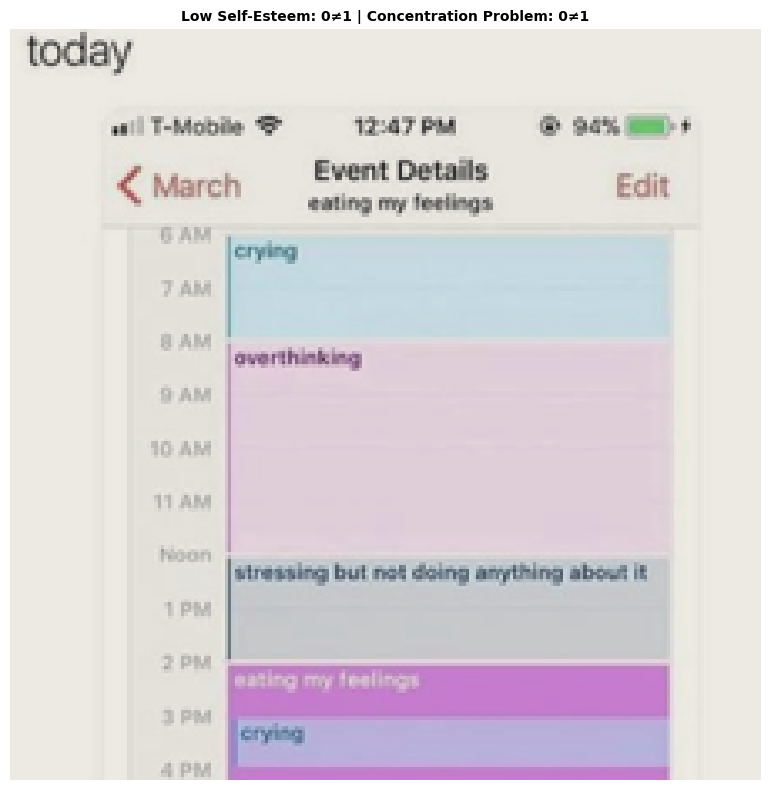


--- Misclassified examples for error pattern: Lack of Interest, Feeling Down, Concentration Problem ---

Example 1 (ID: TE-656):
  Class Lack of Interest: Predicted 0, Actual 1 (confidence: 0.0002)
  Class Feeling Down: Predicted 0, Actual 1 (confidence: 0.1197)
  Class Concentration Problem: Predicted 0, Actual 1 (confidence: 0.0001)
  OCR Text: The world with adventures, opportunities and challenges me: SAT KIDS
  Figurative Reasoning: 1. Cause-Effect: The meme shows a person lying in bed, crying, and has the words "The world with adventures, opportunities, and challenges" written above them. The cause of the person's distress could be the overwhelming feeling of having to face the challenges and opportunities in the world. 2. Figurative Understanding: The meme can be interpreted as a metaphor for the person's emotional state, with the bed representing a safe and comfortable space, and the person's distress being a reflection of the challenges and opportunities they face in life. 3.

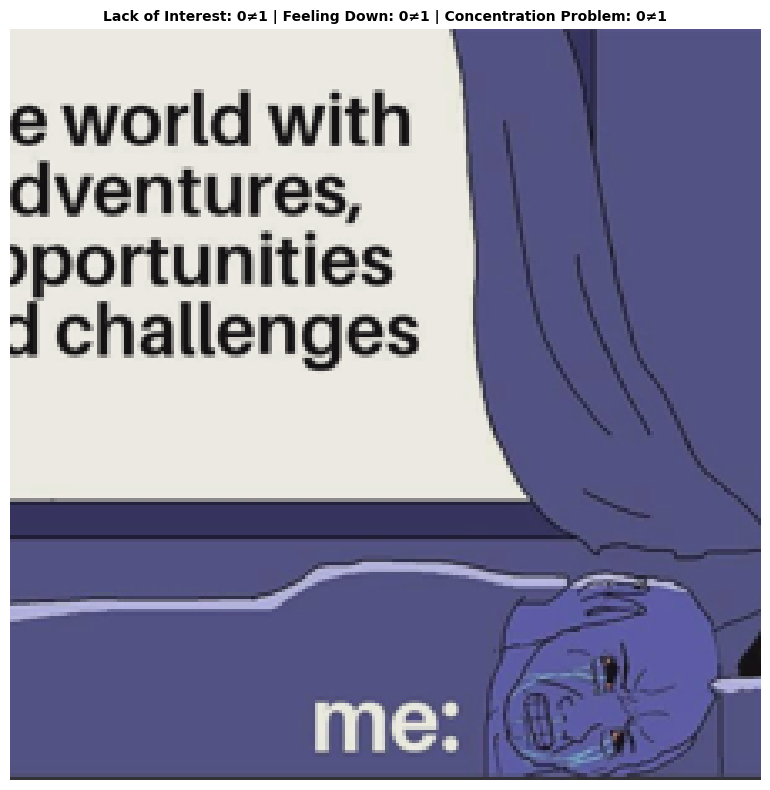


--- Misclassified examples for error pattern: Lack of Interest, Feeling Down, Self-Harm ---

Example 1 (ID: TE-649):
  Class Lack of Interest: Predicted 0, Actual 1 (confidence: 0.0002)
  Class Feeling Down: Predicted 0, Actual 1 (confidence: 0.0181)
  Class Self-Harm: Predicted 1, Actual 0 (confidence: 0.9953)
  OCR Text: When they ask you why you look so sad all the time and you hit them with "ah I'm just tired" See, I pulled a sneaky on ya.
  Figurative Reasoning: 1. Cause-Effect: The meme shows a man painting a picture while talking on the phone. The cause of this situation is that the man is multitasking, trying to paint and talk at the same time. The effect of this is that he is not focusing on his painting and might not be able to complete it properly. 2. Figurative Understanding: The meme can be interpreted as a metaphor for the idea of trying to do too many things at once and not giving enough attention to each task. The man in the meme is trying to paint and talk simultaneou

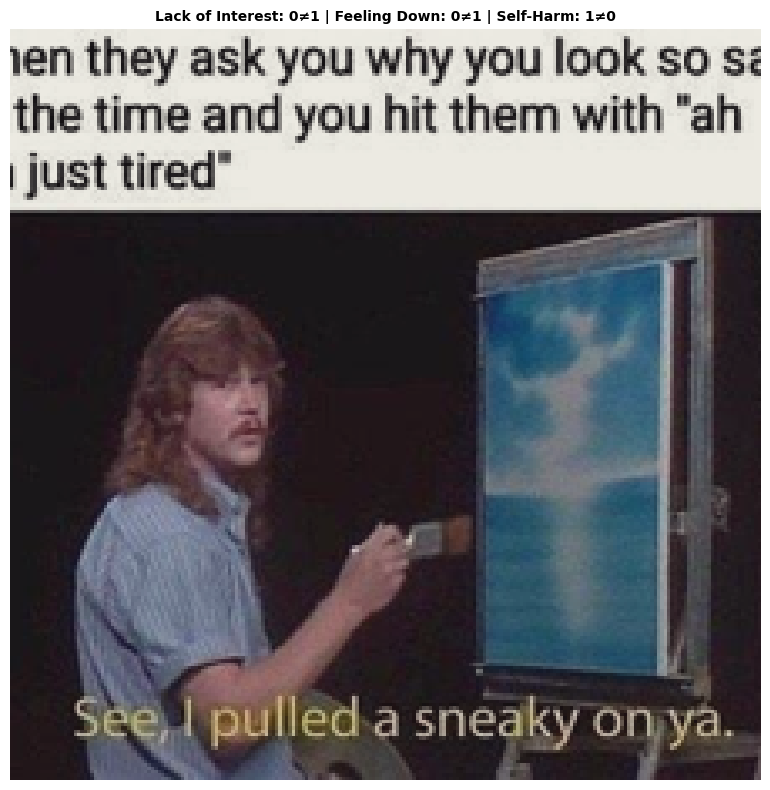


Example 2 (ID: TE-613):
  Class Lack of Interest: Predicted 0, Actual 1 (confidence: 0.0001)
  Class Feeling Down: Predicted 0, Actual 1 (confidence: 0.0031)
  Class Self-Harm: Predicted 1, Actual 0 (confidence: 0.9996)
  OCR Text: school makes me school makes me depressed school makes me suicidal school makes me anxious school makes me cry school makes me feel stupid school makes me sick school makes me so tired school makes me sad school makes me tired school makes me so stressed Department of education: Another job well done
  Figurative Reasoning: 1. Cause-Effect: The meme shows that school can make someone feel depressed, tired, and stressed. The cause of these negative emotions can be attributed to the demands and pressures of school, such as academic work, exams, and social expectations. 2. Figurative Understanding: The meme uses a humorous and exaggerated representation of the characters to convey the message. The characters are shown as if they are in a musical, with one of t

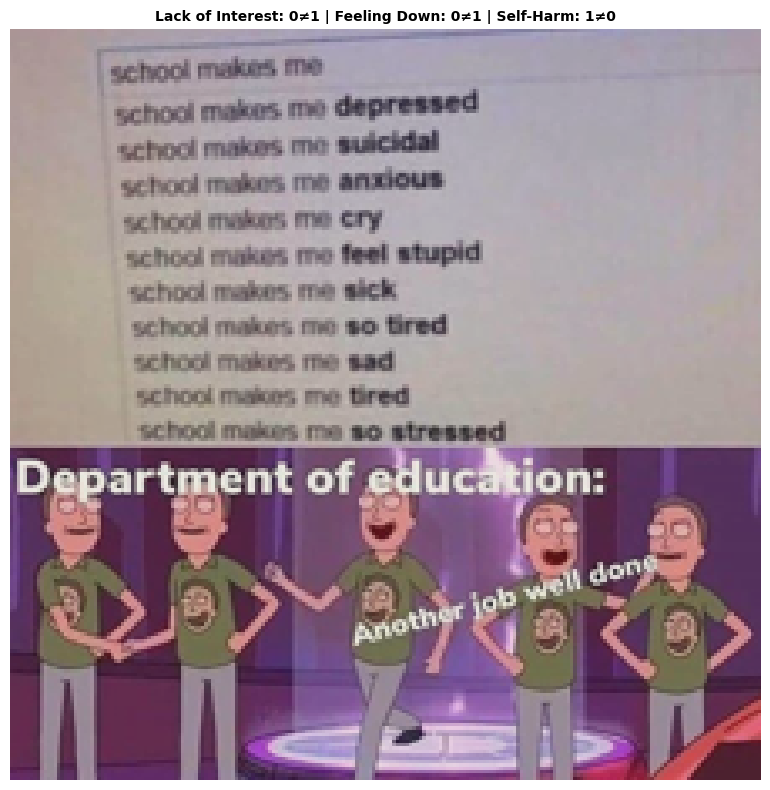


--- Misclassified examples for error pattern: Lack of Interest, Feeling Down, Sleeping Disorder, Self-Harm ---

Example 1 (ID: TE-577):
  Class Lack of Interest: Predicted 0, Actual 1 (confidence: 0.0002)
  Class Feeling Down: Predicted 0, Actual 1 (confidence: 0.0009)
  Class Sleeping Disorder: Predicted 1, Actual 0 (confidence: 0.6853)
  Class Self-Harm: Predicted 0, Actual 1 (confidence: 0.0266)
  OCR Text: 2019 LAZY BASTARD 2020 RESPONSIBLE ADULT
  Figurative Reasoning: 1. Cause-Effect: The man in the image is described as "lazy" and "bastard," which suggests that he may be perceived as irresponsible or lacking motivation. This could be a result of his behavior, such as not fulfilling his responsibilities or not putting in the effort to achieve his goals. 2. Figurative Understanding: The man's behavior could be seen as a form of self-sabotage, where he intentionally avoids taking responsibility for his actions or decisions. This could be a result of feeling overwhelmed, lacking mo

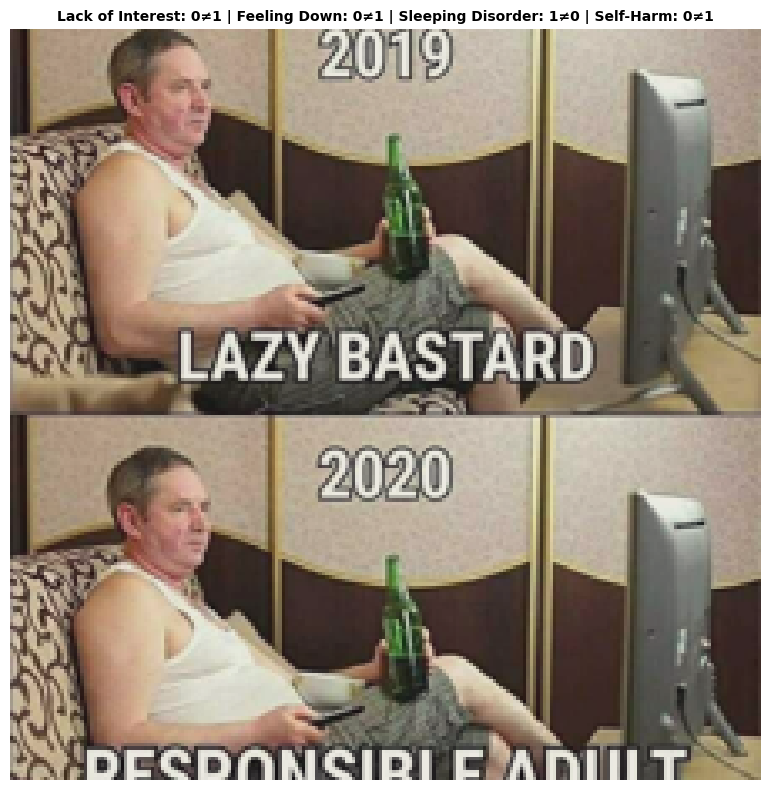


--- Misclassified examples for error pattern: Eating Disorder, Concentration Problem ---

Example 1 (ID: TE-615):
  Class Eating Disorder: Predicted 0, Actual 1 (confidence: 0.0286)
  Class Concentration Problem: Predicted 1, Actual 0 (confidence: 0.9804)
  OCR Text: synonyms for large: great, big, substantial, considerable, broad, extensive, vast, grand, huge, enormous THESAURUS.PLUS 4444
  Figurative Reasoning: 1. Cause-Effect: The image shows a large green turtle with its mouth open, possibly yawning or making a funny face. This could be a representation of feeling overwhelmed or burdened by life's challenges. 2. Figurative Understanding: The turtle's size and appearance can be interpreted as a metaphor for feeling "large" or "overwhelming" in one's emotions or problems. The turtle's facial expression might also symbolize vulnerability or a sense of being exposed. 3. Mental State: The turtle's facial expression and posture suggest feelings of vulnerability, stress, or emotional hea

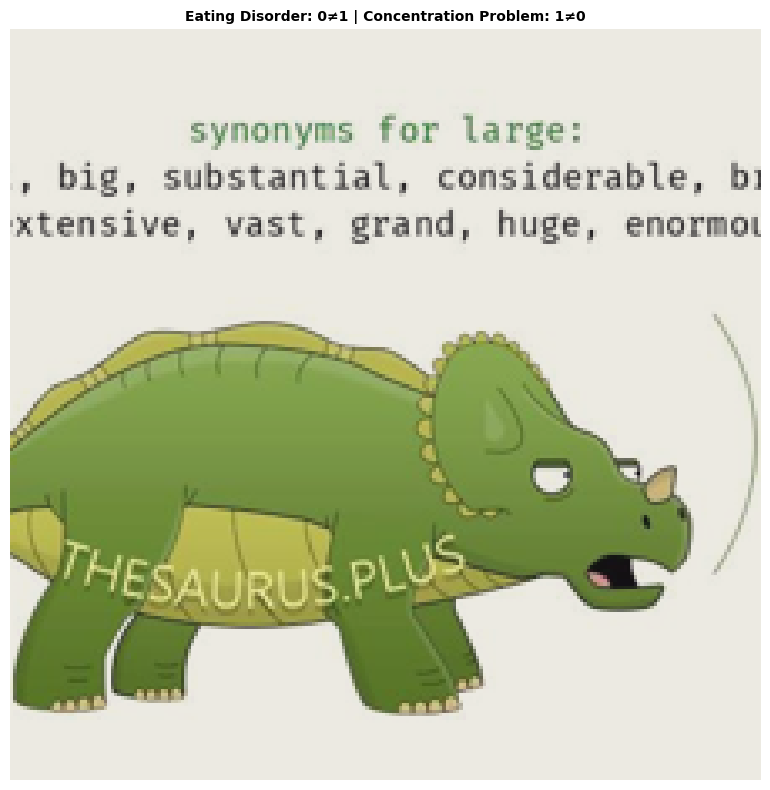


--- Misclassified examples for error pattern: Lack of Interest, Feeling Down, Low Self-Esteem ---

Example 1 (ID: TE-439):
  Class Lack of Interest: Predicted 0, Actual 1 (confidence: 0.0008)
  Class Feeling Down: Predicted 1, Actual 0 (confidence: 0.9901)
  Class Low Self-Esteem: Predicted 1, Actual 0 (confidence: 0.9926)
  OCR Text: Me: I need to stop being lonely and talk to people Someone: Hey Me:
  Figurative Reasoning: 1. Cause-Effect: The meme shows a cat with a long, fluffy tail, which is a metaphor for being lonely. The cat's long tail represents the feeling of loneliness, and the meme suggests that the cat is trying to stop being lonely by talking to people. 2. Figurative Understanding: The meme uses the cat's long tail as a symbol of loneliness, which is a common feeling experienced by many people. The cat's tail represents the emotional state of loneliness, and the meme encourages people to overcome this feeling by engaging in social interactions. 3. Mental State: The meme

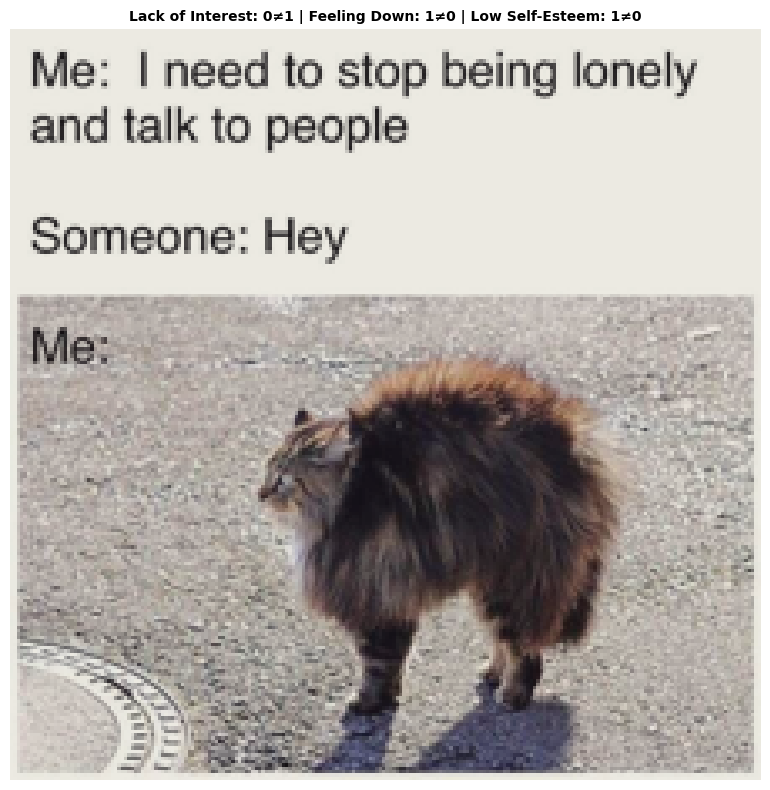


Example 2 (ID: TE-486):
  Class Lack of Interest: Predicted 0, Actual 1 (confidence: 0.0003)
  Class Feeling Down: Predicted 1, Actual 0 (confidence: 0.9816)
  Class Low Self-Esteem: Predicted 1, Actual 0 (confidence: 0.9232)
  OCR Text: Me ignoring text messages until I gain enough energy to be social again.
  Figurative Reasoning: 1. Cause-Effect: The meme shows a woman with headphones on, looking angry or upset. The cause of her anger could be related to the text messages she is receiving, which are described as "ignoring" or "irritating." The effect of these messages is that they are causing her to feel upset or annoyed. 2. Figurative Understanding: The meme can be interpreted as a metaphor for the negative impact of technology on our emotional well-being. The woman's angry facial expression and her use of headphones suggest that she is trying to block out the irritating messages, but they still manage to affect her mood. 3. Mental State: The woman in the meme is experiencing nega

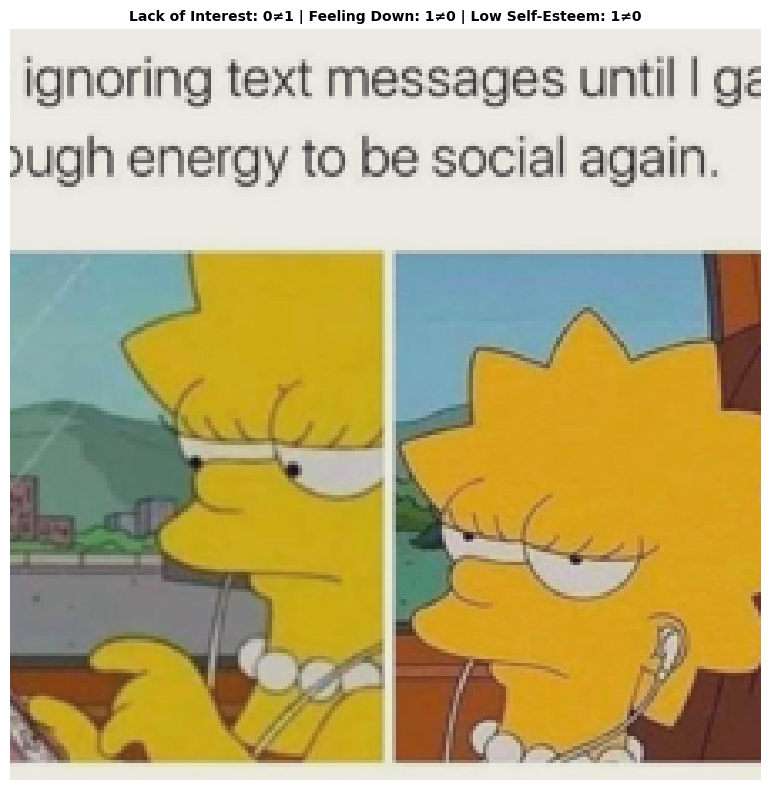


Example 3 (ID: TE-23):
  Class Lack of Interest: Predicted 1, Actual 0 (confidence: 0.9986)
  Class Feeling Down: Predicted 0, Actual 1 (confidence: 0.0008)
  Class Low Self-Esteem: Predicted 0, Actual 1 (confidence: 0.0007)
  OCR Text: "WANTS TO STAY QUIET TO AVOID COMPLICATION "UM-UM-EXCUSE ME.." ITS OK CUTE SAD KITTY, YOU HAVE FREEDOM OF SPEECH
  Figurative Reasoning: 1. Cause-Effect: The meme is about a sad kitten, which could be a result of loneliness, abandonment, or separation from its mother. 2. Figurative Understanding: The meme uses the phrase "It's ok to be a cute sad kitty," which implies that it's acceptable to feel sad or vulnerable, and that being cute can help alleviate the pain. 3. Mental State: The meme portrays the kitten as sad, lonely, or vulnerable, which could evoke feelings of empathy or sympathy from the viewers.


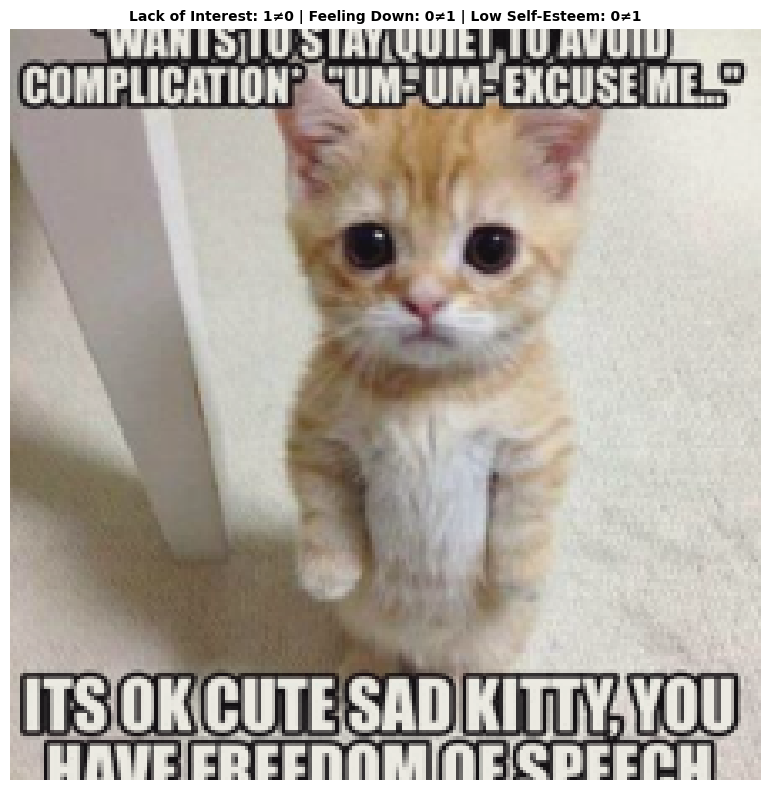


--- Misclassified examples for error pattern: Lack of Interest, Self-Harm ---

Example 1 (ID: TE-516):
  Class Lack of Interest: Predicted 0, Actual 1 (confidence: 0.0002)
  Class Self-Harm: Predicted 1, Actual 0 (confidence: 0.9994)
  OCR Text: If Earth stops rotating suddenly then you would fly East at 465 meters per second and die instantly. Denise Alvarado If it continues to rotate most of us will die slowly, painfully and afraid. Hmm... Giggle Space PLAPET OF RETROUS HIDE
  Figurative Reasoning: 1. Cause-Effect: The meme shows a person falling off a bench, which could be a result of trying to fly to the East. This action might be a metaphor for the consequences of attempting to achieve the unattainable or overreaching. 2. Figurative Understanding: The meme's underlying message could be about the dangers of overconfidence or attempting to do something that is beyond one's capabilities. The person trying to fly to the East might symbolize an unrealistic goal or an attempt to achiev

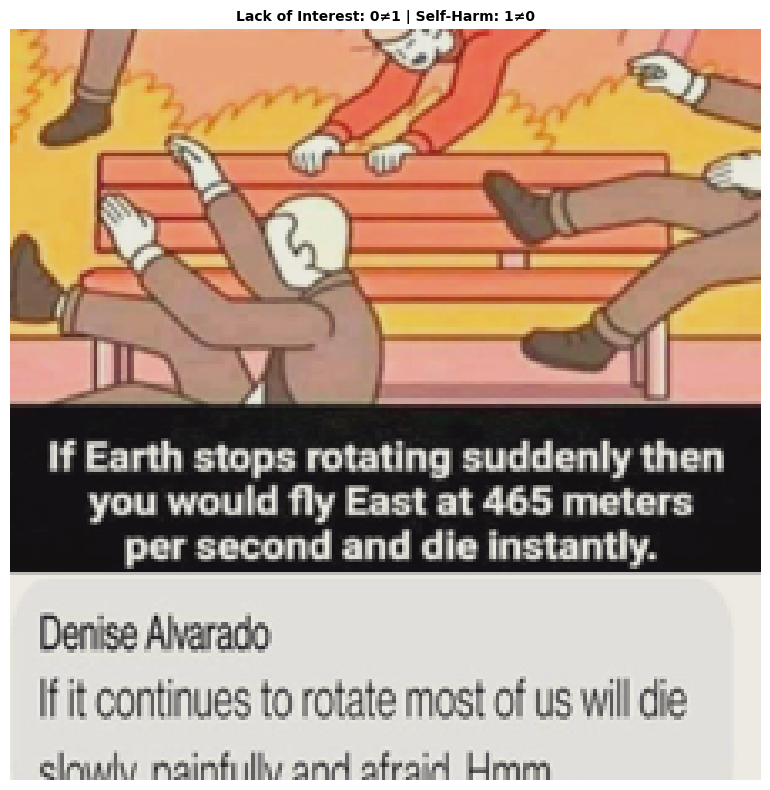


Example 2 (ID: TE-394):
  Class Lack of Interest: Predicted 0, Actual 1 (confidence: 0.0003)
  Class Self-Harm: Predicted 1, Actual 0 (confidence: 0.9984)
  OCR Text: I USED TO KILL THESE ANTS NOW WITH QUARANTINE THEY HAVE BECOME SOME OF MY CLOSEST FRIENDS imgflip.com
  Figurative Reasoning: 1. Cause-Effect: The man in the image is depressed because he is stuck in a room with a brick wall, and he is unable to leave. 2. Figurative Understanding: The man's situation can be interpreted as a metaphor for being trapped in a difficult or unpleasant situation, with no way out. 3. Mental State: The man appears to be feeling sad, lonely, or isolated, as he is sitting alone in a room with a brick wall.


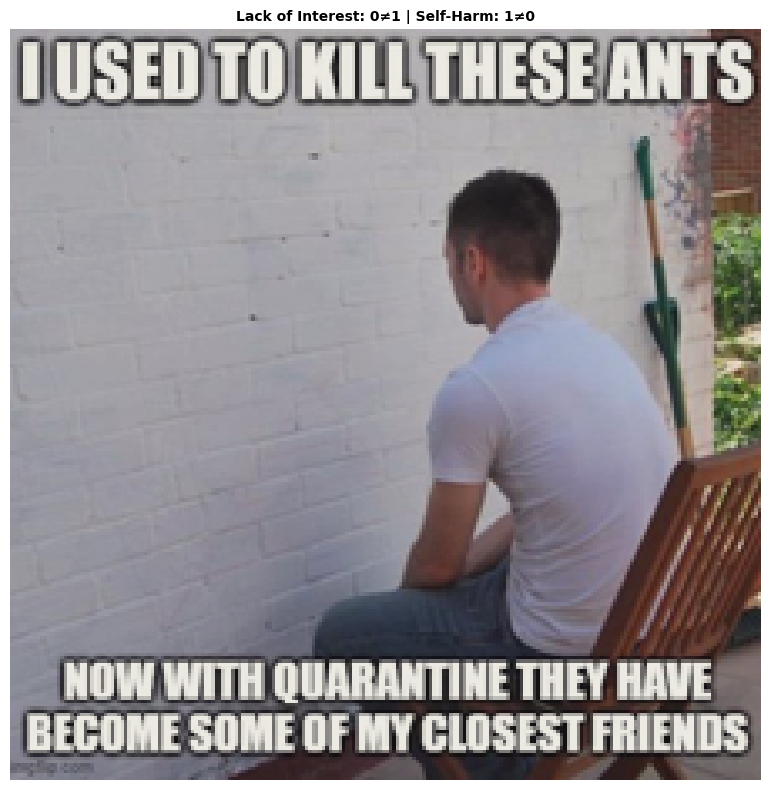


Example 3 (ID: TE-323):
  Class Lack of Interest: Predicted 0, Actual 1 (confidence: 0.0002)
  Class Self-Harm: Predicted 1, Actual 0 (confidence: 0.9938)
  OCR Text: ALRIGHT CAMPERS TODAY'S CHALLENGE IS TO FIND A REASON TO KEEP GOING
  Figurative Reasoning: 1. Cause-Effect: The meme is a cartoon of a man standing on a beach, with the words "Alright Campers" written above him. The cause of this situation could be that the man is participating in a camping activity or event, and the effect is that he is standing on the beach. 2. Figurative Understanding: The phrase "Alright Campers" is a play on words, as it can be interpreted as both an instruction to campers and a reference to the popular TV show "The Simpsons." The underlying metaphor is that the man is a character from the show, and he is standing on the beach, possibly as a result of a camping trip or adventure. 3. Mental State: The man in the cartoon appears to be in a relaxed and casual state, as he is standing on the beach with

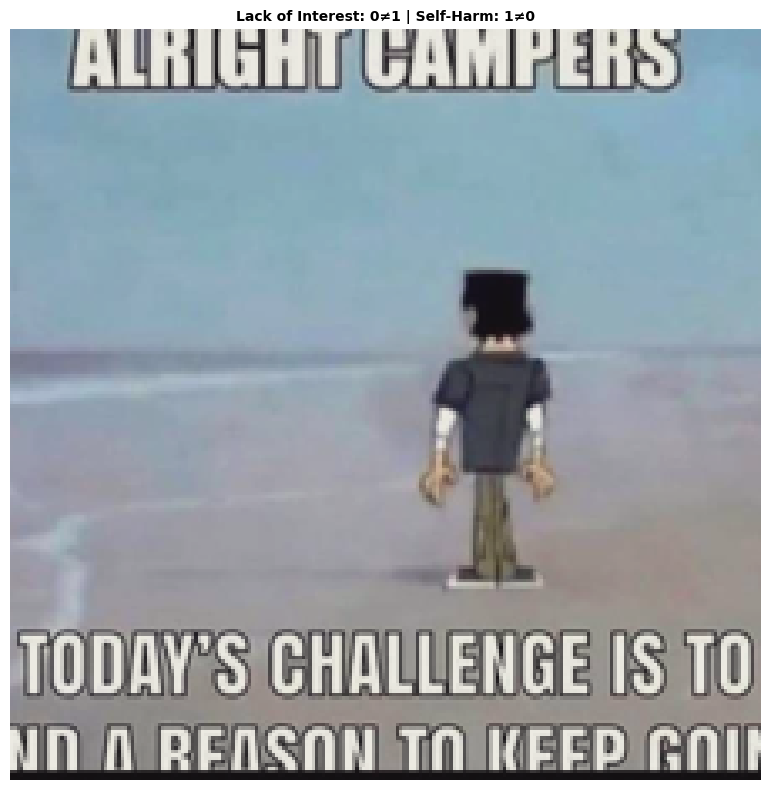


--- Misclassified examples for error pattern: Eating Disorder, Sleeping Disorder, Low Self-Esteem ---

Example 1 (ID: TE-520):
  Class Eating Disorder: Predicted 0, Actual 1 (confidence: 0.0000)
  Class Sleeping Disorder: Predicted 1, Actual 0 (confidence: 0.9822)
  Class Low Self-Esteem: Predicted 0, Actual 1 (confidence: 0.0009)
  OCR Text: Me deciding what I'm gonna think about to keep me up at night FUTURE PAST
  Figurative Reasoning: 1. Cause-Effect: The meme shows a cartoon character, possibly Spongebob, interacting with a Future button on a machine. This could be interpreted as a metaphor for the concept of planning for the future or making decisions that will affect one's future. 2. Figurative Understanding: The Future button represents a concept that is uncertain or unpredictable, as the future is not yet known. The cartoon character's interaction with the button could symbolize the idea of taking control of one's future by making decisions and planning for it. 3. Mental Stat

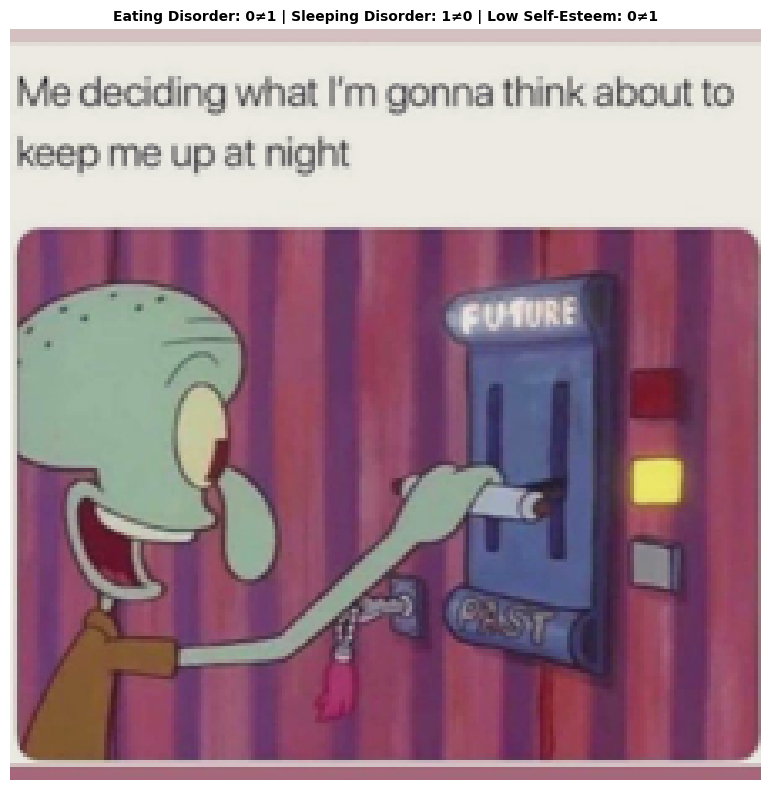


--- Misclassified examples for error pattern: Feeling Down, Sleeping Disorder, Self-Harm ---

Example 1 (ID: TE-252):
  Class Feeling Down: Predicted 0, Actual 1 (confidence: 0.0004)
  Class Sleeping Disorder: Predicted 1, Actual 0 (confidence: 0.9902)
  Class Self-Harm: Predicted 0, Actual 1 (confidence: 0.0176)
  OCR Text: THIS WORLD IS SO CRUEL AND I DON'T WANNA SEE TT ANYMORE
  Figurative Reasoning: 1. Cause-Effect: The meme is a cartoon drawing of a girl sleeping next to a teddy bear, with the words "This world is so cruel and I don't want to see it anymore." The cause of the girl's sadness could be the harshness of the world, and the effect is her desire to escape from it. 2. Figurative Understanding: The meme uses a metaphorical representation of the girl asleep next to the teddy bear, which symbolizes comfort and security. The underlying message is that the girl seeks solace and protection from the world's cruelty, just as the teddy bear provides a sense of safety and companio

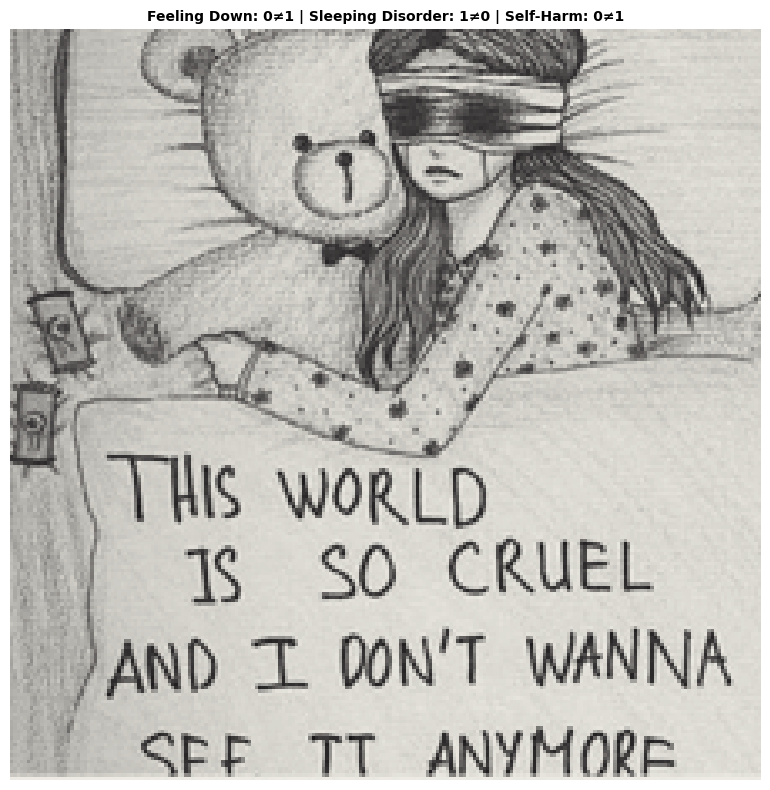


Example 2 (ID: TE-369):
  Class Feeling Down: Predicted 0, Actual 1 (confidence: 0.0004)
  Class Sleeping Disorder: Predicted 1, Actual 0 (confidence: 0.9213)
  Class Self-Harm: Predicted 0, Actual 1 (confidence: 0.0078)
  OCR Text: MB KEY TO FUN AGES 8 to DULT JECT: AST AYER WTH OLES DARD STAY ALIVE GAME THE ULTIMATE GAME OF WAKING UP EVERY GODDAMN DAY AND DOING THE SAME SHIT OVER AND OVER AND OVER FUCK ME STAY ALIVE GAME 1 WAKE UP 2 GO TO WORK; OR DON'T 3 BEDTIME AGAIN!
  Figurative Reasoning: 1. Cause-Effect: The woman in the image is drinking wine and appears to be in a state of depression. The cause of her depression could be related to her personal life, work, or relationships. 2. Figurative Understanding: The image of the woman drinking wine and looking sad can be interpreted as a metaphor for coping with difficult situations or emotions. The wine might symbolize an attempt to numb the pain or sadness, but it may not provide a long-term solution. 3. Mental State: The woman in t

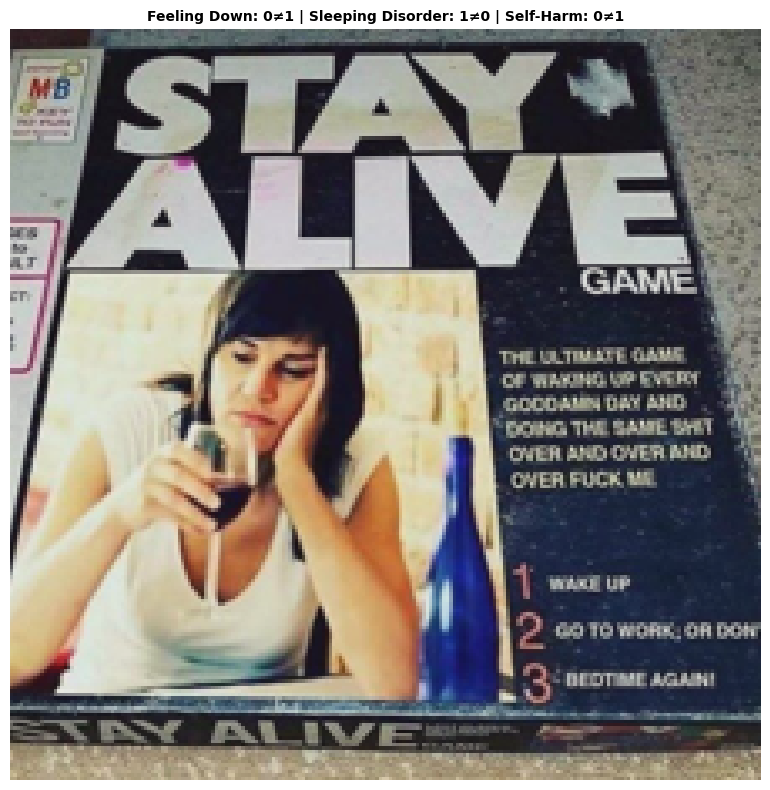


--- Misclassified examples for error pattern: Feeling Down, Eating Disorder, Concentration Problem ---

Example 1 (ID: TE-456):
  Class Feeling Down: Predicted 1, Actual 0 (confidence: 0.9932)
  Class Eating Disorder: Predicted 0, Actual 1 (confidence: 0.0001)
  Class Concentration Problem: Predicted 0, Actual 1 (confidence: 0.0001)
  OCR Text: Me in a deep depression unable to do anything Anxiety telling me if I don't do anything I'm a piece of shit
  Figurative Reasoning: 1. Cause-Effect: The meme is discussing the cause and effect relationship between anxiety and depression. The man in the image is experiencing anxiety, which can lead to depression. 2. Figurative Understanding: The meme uses a metaphor to describe the depth of depression. It compares the depth of depression to a deep hole, suggesting that depression can be overwhelming and difficult to escape from. 3. Mental State: The meme portrays the man as being in a state of anxiety and depression. He is experiencing negative 

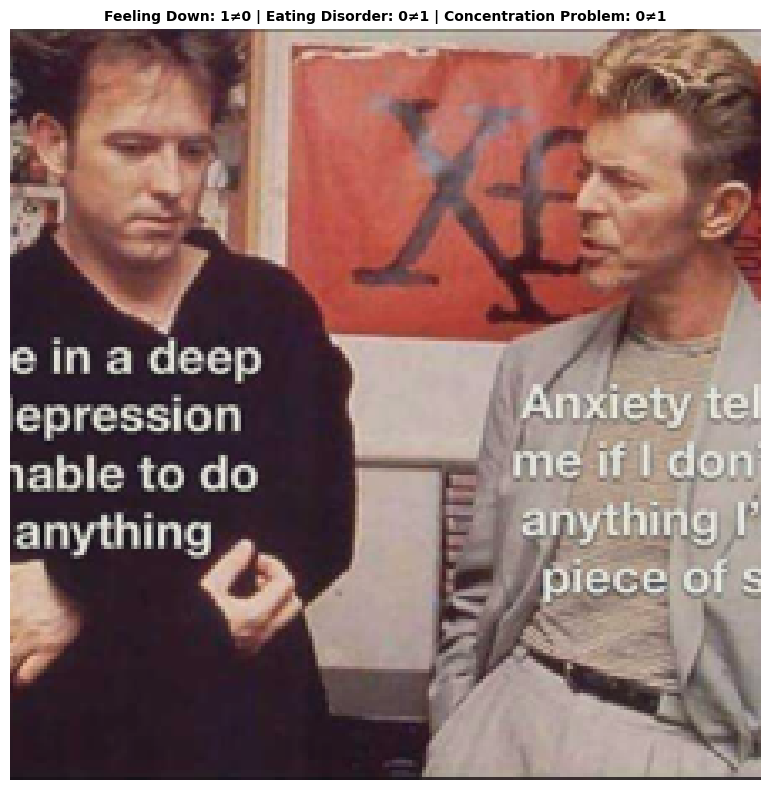


--- Misclassified examples for error pattern: Feeling Down, Eating Disorder, Self-Harm ---

Example 1 (ID: TE-42):
  Class Feeling Down: Predicted 0, Actual 1 (confidence: 0.0006)
  Class Eating Disorder: Predicted 1, Actual 0 (confidence: 0.9738)
  Class Self-Harm: Predicted 0, Actual 1 (confidence: 0.0631)
  OCR Text: Coronavirus can be deadly I have a good immune system and won't die won't die Imgilp.com Panik Kalm Panik
  Figurative Reasoning: 1. Cause-Effect: The meme shows a headline that reads "I can become dangerously panic." This implies that experiencing panic can lead to dangerous situations, such as loss of control, anxiety, or even physical harm. 2. Figurative Understanding: The meme uses a headline to represent a person's mental state, specifically panic. This could be interpreted as the headline personifying the panic and making it seem like a character or a living being. 3. Mental State: The meme shows a headline that reads "I can become dangerously panic." This sugges

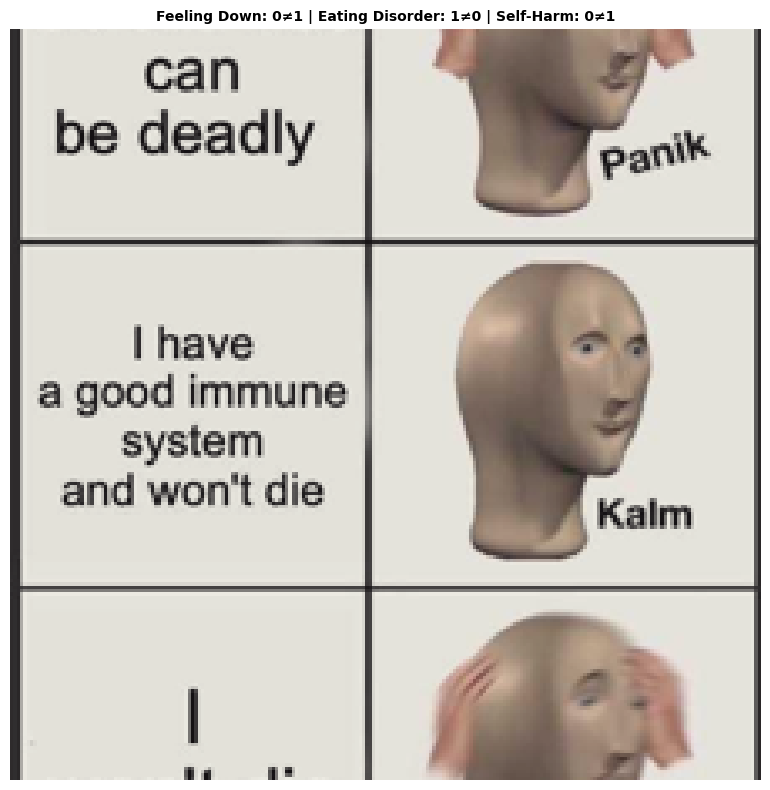


--- Misclassified examples for error pattern: Feeling Down, Sleeping Disorder, Low Self-Esteem, Self-Harm ---

Example 1 (ID: TE-616):
  Class Feeling Down: Predicted 0, Actual 1 (confidence: 0.0002)
  Class Sleeping Disorder: Predicted 0, Actual 1 (confidence: 0.0017)
  Class Low Self-Esteem: Predicted 1, Actual 0 (confidence: 0.9896)
  Class Self-Harm: Predicted 0, Actual 1 (confidence: 0.0008)
  OCR Text: Strict parents: We force our child to excel in his classes so he can find a suitable job Their child: u/Cluckcold
  Figurative Reasoning: 1. Cause-Effect: The meme is about parents trying to find suitable jobs for their children. The cause is the desire to provide a suitable job for their child, and the effect is the frustration and stress experienced by the parents in their search. 2. Figurative Understanding: The meme uses a cartoon cat to represent the parents and a bottle to represent the job search. The cat's facial expression and body language convey the frustration and stre

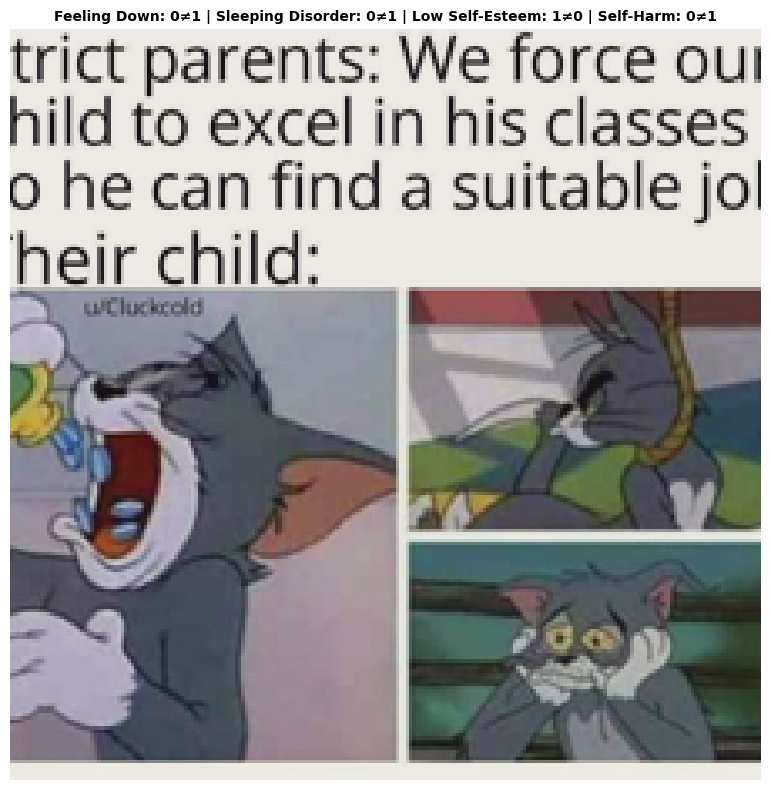


--- Misclassified examples for error pattern: Eating Disorder, Low Self-Esteem, Concentration Problem, Self-Harm ---

Example 1 (ID: TE-417):
  Class Eating Disorder: Predicted 0, Actual 1 (confidence: 0.0007)
  Class Low Self-Esteem: Predicted 1, Actual 0 (confidence: 0.7432)
  Class Concentration Problem: Predicted 0, Actual 1 (confidence: 0.0000)
  Class Self-Harm: Predicted 1, Actual 0 (confidence: 0.9182)
  OCR Text: : Anonymous 05/02/19(Thu)09:49:59 No.52223965 1506610241340.png 36 KB PNG >maybe another day of masturbation and video games will improve my life
  Figurative Reasoning: 1. Cause-Effect: The meme shows a cartoon character with a sad face and the words "Maybe another day of masturbation and video games will improve my life." This suggests that the person might be feeling depressed or unfulfilled in their current situation, and they are seeking comfort or escape through these activities. 2. Figurative Understanding: The meme uses humor and irony to convey a deeper mess

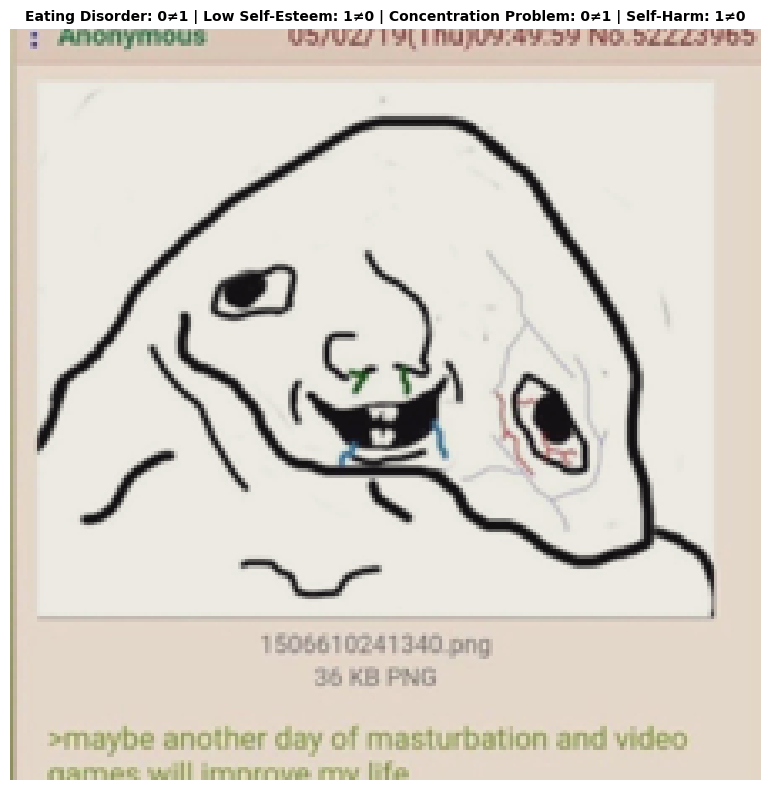


--- Misclassified examples for error pattern: Lack of Interest, Eating Disorder ---

Example 1 (ID: TE-37):
  Class Lack of Interest: Predicted 0, Actual 1 (confidence: 0.0001)
  Class Eating Disorder: Predicted 1, Actual 0 (confidence: 0.9903)
  OCR Text: Social Interaction Weebs This is Good Weebs But I like this better Hentai
  Figurative Reasoning: 1. Cause-Effect: The meme is about a person who is upset or depressed, possibly due to social interaction or anime. 2. Figurative Understanding: The meme uses the phrase "This is good" to express the person's negative emotions, which is a play on words, as it is meant to be ironic. 3. Mental State: The person in the meme is experiencing negative emotions, such as sadness or frustration, as a result of their social interaction or anime.


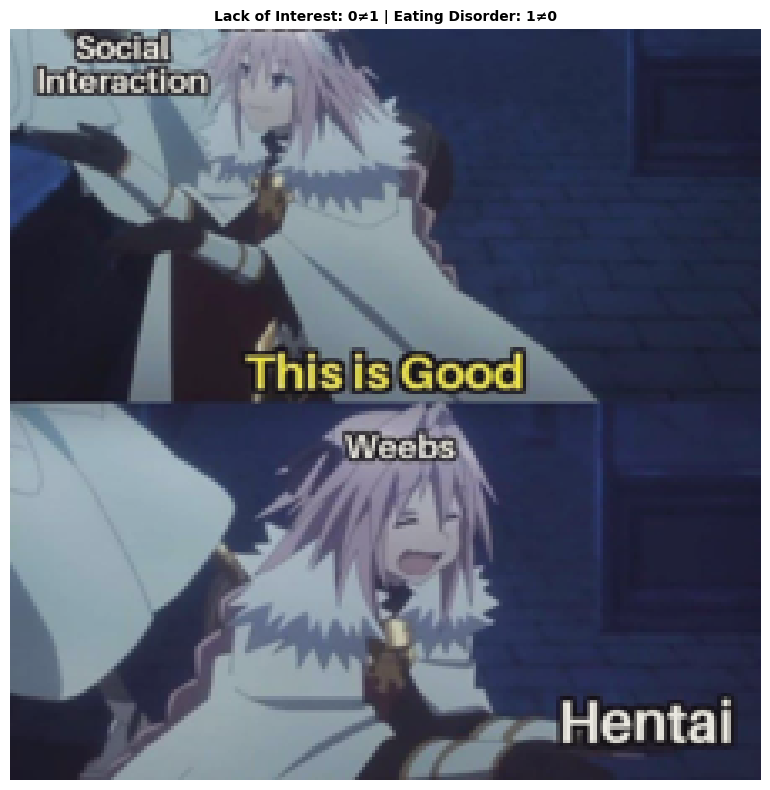


--- Misclassified examples for error pattern: Concentration Problem, Self-Harm ---

Example 1 (ID: TE-591):
  Class Concentration Problem: Predicted 0, Actual 1 (confidence: 0.0019)
  Class Self-Harm: Predicted 1, Actual 0 (confidence: 0.8736)
  OCR Text: NOOO YOU MUST USE THESE MENTAL MODELS AND DECISION FRAMEWORKS TO MAKE A RATIONAL DECISION JUST DO IT 34% 34% 68% 0.1% 2% 14% 14% 2% 0.1% 95% 10 score 55 70 85 100 115 130 145 imgflip.com JUST DO IT
  Figurative Reasoning: 1. Cause-Effect: The meme shows a graph with a negative trend, which could indicate a decline in mental well-being. The cause of this decline could be stress, lack of support, or other factors that contribute to depression. 2. Figurative Understanding: The meme uses a graph to represent emotions, specifically depression. The graph's negative trend symbolizes the downward spiral of emotions experienced by someone suffering from depression. 3. Mental State: The meme depicts a person experiencing depression, as indicat

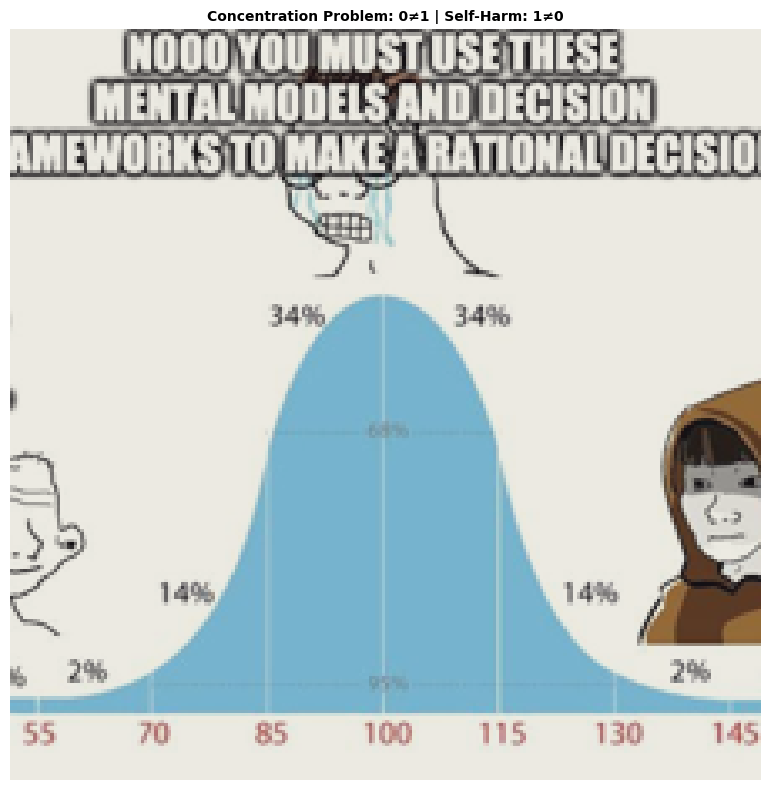

Test Loss: 0.6510
Test Macro-F1: 0.6606, Weighted-F1: 0.6628


(0.6605834165838174, 0.6627579210659941)

In [21]:
inference_misclassified(test_data, "multimodal_depression.pth")